# CA-PT2 parameter Analysis
### Structure
* Imports
    * Libraries: necessary Python Libraries
    * MAT data imports: Importing the estimated from the files generated in MATLAB.
* Calculations
    * Accuracy Metric: Measures how well the estimated CA-PT2 model fits the real data 
    * PT2 properties: Calculation of Peak time, settling time and overshoot
* Filtering: Filtering out parameter outliers
* Overview: Creates a DataFrame that includes the mean and standard deviation per driver per velocity class for every parameter
* Representation: Visualized the data for analysis
    * Overall: All of the filtered data
    * Per Driver: Sorting dataset by driver only
    * Per Velocity Class: Sorting by Velocity Class only
    * Per Driver Per Velocity Class
    * 2 drivers compared
    * Per Velocity Class Per Driver
### Attention:
* Make sure to change all of the paths in the file (in the Runnables) so it can run on your system.
    * Default saves to: "C:/git/kdp_hlb_evalframework/_temp/"

# Imports

## Libraries

In [1]:
import pandas as pd
import os
import json
import math
import random
import numpy as np
from scipy.io import loadmat
from scipy import signal
import scipy.stats as stats
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.cluster import KMeans, DBSCAN
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import  PCA
import seaborn as sns

## MAT data

### Methods

* get_speedup_reason(trip_name, speedup_index)
    * Extracts the driving event reason list from the info json file corresponding to a trip
    * Inputs: 
        * trip_name (string) -- name of the trip that is analyzed e.g. "14_20210719_1626665410733632_CT6_AVT_V3_export" 
        * speedup_index (int) -- index of the speedup in the trip (trip has multiple speedups, this tells us which one it is)
    * Outputs:
        * returns a list containing the driving event reasons extracted in "driving_event_metadata_analysis.py"
* speedup_length_filter(trip_name, speedup_index)
    * Filters out extracted speedup that are too long in terms of time 
    * Inputs: 
        * trip_name (string) -- name of the trip that is analyzed e.g. "14_20210719_1626665410733632_CT6_AVT_V3_export" 
        * speedup_index (int) -- index of the speedup in the trip (trip has multiple speedups, this tells us which one it is)
    * Outputs:
        * returns False if the speedup is too long to be analyzed for the CA-PT2 model
        * returns True otherwise
* get_ca_pt2_parameters(start, end, mat_dict, df)
    * Extracts the CA-PT2 parameters out of the MAT file crated during the MATLAB parameter estimation.
    * Inputs:
        * start (int) -- index of the first trip in trip_info that is analyzed
        * end (int) -- index of the last trip in trip_info that is analyzed
        * mat_dict (dictionary) -- The MAT file where the CA-PT2 parameters are saved as a dictionary
        * trip_infos (pandas DataFrame) -- maps the trip_name to the driver_id, includes information about how many speedups a trip has and serves as an overview of all the speedups whose parameters can be estimated.
    * Outputs:
        * parameters_df (pandas DataFrame): The DataFrame has several columns
            * "trip_name" (string) -- name of the trip that is analyzed
            * "speedup_index" (int) -- index of the speedup that is analyzed within the trip
            * "driver_id" (string) -- name of the driver specified in "ArchiveCheck_update.csv"
            * "velocity_class" (string) -- velocity category extracted as a driving event reason during the Metadata analysis. Possible Categories are:
                * "zero_to_low_speed_up"
                * "zero_to_mid_speed_up"
                * "zero_to_high_speed_up",
                * "low_to_low_speed_up"
                * "low_to_mid_speed_up"
                * "low_to_high_speed_up",
                * "mid_to_mid_speed_up"
                * "mid_to_high_speed_up"
                * "high_to_high_speed_up",
            * "highway_driving" (boolean) -- whether or not any section during the speedup time sequence had a "highway" signal active.
            * "D" (float) -- damping parameter of the PT2 part of the PT2 model
            * "w0" (float) --  natural frequency of the PT2 part of the PT2 model and it represents the frequency of the oscillation of the system without damping 
            * "tc" (float) -- time point at which the CA part ends and the PT2 part starts
            * "alfa" (float) -- gradient of the CA part of the CA-PT2 model
            * "t_delay" (float) -- time delay when the CA part of the CA-PT2 model starts
* get_ca_pt2_element(ca_pt2_parameters, U)
    * gets the CA-PT2 signal element at a specific time point
    * Inputs:
        * ca_pt2_parameters (list) -- the CA-PT2 parameters estimated for a specific speedup in the order [D, w0, tc, alfa, t_delay]
        * U -- time point in question
    * Outputs:
        * Y (float) -- element of the estimated CA_PT2 signal at time U 
* get_ca_pt2_signal(data_path, trip_name, speedup_index, ca_pt2_parameters_df)
    *  Returns the step response of the estimated CA-PT2 model
    * Inputs:
        * data_path (string) -- path to the folder that includes the per trip folders that include the speedup window data as csv
        * trip_name (string) -- name of the trip that is analyzed e.g. "14_20210719_1626665410733632_CT6_AVT_V3_export" 
        * speedup_index (int) -- index of the speedup in the trip (trip has multiple speedups, this tells us which one it is)
        * ca_pt2_parameters_df (pandas DataFrame) -- includes all of the parameters extracted from the MAT file along with the trip_name and the speedup_index
    * Outputs:
        * t (numpy array) -- the time signal of the speedup
        * y (numpy array) -- the step response of the estimated CA-PT2 model

In [4]:
def get_speedup_reason(trip_name, speedup_index):
    info_path = "C:/git/kdp_hlb_evalframework/_temp/driving_event_window_info/" + trip_name + "_info.json"
    with open(info_path, 'r') as open_file:
        read_list = json.load(open_file)
    for window_dict in read_list:
        if window_dict['data'] == 'speed_up'+str(speedup_index)+'.csv':
            return window_dict['driving_event_reason']

In [5]:
def speedup_length_filter(trip_name, speedup_index):
    MAX_SPEEDUP_LENGTH = 750
    info_path = "C:/git/kdp_hlb_evalframework/_temp/driving_event_window_info/" + trip_name + "_info.json"
    with open(info_path, 'r') as open_file:
        read_list = json.load(open_file)
    for window_dict in read_list:
        if window_dict['data'] == 'speed_up'+str(speedup_index)+'.csv':
            length = int(window_dict['length'])
            if length > MAX_SPEEDUP_LENGTH:
                return False
            else:
                return True

In [6]:
def get_ca_pt2_parameters(start, end, mat_dict, trip_infos):
    parameters_df = pd.DataFrame(columns=["trip_name", "speedup_index", "driver_id", "velocity_class", "highway_driving", "D", "w0", "tc", "alfa", "t_delay"])
    velocity_classes = ["zero_to_low_speed_up", "zero_to_mid_speed_up", "zero_to_high_speed_up",
                "low_to_low_speed_up", "low_to_mid_speed_up", "low_to_high_speed_up",
                "mid_to_mid_speed_up", "mid_to_high_speed_up", "high_to_high_speed_up",
                ]
    end = min(end, trip_infos.shape[0])
    for i in range(start, end):
        number_of_speedups = trip_infos['number_of_speedups'][i]
        trip_name = trip_infos['trip_name'][i]
        driver_id = trip_infos['subject_id'][i]
        for j in range(number_of_speedups-1):
            parameter_string = "trip{index}_speedup_{speedup_index}_parameter".format(index = i, speedup_index = j)
            parameters = mat_dict[parameter_string][0]
            reasons = get_speedup_reason(trip_name=trip_name, speedup_index=j)
            velocity_class = "unknown"
            highway_driving = False
            for reason in reasons:
                if reason in velocity_classes:
                    velocity_class = reason 
            if "highway_driving" in reasons:
                highway_driving = True
            #parameters are [K, w0, D] 
            # speedups that are too long or have a "turn" reason are removed from the analyzed dataset
            if not "turn" in reasons and speedup_length_filter(trip_name=trip_name, speedup_index=j):
                parameters_df.loc[-1] = [trip_name, j, driver_id, velocity_class, highway_driving, parameters[0], parameters[1], parameters[2], parameters[3],parameters[4]]
                parameters_df.index = parameters_df.index + 1
    return parameters_df

In [7]:
def get_ca_pt2_element(ca_pt2_parameters, U):
    # returns output value based on time = U
    D = ca_pt2_parameters[0]
    T = 1/ca_pt2_parameters[1]
    tc = ca_pt2_parameters[2]
    alfa = ca_pt2_parameters[3]
    tdelay = ca_pt2_parameters[4]
    v0 = alfa*tc
    G = 1

    if U < tdelay:
        Y = 0
    elif U < (tc+tdelay):
        Y = alfa*(U-tdelay)
    else:
        t = U-tc-tdelay
        if D > 1:
            l1 = (-D+np.sqrt(D**2-1))/T
            l2 = (-D-np.sqrt(D**2-1))/T
            c1 = (v0-G)*(l2-alfa)/(l2-l1)
            c2 = (alfa-l1*(v0-G))/(l2-l1)
            Y = c1*np.exp(l1*t) + c2*np.exp(l2*t) + G
        elif D == 1:
            l = -1/T
            c1 = v0-G
            c2 = alfa - l*(v0-G)
            Y = c1*np.exp(l*t) + c2*t*np.exp(l*t) + G
        else:
            A = -D/T
            B = np.sqrt(1-D**2)/T
            c1 = v0-G
            c2 = (alfa-A*(v0-G))/B
            Y = np.exp(A*t)*(c1*np.cos(B*t) + c2*np.sin(B*t)) + G

    return Y

In [8]:
def get_ca_pt2_signal(data_path, trip_name, speedup_index, ca_pt2_parameters_df, signal_profile):
    #getting time signal
    data_df = pd.read_csv(os.path.join(data_path, trip_name, "speed_up{index}.csv".format(index = speedup_index)))
    time = data_df[signal_profile["Time"]].values-data_df[signal_profile["Time"]].values[0]

    #getting parameters
    speedup_df = ca_pt2_parameters_df.loc[(ca_pt2_parameters_df.trip_name == trip_name) & (ca_pt2_parameters_df.speedup_index == speedup_index)]
    ca_pt2_parameters = [float(speedup_df.D.values), float(speedup_df.w0.values), float(speedup_df.tc.values), float(speedup_df.alfa.values), float(speedup_df.t_delay.values)]
    #getting signal
    y_ca_pt2 = []
    for i, time_point in enumerate(list(time)):
        Y = get_ca_pt2_element(ca_pt2_parameters=ca_pt2_parameters, U=time_point)
        y_ca_pt2.append(Y)
    return time, y_ca_pt2, ca_pt2_parameters

### Runnables

In [7]:
input_postfix = "CA_PT2_2023_07_31" #"_jp_extreme_experiment" 
output_postfix = "CA_PT2_2023_07_31" #"_jp_extreme_experiment" 

base_path = "C:/git/kdp_hlb_evalframework/"
source_path = base_path + "_temp/"
data_path = source_path + "driving_event_window_data/"
save_path = "C:/Users/scs3yh/Documents/documentation_materials/documentation_images/ACC/CA-PT2/new/"

trip_infos = pd.read_csv(source_path + "trip_infos_{input_postfix}.csv".format(input_postfix = input_postfix))
mat_file_name = source_path + "_all_parameters_" + input_postfix + ".mat"
mat_dict = loadmat(mat_file_name)

In [8]:
signal_profiles_path = "C:/git/kdp_hlb_evalframework/_python_evaluation/acceleration_learning/acceleration_learning_signal_profiles.json"
with open(signal_profiles_path, 'r') as open_file:
    all_signal_profiles = json.load(open_file)
signal_profile_name = "Cadillac_CT6" #"Lane_Change_validator"
signal_profile = all_signal_profiles[signal_profile_name]

In [9]:
number_of_trips = 3305

In [10]:
ca_pt2_parameters_df = get_ca_pt2_parameters(0, number_of_trips, mat_dict, trip_infos)

# Calculations

## Accuracy Metric (Area under the curve)

### Methods

* get_velocity_signal(data_path, trip_name, speedup_index)
    * extracts the time and velocity signal from the extracted sequence
    * Inputs: 
        * data_path (string) -- path to the folder that includes the per trip folders that include the speedup window data as csv
        * trip_name (string) -- name of the trip that is analyzed e.g. "14_20210719_1626665410733632_CT6_AVT_V3_export" 
        * speedup_index (int) -- index of the speedup in the trip (trip has multiple speedups, this tells us which one it is)
    * Outputs:
        * t (numpy array) -- time of the extracted sequence
        * y (numpy array) -- normalized longitudinal velocity of the extracted sequence
* get_auc_difference_integral(y_real, y_ca_pt2)
    * area under the curve integral is calculated that may indicate the accuracy of the modeling compared to the extracted sequences
    * Inputs: 
        * y_real (numpy array) -- normalized and resampled longitudinal velocity of the extracted sequence
        * y_ca_pt2 (numpy array) -- normalized and resampled modeled longitudinal velocity with the pt2 model
    * Outputs:
        * trapz_integral (float) -- Integral (Area under the curve) of the absolute difference function between y_real and y_pt2 
* accuracy_difference(data_path, trip_name, speedup_index, ca_pt2_parameters_df)
    * returns the normalized and resampled signals for accuracy analysis along with the loss value trapz_auc
    * Inputs: 
        * data_path (string) -- path to the folder that includes the per trip folders that include the speedup window data as csv
        * trip_name (string) -- name of the trip that is analyzed e.g. "14_20210719_1626665410733632_CT6_AVT_V3_export" 
        * speedup_index (int) -- index of the speedup in the trip (trip has multiple speedups, this tells us which one it is)
        * ca_pt2_parameters_df (pandas DataFrame) -- DataFrame that includes all speedups synchronized with its parameters 
    * Outputs:
        * t_display (numpy array) -- resampled time signal (100)
        * y_real (numpy array) -- normalized and resampled longitudinal velocity of the extracted sequence
        * y_pt2 (numpy array) -- normalized and resampled modeled longitudinal velocity with the pt2 model
        * trapz_auc (float) -- Integral (Area under the curve) of the absolute difference function between y_real and y_pt2, serves as a loss value

In [9]:
def get_velocity_signal(data_path, trip_name, speedup_index, signal_profile):
    data_df = pd.read_csv(os.path.join(data_path, trip_name, "speed_up{index}.csv".format(index = speedup_index)))
    y = data_df[signal_profile["Longitudinal_Velocity"]].values
    t = data_df[signal_profile["Time"]].values-data_df[signal_profile["Time"]].values[0]
    y_norm = (y - y[0]) / (y[len(y)-1] - y[0])
    return t, y_norm

In [10]:
def get_auc_difference_integral(y_real, y_ca_pt2):
    min_signal = abs(y_ca_pt2-y_real)
    trapz_integral = np.trapz(min_signal, dx=1)
    return trapz_integral

In [11]:
def accuracy_difference(data_path, trip_name, speedup_index, ca_pt2_parameters_df, signal_profile):
    t_real, y_real = get_velocity_signal(data_path, trip_name, speedup_index, signal_profile)
    t_ca_pt2, y_ca_pt2, ca_pt2_parameters = get_ca_pt2_signal(data_path, trip_name, speedup_index, ca_pt2_parameters_df, signal_profile)
    padding_length_ca_pt2 = math.floor(0.25*len(y_ca_pt2))
    y_ca_pt2 = np.pad(y_ca_pt2, (padding_length_ca_pt2, padding_length_ca_pt2), mode='edge')
    padding_length_real = math.floor(0.25*len(y_real))
    y_real = np.pad(y_real, (padding_length_real, padding_length_real), mode='edge')
    y_ca_pt2 = signal.resample(y_ca_pt2, 150)
    y_real = signal.resample(y_real, 150)
    padding_length_reduced = 25
    y_ca_pt2 = y_ca_pt2[padding_length_reduced:len(y_ca_pt2)-padding_length_reduced]
    y_real = y_real[padding_length_reduced:len(y_real)-padding_length_reduced]
    trapz_auc = get_auc_difference_integral(y_real, y_ca_pt2)
    t_display = np.arange(0,100)
    return t_display, y_real, y_ca_pt2, trapz_auc, ca_pt2_parameters

### Runnables

#### Example

#### Overall Calculation

In [14]:
# calcutaion for all
auc_statistics = []
for index in range(ca_pt2_parameters_df.shape[0]):
    _, _, _, trapz_auc, _ = accuracy_difference(data_path, ca_pt2_parameters_df.iloc[index,0], ca_pt2_parameters_df.iloc[index,1], ca_pt2_parameters_df, signal_profile)
    auc_statistics.append(trapz_auc)

C:\Users\scs3yh\AppData\Local\Temp\ipykernel_19528\501554301.py:30: RuntimeWarning: invalid value encountered in sqrt
  B = np.sqrt(1-D**2)/T
C:\Users\scs3yh\AppData\Local\Temp\ipykernel_19528\501554301.py:30: RuntimeWarning: invalid value encountered in sqrt
  B = np.sqrt(1-D**2)/T
C:\Users\scs3yh\AppData\Local\Temp\ipykernel_19528\501554301.py:30: RuntimeWarning: invalid value encountered in sqrt
  B = np.sqrt(1-D**2)/T
C:\Users\scs3yh\AppData\Local\Temp\ipykernel_19528\501554301.py:30: RuntimeWarning: invalid value encountered in sqrt
  B = np.sqrt(1-D**2)/T
C:\Users\scs3yh\AppData\Local\Temp\ipykernel_19528\501554301.py:30: RuntimeWarning: invalid value encountered in sqrt
  B = np.sqrt(1-D**2)/T
C:\Users\scs3yh\AppData\Local\Temp\ipykernel_19528\501554301.py:30: RuntimeWarning: invalid value encountered in sqrt
  B = np.sqrt(1-D**2)/T
C:\Users\scs3yh\AppData\Local\Temp\ipykernel_19528\501554301.py:30: RuntimeWarning: invalid value encountered in sqrt
  B = np.sqrt(1-D**2)/T
C:\Use

In [15]:
# adding to dataframe
ca_pt2_parameters_df["auc_loss"] = auc_statistics

In [16]:
ca_pt2_parameters_df.keys()

Index(['trip_name', 'speedup_index', 'driver_id', 'velocity_class',
       'highway_driving', 'D', 'w0', 'tc', 'alfa', 't_delay', 'auc_loss'],
      dtype='object')

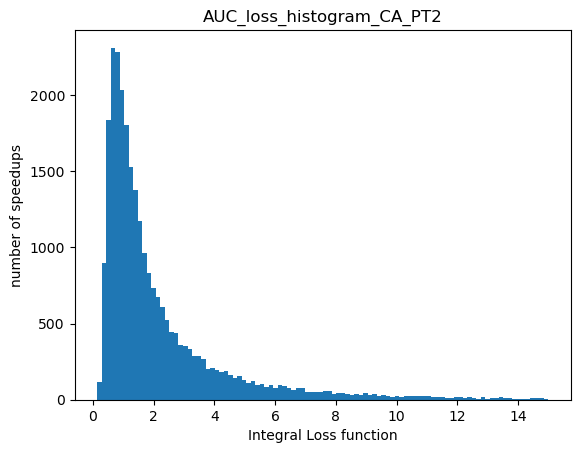

In [17]:
accuracy_summary_df = ca_pt2_parameters_df.loc[ca_pt2_parameters_df.auc_loss.values < 15]
plt.hist(accuracy_summary_df["auc_loss"].values, bins=100)
plt.title("AUC_loss_histogram_CA_PT2")
plt.xlabel("Integral Loss function")
plt.ylabel("number of speedups")
plt.savefig(save_path+"AUC_loss_histogram_CA_PT2.png")
plt.show()

## PT2 properties (Peak Time, Overshoot, Settling Time)

### Methods

* calculate_properties(y, ca_pt2_parameters_df)
    * action
    * Inputs: 
        * y (numpy array) -- array of shape (n,3) that includes all of the estimated PT2 parameters
        * ca_pt2_parameters_df (pandas dataframe) -- DataFrame with the parameters mapped to the trip_name and speedup_index created during "get_ca_pt2_parameters"
    * Outputs:
        * parameters_df (pandas DataFrame) -- DataFrame with the parameters mapped to the trip_name and speedup_index created during "get_ca_pt2_parameters" and added to that the corresponding PT2 properties Peak Time (Tp), Overshoot (OS) and Settling Time (Ts)

In [18]:
def calculate_properties(ca_pt2_parameters_df):
    parameters_df = pd.DataFrame(columns=[ "trip_name", "speedup_index", "driver_id","velocity_class","highway_driving", "D", "w0","tc","alfa","t_delay","auc_loss","Tp","OS","Ts"])
    for i, (Di, w0i) in enumerate(zip(ca_pt2_parameters_df.D.values, ca_pt2_parameters_df.w0.values)):
        if Di < 1 and Di > 0.3 and w0i >= 0 and w0i <= 1:
            Tp = math.pi/(w0i*math.sqrt(1-Di**2))
            OS = 100*math.exp(-(Di*math.pi)/(math.sqrt(1-Di**2)))
            Ts = 4/(w0i*Di)
            parameters_df.loc[-1] = [ca_pt2_parameters_df.trip_name.values[i], ca_pt2_parameters_df.speedup_index.values[i], ca_pt2_parameters_df.driver_id.values[i],
                ca_pt2_parameters_df.velocity_class.values[i],ca_pt2_parameters_df.highway_driving.values[i],
                Di, w0i, ca_pt2_parameters_df.tc.values[i],ca_pt2_parameters_df.alfa.values[i],ca_pt2_parameters_df.t_delay.values[i],ca_pt2_parameters_df.auc_loss.values[i], Tp, OS, Ts]
            parameters_df.index = parameters_df.index + 1
        else:
            parameters_df.loc[-1] = [ca_pt2_parameters_df.trip_name.values[i], ca_pt2_parameters_df.speedup_index.values[i], ca_pt2_parameters_df.driver_id.values[i],
            ca_pt2_parameters_df.velocity_class.values[i], ca_pt2_parameters_df.highway_driving.values[i], 
                Di, w0i, ca_pt2_parameters_df.tc.values[i], ca_pt2_parameters_df.alfa.values[i], ca_pt2_parameters_df.t_delay.values[i], ca_pt2_parameters_df.auc_loss.values[i],np.nan, np.nan, np.nan]
            parameters_df.index = parameters_df.index + 1
    return parameters_df

### Runnables

In [19]:
ca_pt2_parameters_df = calculate_properties(ca_pt2_parameters_df)

# Filtering

| parameter | minimum threshold  | maximum threshod | reason   |
|-----------|--------------------|------------------|----------|
| D:        |0.25                | 2.0              | outlier  |
| w0:       | 0.0                | 1.0              | outlier  |
| tc:       | -2.5               | 10.0             | outlier  |
| alfa:     | 0.0                | 0.4              | outlier  |
| auc_loss: | 0.0                | 4.0              | accuracy |
| Tp:       | 0.0                | 15.0             | outlier  |
| OS:       | 0.0                | 12.0             | outlier  |
| Ts:       | 0.0                | 15.9             | outlier  |

In [20]:
# Define filter thresholds
D_LOWER_THRESHOLD = 0.0
D_HIGHER_THRESHOLD = 1.5
W0_LOWER_THRESHOLD = 0.0
W0_HIGHER_THRESHOLD = 3.0
TC_LOWER_THRESHOLD = -2.5
TC_HIGHER_THRESHOLD = 10.0
ALFA_LOWER_THRESHOLD = 0.0
ALFA_HIGHER_THRESHOLD = 0.6

AUC_LOSS_LOWER_THRESHOLD = 0.0
AUC_LOSS_HIGHER_THRESHOLD = 4.0

TP_LOWER_THRESHOLD = -1000.0
TP_HIGHER_THRESHOLD = 500.0
OS_LOWER_THRESHOLD = 0.0
OS_HIGHER_THRESHOLD = 120.0
TS_LOWER_THRESHOLD = 0.0
TS_HIGHER_THRESHOLD = 80.9

In [21]:
filtered_parameters_df = ca_pt2_parameters_df.copy()
previous_length = filtered_parameters_df.shape[0]
# accuracy filter
filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.auc_loss.values > AUC_LOSS_LOWER_THRESHOLD) & (filtered_parameters_df.auc_loss.values < AUC_LOSS_HIGHER_THRESHOLD)]
print("filtered out {n} parameters because the integral loss is too large".format(n = previous_length-filtered_parameters_df.shape[0]))
previous_length = filtered_parameters_df.shape[0]
# basic parameter filters
filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.D.values > D_LOWER_THRESHOLD) & (filtered_parameters_df.D.values < D_HIGHER_THRESHOLD)]
print("filtered out {n} parameters because D falls out of the outlier bounds".format(n = previous_length-filtered_parameters_df.shape[0]))
previous_length = filtered_parameters_df.shape[0]
filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.w0.values > W0_LOWER_THRESHOLD) & (filtered_parameters_df.w0.values < W0_HIGHER_THRESHOLD)]
print("filtered out {n} parameters because w0 falls out of the outlier bounds".format(n = previous_length-filtered_parameters_df.shape[0]))
previous_length = filtered_parameters_df.shape[0]
filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.tc.values > TC_LOWER_THRESHOLD) & (filtered_parameters_df.tc.values < TC_HIGHER_THRESHOLD)]
print("filtered out {n} parameters because tc falls out of the outlier bounds".format(n = previous_length-filtered_parameters_df.shape[0]))
previous_length = filtered_parameters_df.shape[0]
filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.alfa.values > ALFA_LOWER_THRESHOLD) & (filtered_parameters_df.alfa.values < ALFA_HIGHER_THRESHOLD)]
print("filtered out {n} parameters because alfa falls out of the outlier bounds".format(n = previous_length-filtered_parameters_df.shape[0]))
previous_length = filtered_parameters_df.shape[0]
# properties filters
# filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.Tp.values > TP_LOWER_THRESHOLD) & (filtered_parameters_df.Tp.values < TP_HIGHER_THRESHOLD)]
# print("filtered out {n} parameters because Tp falls out of the outlier bounds".format(n = previous_length-filtered_parameters_df.shape[0]))
# previous_length = filtered_parameters_df.shape[0]
# filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.OS.values > OS_LOWER_THRESHOLD) & (filtered_parameters_df.OS.values < OS_HIGHER_THRESHOLD)]
# print("filtered out {n} parameters because OS falls out of the outlier bounds".format(n = previous_length-filtered_parameters_df.shape[0]))
# previous_length = filtered_parameters_df.shape[0]
# filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.Ts.values > TS_LOWER_THRESHOLD) & (filtered_parameters_df.Ts.values < TS_HIGHER_THRESHOLD)]
# print("filtered out {n} parameters because Ts falls out of the outlier bounds".format(n = previous_length-filtered_parameters_df.shape[0]))
filtered_length = filtered_parameters_df.shape[0]
print("Out of {n1} speedups {n2} are not filtered out. This means {p}% remains.".format(n1 = ca_pt2_parameters_df.shape[0], n2 = filtered_length, p = 100*filtered_length/ca_pt2_parameters_df.shape[0]))

filtered out 4082 parameters because the integral loss is too large
filtered out 905 parameters because D falls out of the outlier bounds
filtered out 611 parameters because w0 falls out of the outlier bounds
filtered out 893 parameters because tc falls out of the outlier bounds
filtered out 806 parameters because alfa falls out of the outlier bounds
Out of 26939 speedups 19642 are not filtered out. This means 72.9128772411745% remains.


# Overview

### Methods

* get_raw_signals(data_path, trip_name, speedup_index)
    * action
    * Inputs: 
        * data_path (string) -- path to the folder that includes the per trip folders that include the speedup window data as csv
        * trip_name (string) -- name of the trip that is analyzed e.g. "14_20210719_1626665410733632_CT6_AVT_V3_export" 
        * speedup_index (int) -- index of the speedup in the trip (trip has multiple speedups, this tells us which one it is)
    * Outputs:
        * t  (numpy array) -- time signal of the speedup
        * v  (numpy array) -- longitudinal velocity signal of the speedup
        * a  (numpy array) -- longitudinal acceleration signal of the speedup
        * j  (numpy array) -- longitudinal jerk signal of the speedup
* get_inertial_max_values(driver_df)
    * action
    * Inputs: 
        * driver_df 1 (pandas DataFrame) -- DataFrame with the same structure as the ca_pt2_parameters_df generated in "get_ca_pt2_parameters" method
    * Outputs:
        * max_accelerations (numpy array) -- includes all of the maximum accelerations of the speedups in the driver_df
        * max_jerks (numpy array) -- includes all of the maximum jerks of the speedups in the driver_df

In [24]:
def get_raw_signals(data_path, trip_name, speedup_index, signal_profile):
    data_df = pd.read_csv(os.path.join(data_path, trip_name, "speed_up{index}.csv".format(index = speedup_index)))
    v = data_df[signal_profile["Longitudinal_Velocity"]].values
    a = data_df[signal_profile["Longitudinal_Acceleration"]].values
    j = np.gradient(a)
    t = data_df[signal_profile["Time"]].values-data_df[signal_profile["Time"]].values[0]
    return t, v, a, j

In [25]:
def get_inertial_max_values(driver_df, signal_profile):
    max_accelerations = []
    max_jerks = []
    for i in range(driver_df.shape[0]):
        trip_name = driver_df.trip_name.values[i]
        speedup_index = driver_df.speedup_index.values[i]
        #max acceleration and max jerk
        t, v, a, j = get_raw_signals(data_path, trip_name, speedup_index, signal_profile)
        max_accelerations.append(max(a))
        max_jerks.append(max(j))
    return max_accelerations, max_jerks

### Runnables

In [26]:
velocity_classes = ["zero_to_low_speed_up", "zero_to_mid_speed_up", "zero_to_high_speed_up",
                "low_to_low_speed_up", "low_to_mid_speed_up", "low_to_high_speed_up",
                "mid_to_mid_speed_up", "mid_to_high_speed_up", "high_to_high_speed_up",
                ]
unique_drivers = list(set(list(ca_pt2_parameters_df["driver_id"])))

In [27]:
# based on the most filtered down dataframe
per_driver_per_velocity_class_overview_df = pd.DataFrame(columns=["driver_id","velocity_class","avg_D","std_D","avg_w0","std_w0","avg_tc","std_tc","avg_alfa","std_alfa",
    "avg_t_delay","std_t_delay","avg_max_acceleration", "std_max_acceleration", "avg_max_jerk", "std_max_jerk", "avg_area_under_the_curve_integral_loss", "std_area_under_the_curve_integral_loss",
    "avg_Tp", "std_Tp", "avg_OS", "std_OS", "avg_Ts", "std_Ts"])
for velocity_class in velocity_classes:
    for i, driver in enumerate(unique_drivers):
        driver_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == driver) & (filtered_parameters_df.velocity_class == velocity_class)]
        #max acceleration and max jerk and loss function
        max_accelerations, max_jerks = get_inertial_max_values(driver_df, signal_profile)
        #assigning values
        per_driver_per_velocity_class_overview_df.loc[-1] = [driver,velocity_class,
            np.mean(driver_df.D.values),np.std(driver_df.D.values), np.mean(driver_df.w0.values),np.std(driver_df.w0.values),
            np.mean(driver_df.tc.values),np.std(driver_df.tc.values), np.mean(driver_df.alfa.values),np.std(driver_df.alfa.values),
            np.mean(driver_df.t_delay.values),np.std(driver_df.t_delay.values),
            np.mean(max_accelerations), np.std(max_accelerations), np.mean(max_jerks), np.std(max_jerks),
            np.mean(driver_df.auc_loss.values), np.std(driver_df.auc_loss.values),
            np.mean(driver_df.Tp.values), np.std(driver_df.Tp.values), np.mean(driver_df.OS.values), np.std(driver_df.OS.values),
            np.mean(driver_df.Ts.values), np.std(driver_df.Ts.values)]
        per_driver_per_velocity_class_overview_df.index = per_driver_per_velocity_class_overview_df.index + 1
per_driver_per_velocity_class_overview_df.to_csv(source_path + "per_driver_per_velocity_class_overview.csv")

c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\numpy\core\_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\numpy\core\_methods.py:269: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\numpy\core\_methods.py:226: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\numpy\core\_methods.py:261: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\numpy\core\fromnumeric.py:3464: RuntimeWar

In [40]:
per_driver_per_velocity_class_overview_df

,driver_id,velocity_class,avg_D,std_D,avg_w0,std_w0,avg_tc,std_tc,avg_alfa,std_alfa,...,avg_max_jerk,std_max_jerk,avg_area_under_the_curve_integral_loss,std_area_under_the_curve_integral_loss,avg_Tp,std_Tp,avg_OS,std_OS,avg_Ts,std_Ts
287,2016k_178,zero_to_low_speed_up,0.749529,0.084852,0.593084,0.176948,1.275032,2.181108,0.166192,0.078229,...,0.616607,0.314325,1.261252,0.611974,9.035000,2.730041,3.486350,2.886873,9.894063,2.918774
286,2016k_198,zero_to_low_speed_up,0.707874,0.073886,0.724925,0.197697,1.943754,2.142542,0.186676,0.089027,...,0.531250,0.226519,0.955287,0.491002,6.907740,2.434842,4.783897,3.101600,8.638487,2.971059
285,2016k_133,zero_to_low_speed_up,0.798602,0.056170,0.564622,0.153548,3.155832,2.495498,0.138749,0.064564,...,0.546667,0.252804,1.026278,0.585241,10.195199,2.630376,1.818742,1.146198,9.501562,2.405263
284,2016k_101,zero_to_low_speed_up,0.744483,0.080800,0.592624,0.160249,2.937794,2.369455,0.117073,0.057990,...,0.392600,0.201366,1.388288,0.753860,8.832427,2.602299,3.587917,2.775256,9.715770,2.259258
283,2016k_156,zero_to_low_speed_up,0.748349,0.080617,0.607236,0.177314,2.884912,2.502689,0.125678,0.070975,...,0.510179,0.271492,1.205827,0.743721,8.748909,2.541160,3.466172,3.017569,9.558715,2.475355
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,2016k_161,high_to_high_speed_up,0.712545,0.043004,0.458515,0.120765,3.769991,2.017436,0.059945,0.037005,...,0.108333,0.023393,0.820462,0.519574,10.304747,1.940158,4.279547,1.542863,13.010827,2.807936
3,2016k_186,high_to_high_speed_up,0.656661,0.076598,0.616373,0.076047,4.960971,2.246756,0.107811,0.041046,...,0.093750,0.011388,1.196316,0.512431,6.966522,0.954500,7.027363,3.659871,10.186482,1.753389
2,2016k_185,high_to_high_speed_up,0.710413,0.073773,0.607685,0.182348,2.710810,2.035522,0.112437,0.057351,...,0.192812,0.065359,1.734221,0.970195,8.138453,2.166909,4.681427,2.782439,10.220569,3.111187
1,2016k_137,high_to_high_speed_up,0.762346,0.086070,0.586911,0.085579,4.206189,1.603855,0.090001,0.025982,...,0.075000,0.018371,0.644398,0.236055,9.124079,2.483557,3.108239,1.815312,9.305541,2.092584


# Representations

In [25]:
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [10, 8]
save_path = "C:/Users/scs3yh/Documents/documentation_materials/documentation_images/ACC/CA-PT2/new/"

## Overall
* The entire dataset is plotted here without splitting into subsets
* representation used here are: 
    * Histograms
    * Scatterplots

### Histograms

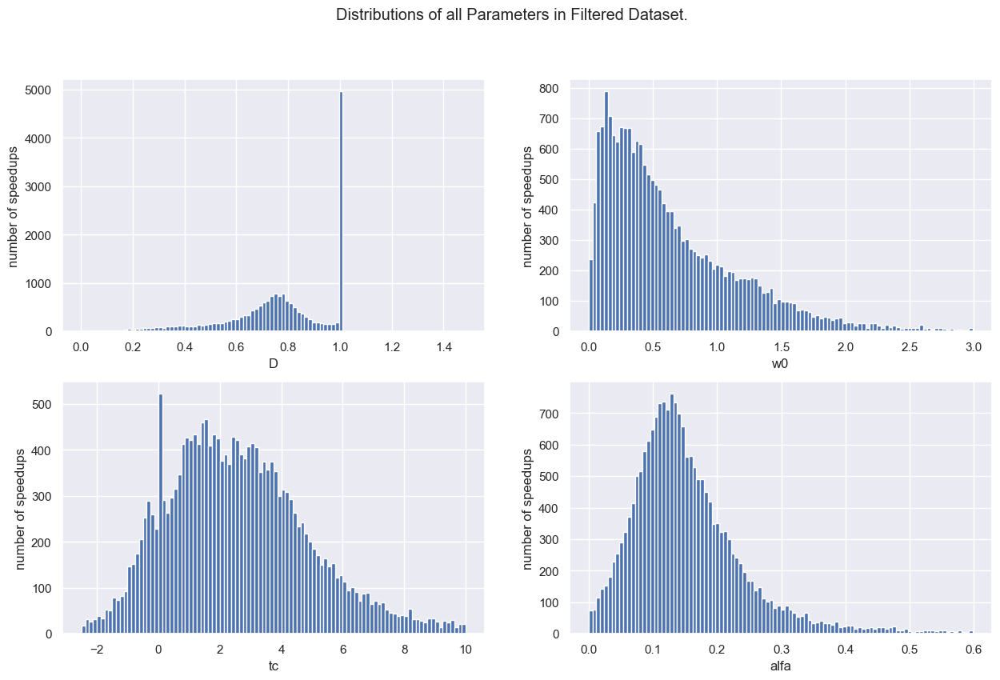

In [139]:
plt.rcParams['figure.figsize'] = [15, 9]
plt.suptitle('Distributions of all Parameters in Filtered Dataset.')
plt.subplot(2,2,1)
plt.hist(filtered_parameters_df.D.values, bins=100)
plt.ylabel("number of speedups")
plt.xlabel("D")
plt.subplot(2,2,2)
plt.hist(filtered_parameters_df.w0.values, bins=100)
plt.ylabel("number of speedups")
plt.xlabel("w0")
plt.subplot(2,2,3)
plt.hist(filtered_parameters_df.tc.values, bins=100)
plt.ylabel("number of speedups")
plt.xlabel("tc")
plt.subplot(2,2,4)
plt.hist(filtered_parameters_df.alfa.values, bins=100)
plt.ylabel("number of speedups")
plt.xlabel("alfa")
# plt.subplot(4,2,5)
# plt.hist(filtered_parameters_df.auc_loss.values, bins=100)
# plt.ylabel("number of speedups")
# plt.xlabel("Integral Loss (Area under the Curve)")
# plt.subplot(4,2,6)
# plt.hist(filtered_parameters_df.Tp.values, bins=100)
# plt.ylabel("number of speedups")
# plt.xlabel("Tp")
# plt.subplot(4,2,7)
# plt.hist(filtered_parameters_df.OS.values, bins=100)
# plt.ylabel("number of speedups")
# plt.xlabel("OS")
# plt.subplot(4,2,8)
# plt.hist(filtered_parameters_df.Ts.values, bins=100)
# plt.ylabel("number of speedups")
# plt.xlabel("Ts")
plt.savefig(save_path + "Distributions_of_all_Parameters_in_Filtered_Dataset.png")
plt.show()

### Scatterplots

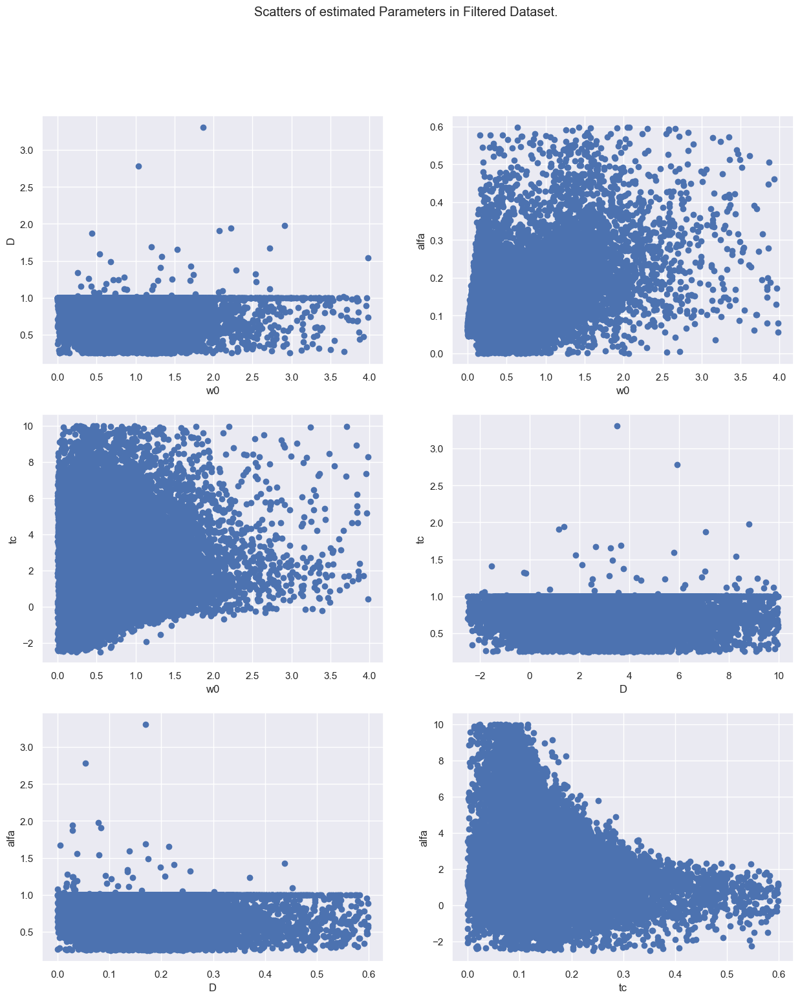

In [30]:
plt.rcParams['figure.figsize'] = [15, 17]
plt.suptitle('Scatters of estimated Parameters in Filtered Dataset.')
plt.subplot(3,2,1)
plt.scatter(filtered_parameters_df.w0.values, filtered_parameters_df.D.values)
plt.ylabel("D")
plt.xlabel("w0")
plt.subplot(3,2,2)
plt.scatter(filtered_parameters_df.w0.values, filtered_parameters_df.alfa.values)
plt.xlabel("w0")
plt.ylabel("alfa")
plt.subplot(3,2,3)
plt.scatter(filtered_parameters_df.w0.values, filtered_parameters_df.tc.values)
plt.xlabel("w0")
plt.ylabel("tc")
plt.subplot(3,2,4)
plt.scatter(filtered_parameters_df.tc.values, filtered_parameters_df.D.values)
plt.ylabel("tc")
plt.xlabel("D")
plt.subplot(3,2,5)
plt.scatter(filtered_parameters_df.alfa.values, filtered_parameters_df.D.values)
plt.ylabel("alfa")
plt.xlabel("D")
plt.subplot(3,2,6)
plt.scatter(filtered_parameters_df.alfa.values, filtered_parameters_df.tc.values)
plt.ylabel("alfa")
plt.xlabel("tc")
plt.savefig(save_path + "Scatters_of_estimated_Parameters_in_Filtered_Dataset{postfix}.png".format(postfix = output_postfix))
plt.show()

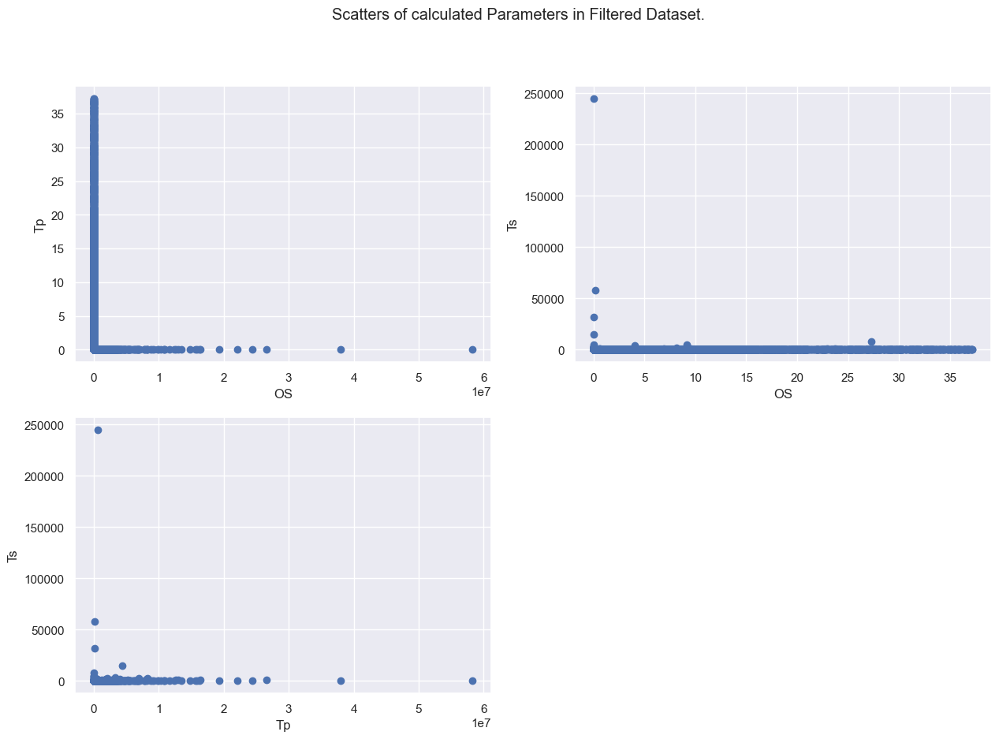

In [31]:
plt.rcParams['figure.figsize'] = [15, 10]
plt.suptitle('Scatters of calculated Parameters in Filtered Dataset.')
plt.subplot(2,2,1)
plt.scatter(filtered_parameters_df.Tp.values, filtered_parameters_df.OS.values)
plt.ylabel("Tp")
plt.xlabel("OS")
plt.subplot(2,2,2)
plt.scatter(filtered_parameters_df.OS.values, filtered_parameters_df.Ts.values)
plt.xlabel("OS")
plt.ylabel("Ts")
plt.subplot(2,2,3)
plt.scatter(filtered_parameters_df.Tp.values, filtered_parameters_df.Ts.values)
plt.xlabel("Tp")
plt.ylabel("Ts")
plt.savefig(save_path + "Scatters_of_calculated_Parameters_in_Filtered_Dataset{postfix}.png".format(postfix = output_postfix))
plt.show()

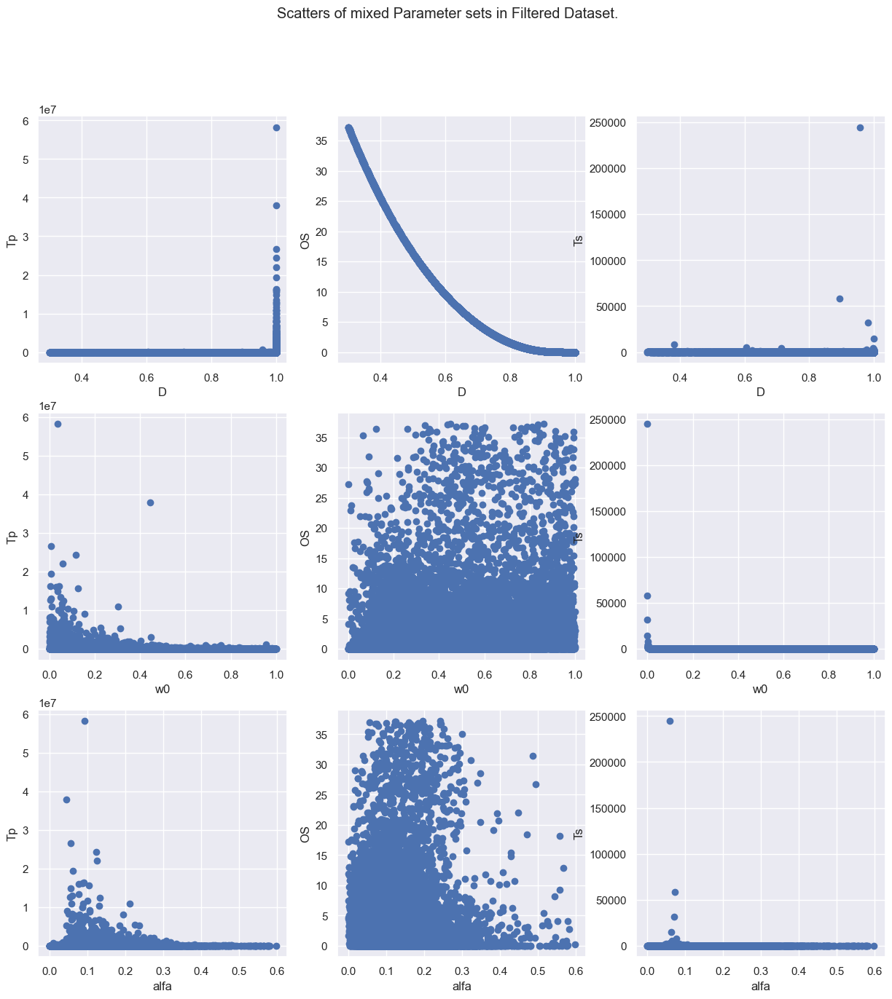

In [32]:
plt.rcParams['figure.figsize'] = [15, 15]
plt.suptitle('Scatters of mixed Parameter sets in Filtered Dataset.')
plt.subplot(3,3,1)
plt.scatter(filtered_parameters_df.D.values, filtered_parameters_df.Tp.values)
plt.ylabel("Tp")
plt.xlabel("D")
plt.subplot(3,3,2)
plt.scatter(filtered_parameters_df.D.values, filtered_parameters_df.OS.values)
plt.xlabel("D")
plt.ylabel("OS")
plt.subplot(3,3,3)
plt.scatter(filtered_parameters_df.D.values, filtered_parameters_df.Ts.values)
plt.xlabel("D")
plt.ylabel("Ts")
plt.subplot(3,3,4)
plt.scatter(filtered_parameters_df.w0.values, filtered_parameters_df.Tp.values)
plt.ylabel("Tp")
plt.xlabel("w0")
plt.subplot(3,3,5)
plt.scatter(filtered_parameters_df.w0.values, filtered_parameters_df.OS.values)
plt.xlabel("w0")
plt.ylabel("OS")
plt.subplot(3,3,6)
plt.scatter(filtered_parameters_df.w0.values, filtered_parameters_df.Ts.values)
plt.xlabel("w0")
plt.ylabel("Ts")
plt.subplot(3,3,7)
plt.scatter(filtered_parameters_df.alfa.values, filtered_parameters_df.Tp.values)
plt.ylabel("Tp")
plt.xlabel("alfa")
plt.subplot(3,3,8)
plt.scatter(filtered_parameters_df.alfa.values, filtered_parameters_df.OS.values)
plt.xlabel("alfa")
plt.ylabel("OS")
plt.subplot(3,3,9)
plt.scatter(filtered_parameters_df.alfa.values, filtered_parameters_df.Ts.values)
plt.xlabel("alfa")
plt.ylabel("Ts")
plt.savefig(save_path + "Scatters_of_mixed_Parameter_sets_in_Filtered_Dataset{postfix}.png".format(postfix = output_postfix))
plt.show()

Text(0, 0.5, 'Tp')

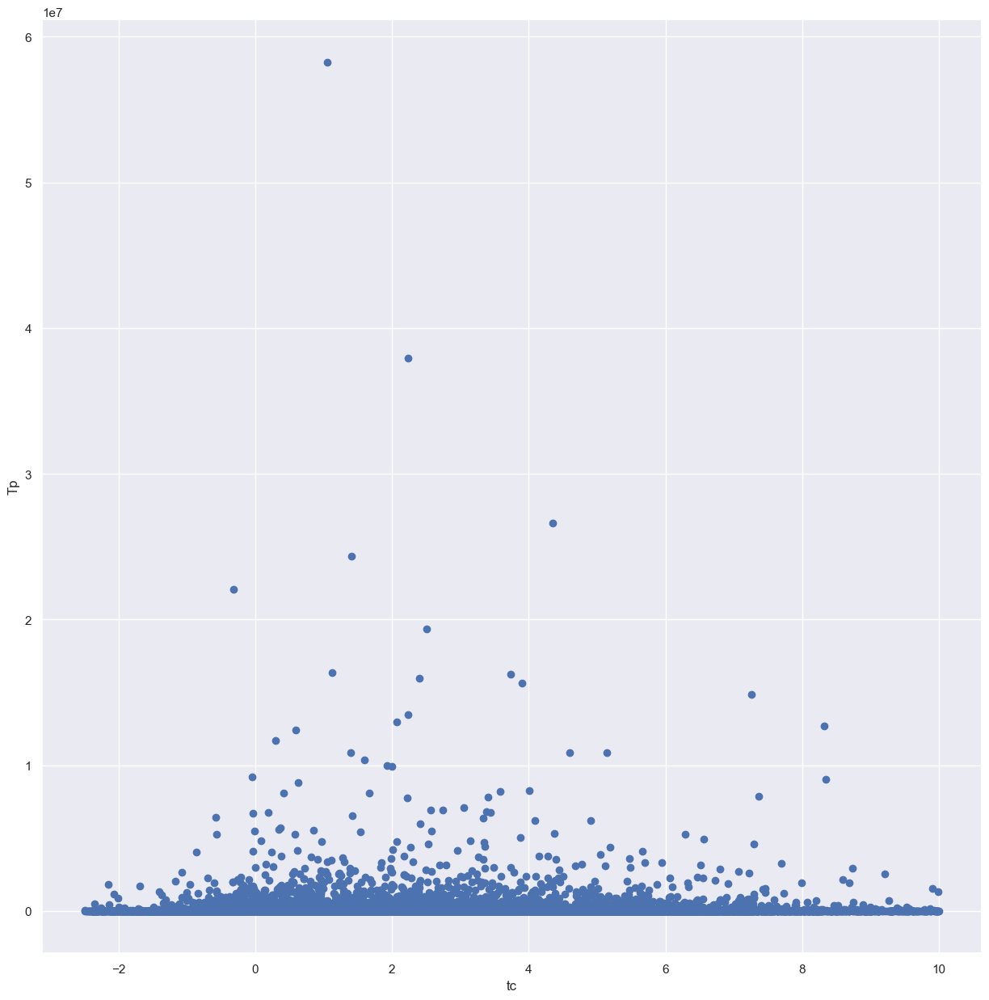

In [33]:
plt.scatter(filtered_parameters_df.tc.values, filtered_parameters_df.Tp.values)
plt.xlabel("tc")
plt.ylabel("Tp")

## Per Driver

In [34]:
unique_drivers = list(set(list(ca_pt2_parameters_df["driver_id"])))

### Boxplots

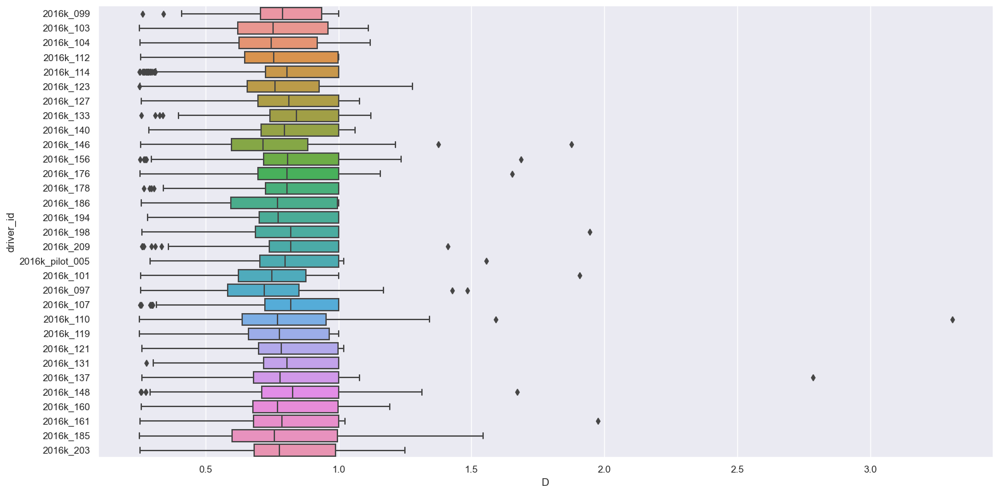

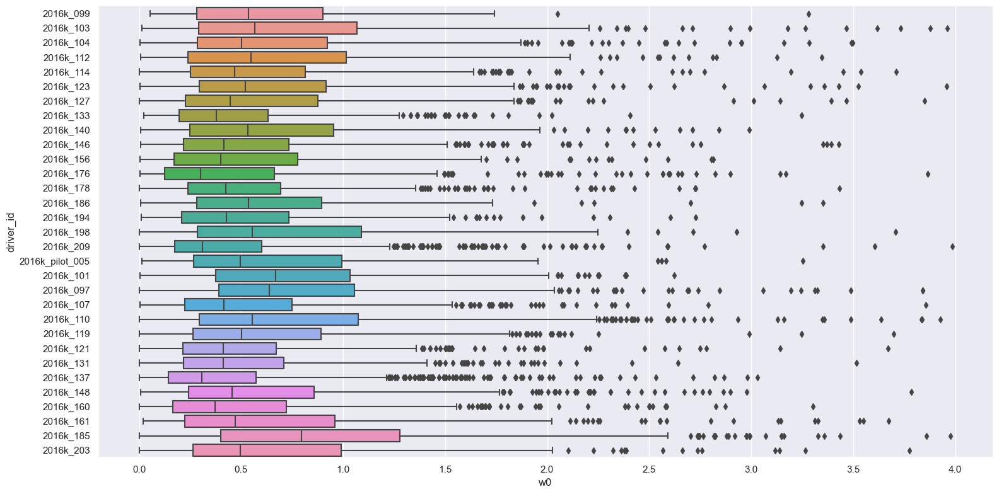

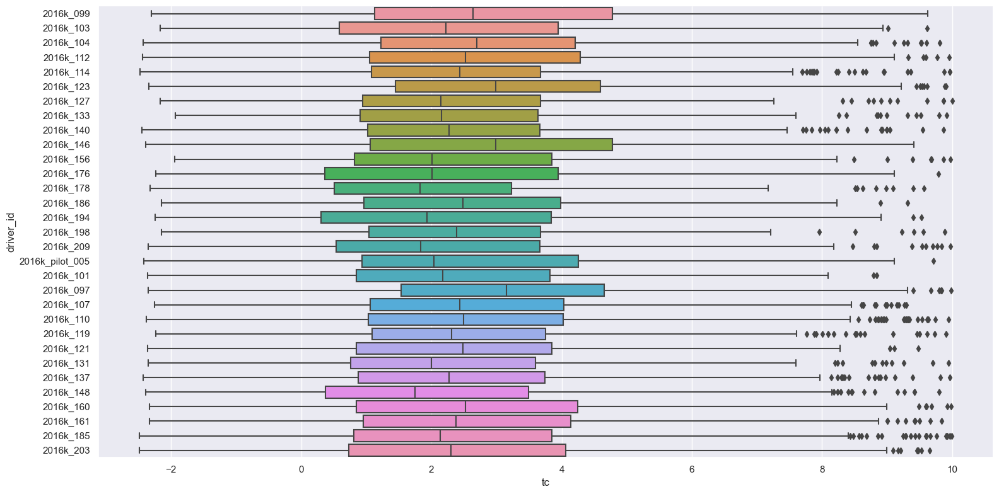

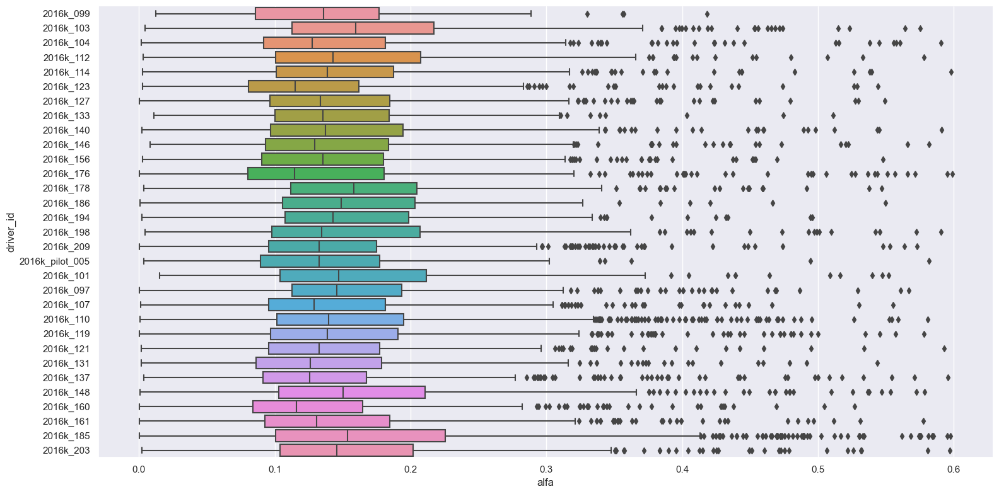

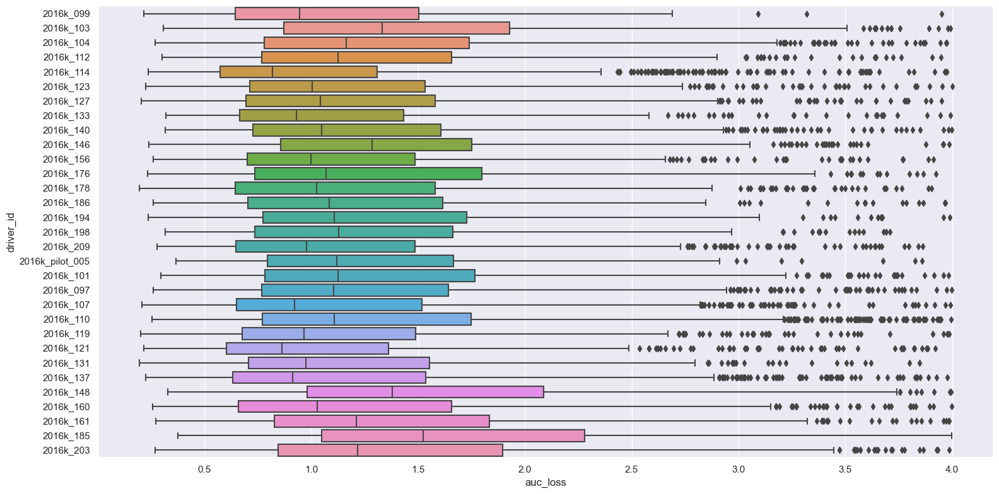

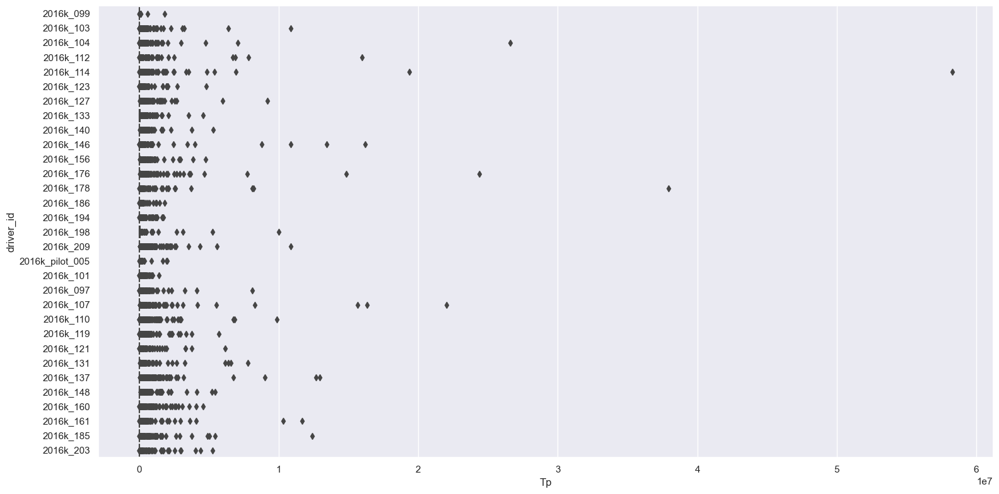

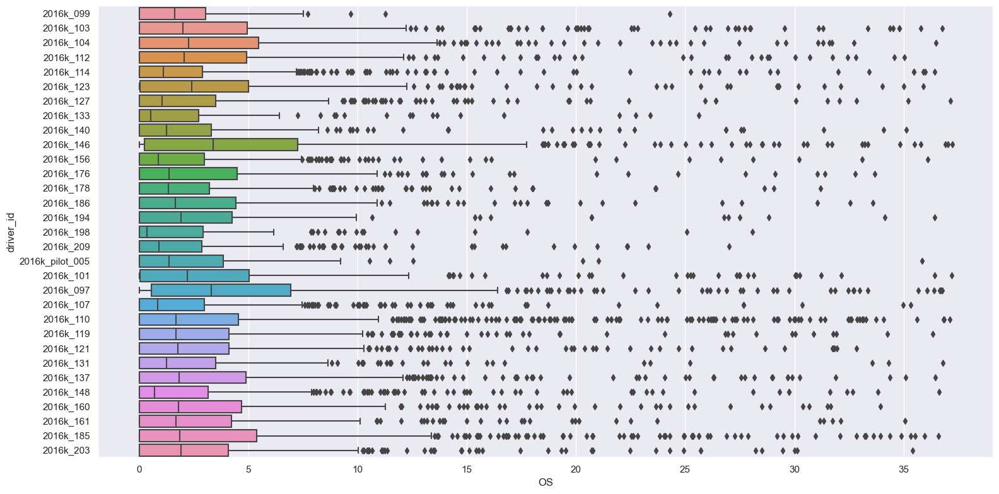

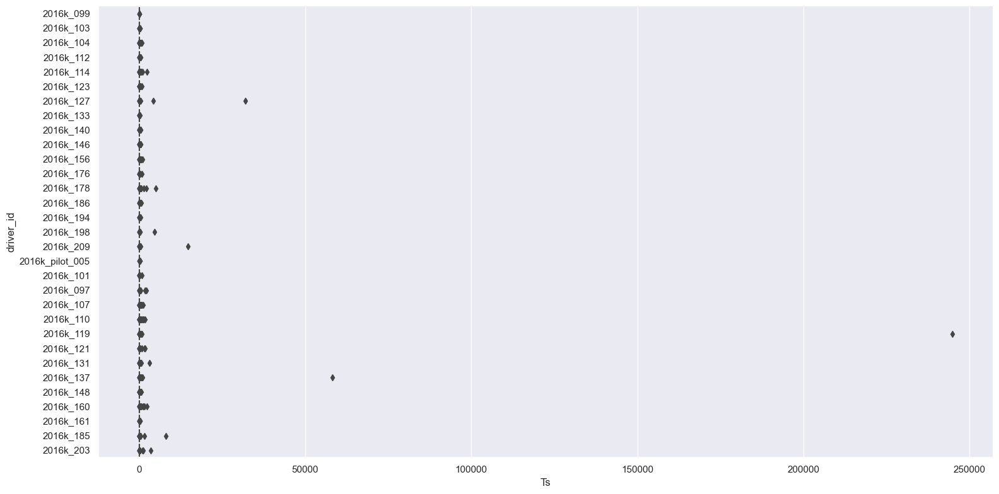

In [163]:
sns.catplot(data=filtered_parameters_df, y="driver_id", x="D", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_D{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="driver_id", x="w0", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_w0{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="driver_id", x="tc", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_tc{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="driver_id", x="alfa", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_alfa{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="driver_id", x="auc_loss", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_auc_loss{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="driver_id", x="Tp", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_drivers_f0r_Tp{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="driver_id", x="OS", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_OS{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="driver_id", x="Ts", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_Ts{postfix}.png".format(postfix = output_postfix))
plt.show()

In [62]:
filtered_parameters_df.to_csv("ca_pt2_cadillac_parameters.csv")

## Visualizing individual speedups

In [35]:
ca_pt2_parameters_df.to_csv("unfiltered_parameters.csv")

In [3]:
def resample_time_constants(data_path, trip_name, speedup_index, ca_pt2_parameters_df, signal_profile):
    t_ca_pt2, y_ca_pt2, ca_pt2_parameters = get_ca_pt2_signal(data_path, trip_name, speedup_index, ca_pt2_parameters_df, signal_profile)
    resample_factor = 100/t_ca_pt2[len(t_ca_pt2)-1]
    selected_speedup = ca_pt2_parameters_df.loc[(ca_pt2_parameters_df.trip_name.values == trip_name) & (ca_pt2_parameters_df.speedup_index.values == speedup_index)]
    t_switch_resampled = resample_factor*(selected_speedup.tc.values+selected_speedup.t_delay.values)
    t_delay_resampled = resample_factor*selected_speedup.t_delay.values
    return t_switch_resampled, t_delay_resampled

In [2]:
def round_sig(x, sig=2):
    return round(x, sig-int(math.floor(math.log10(abs(x))))-1)
def plot_example(index, df):
    
    t_display, y_real, y_ca_pt2, trapz_auc, ca_pt2_parameters = accuracy_difference(data_path, df.trip_name.values[index],
        df.speedup_index.values[index],df, signal_profile)
    t_switch_resampled, t_delay_resampled = resample_time_constants(data_path, df.trip_name.values[index],
        df.speedup_index.values[index],df, signal_profile)
    difference_plot = abs(y_ca_pt2-y_real)
    plt.plot(t_display, y_real, color='green', label="measured velocity signal")
    plt.plot(t_display, y_ca_pt2, color='blue', label="CA_PT2 estimated velocity")
    plt.plot(t_display, difference_plot, color='lightblue', label="difference between signals")
    plt.axvline(x=t_delay_resampled, color='magenta', label='t_delay')
    plt.axvline(x=t_switch_resampled, color='red', label='tc+t_delay')
    plt.legend()
    plt.ylabel("normalized velocity")
    plt.xlabel("normalized time")
    plt.title("speedup {s} from {t}".format(t = df.trip_name.values[index], s=df.speedup_index.values[index]))
    plt.text(s="   D   = "+str(round_sig(df.D.values[index], 3)), y=0.15, x=70.8)
    plt.text(s="  w0   = "+str(round_sig(df.w0.values[index], 3)), y=0.2, x=70.8)
    plt.text(s=" alfa  = "+str(round_sig(df.alfa.values[index], 3)), y=0.15, x=70.8)
    plt.text(s="  tc   = "+str(round_sig(df.tc.values[index], 3)), y=0.2, x=70.8)
    plt.text(s="tdelay = "+str(round_sig(df.t_delay.values[index], 3)), y=0.25, x=70.8)
    
    plt.text(s="tdelay+tc = "+str(round_sig(df.t_delay.values[index]+df.tc.values[index], 3)), y=0.30, x=70.8)

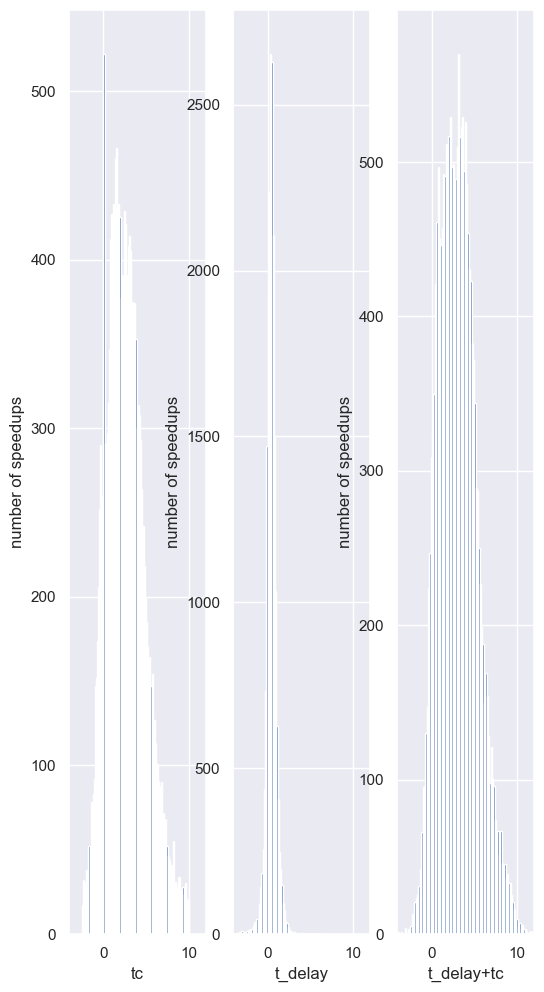

In [34]:
plt.rcParams['figure.figsize'] = [6, 12]
plt.subplot(1,3,1)
plt.hist(filtered_parameters_df.tc.values, bins=100)
plt.ylabel("number of speedups")
plt.xlabel("tc")
plt.xlim(-4,12)
plt.subplot(1,3,2)
plt.hist(filtered_parameters_df.t_delay.values, bins=100)
plt.ylabel("number of speedups")
plt.xlabel("t_delay")
plt.xlim(-4,12)
plt.subplot(1,3,3)
plt.hist(filtered_parameters_df.t_delay.values+filtered_parameters_df.tc.values, bins=100)
plt.ylabel("number of speedups")
plt.xlabel("t_delay+tc")
plt.xlim(-4,12)
plt.show()

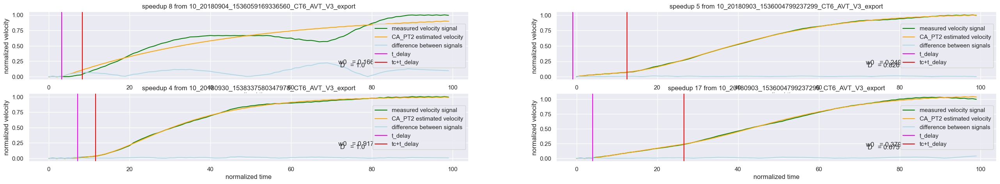

In [35]:
plt.rcParams['figure.figsize'] = [32, 5]
plt.subplot(2,2,1)
plot_example(45, ca_pt2_parameters_df)
plt.subplot(2,2,2)
plot_example(17, filtered_parameters_df)
plt.subplot(2,2,3)
plot_example(363, ca_pt2_parameters_df)
plt.subplot(2,2,4)
plot_example(26, filtered_parameters_df)
plt.show()

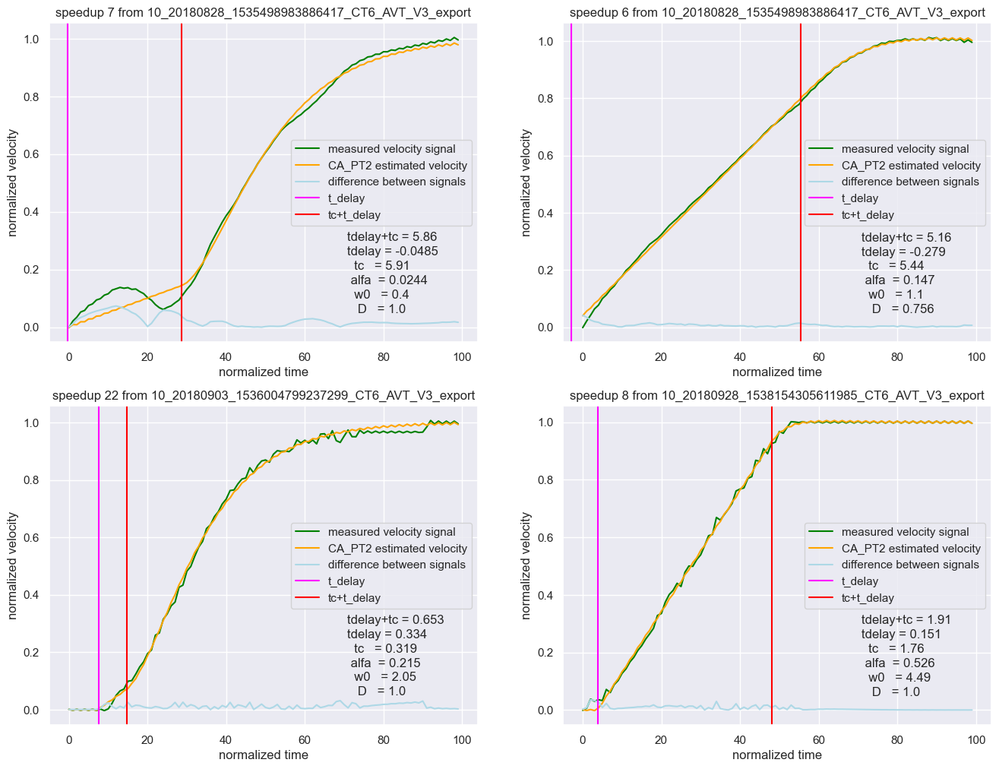

In [133]:
plt.rcParams['figure.figsize'] = [16, 12]
plt.subplot(2,2,1)
plot_example(6, ca_pt2_parameters_df)
plt.subplot(2,2,2)
plot_example(5, ca_pt2_parameters_df)
plt.subplot(2,2,3)
plot_example(37, ca_pt2_parameters_df)
plt.subplot(2,2,4)
plot_example(274, ca_pt2_parameters_df)#0, 240
plt.show()

In [ ]:
plt.rcParams['figure.figsize'] = [8, 12]
plt.subplot(2,1,1)
plot_example(10, filtered_parameters_df)
plt.subplot(2,1,2)
plot_example(11, filtered_parameters_df)

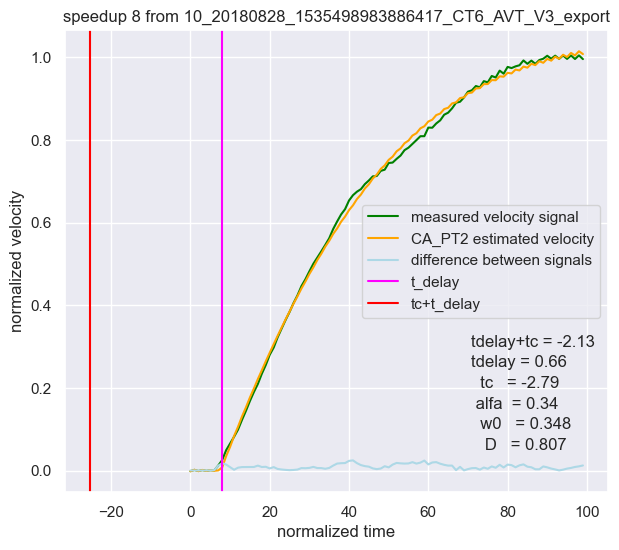

In [119]:
plt.rcParams['figure.figsize'] = [7, 6]
plot_example(7, ca_pt2_parameters_df)
plt.show()

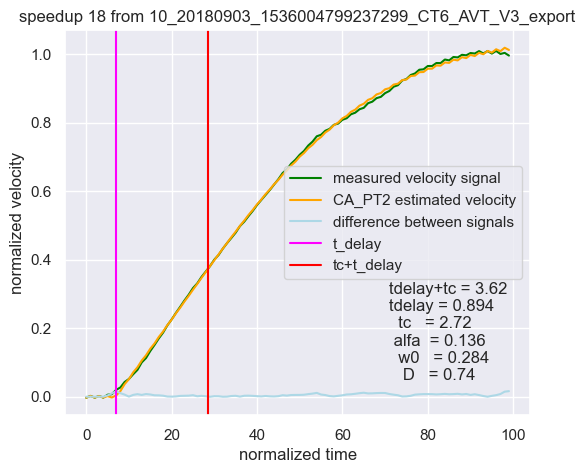

In [120]:
plt.rcParams['figure.figsize'] = [6, 5]
plot_example(33, ca_pt2_parameters_df)
plt.savefig(save_path+"time_case_1.png")
plt.show()

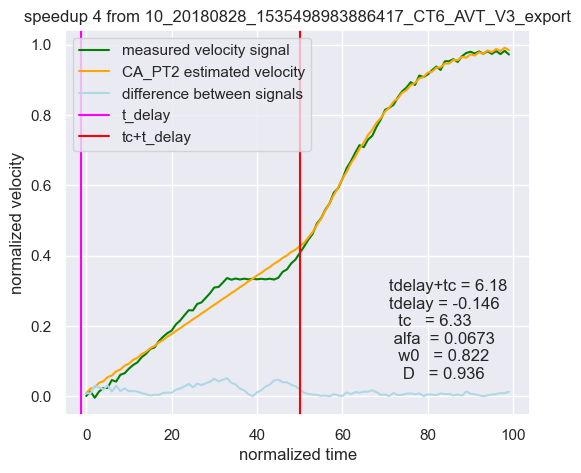

In [123]:
plt.rcParams['figure.figsize'] = [6, 5]
plot_example(3, ca_pt2_parameters_df)
plt.savefig(save_path+"time_case_3.png")
plt.show()

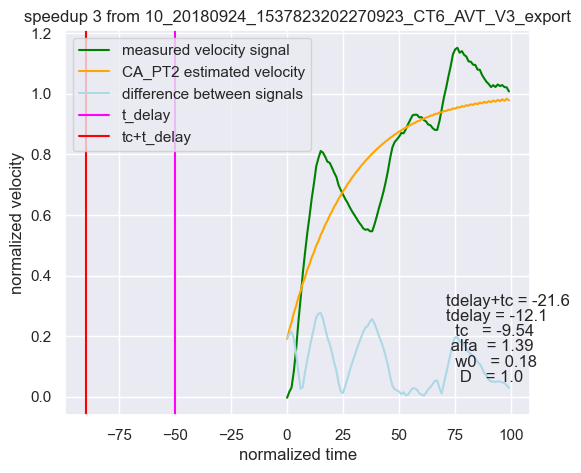

In [125]:
plt.rcParams['figure.figsize'] = [6, 5]
plot_example(112, ca_pt2_parameters_df)
plt.savefig(save_path+"time_case_8.png")
plt.show()

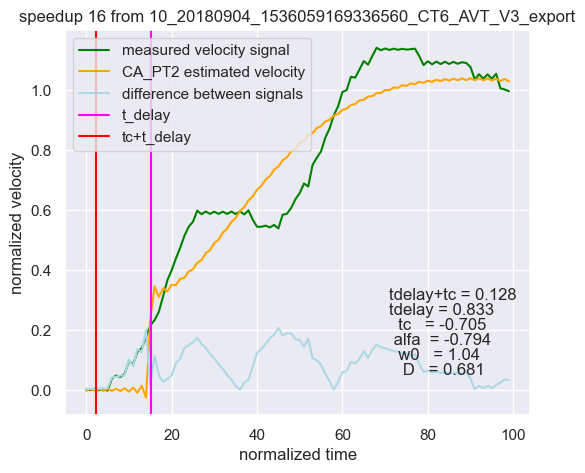

In [126]:
plt.rcParams['figure.figsize'] = [6, 5]
plot_example(53, ca_pt2_parameters_df)
#plt.savefig(save_path+"time_case_3.png")
plt.show()

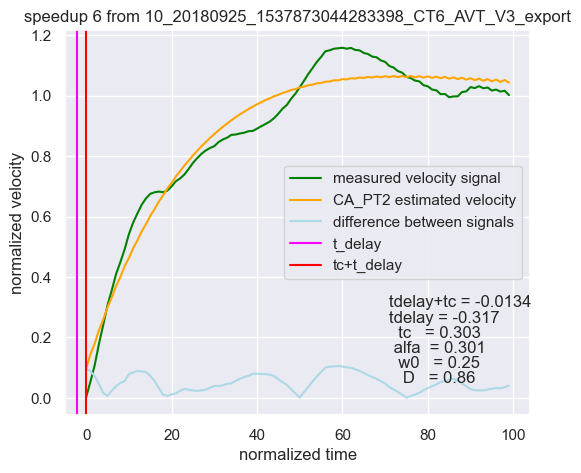

In [128]:
plt.rcParams['figure.figsize'] = [6, 5]
plot_example(149, ca_pt2_parameters_df)
plt.savefig(save_path+"time_case_4.png")
plt.show()

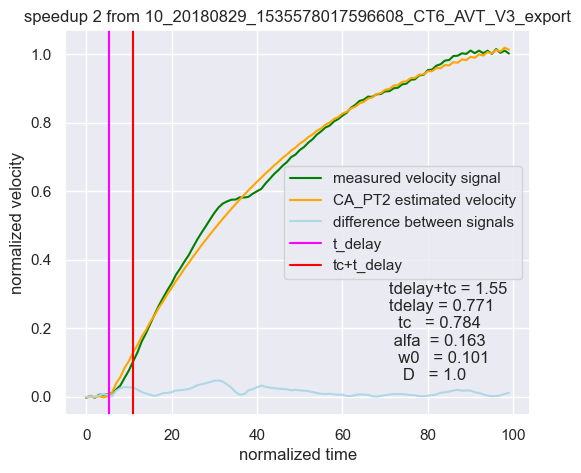

In [131]:
plt.rcParams['figure.figsize'] = [6, 5]
plot_example(11, ca_pt2_parameters_df)
plt.savefig(save_path+"time_case_5.png")
plt.show()

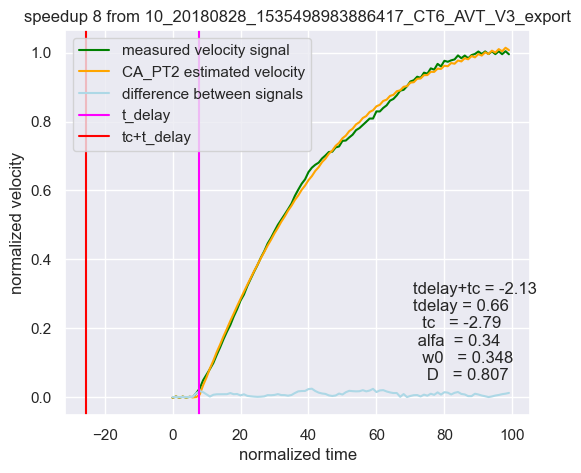

In [130]:
plt.rcParams['figure.figsize'] = [6, 5]
plot_example(7, ca_pt2_parameters_df)
plt.savefig(save_path+"time_case_6.png")
plt.show()

In [179]:
case1 = ca_pt2_parameters_df.loc[(ca_pt2_parameters_df.tc.values > 0.0) & (ca_pt2_parameters_df.t_delay.values > 0.0) & (ca_pt2_parameters_df.t_delay.values+ca_pt2_parameters_df.tc.values > 0)]
print("case1 percentage:", str(100*case1.shape[0]/ca_pt2_parameters_df.shape[0]))
case2 = ca_pt2_parameters_df.loc[(ca_pt2_parameters_df.tc.values > 0.0) & (ca_pt2_parameters_df.t_delay.values > 0.0) & (ca_pt2_parameters_df.t_delay.values+ca_pt2_parameters_df.tc.values < 0)]
print("case2 percentage:", str(100*case2.shape[0]/ca_pt2_parameters_df.shape[0]))
case3 = ca_pt2_parameters_df.loc[(ca_pt2_parameters_df.tc.values > 0.0) & (ca_pt2_parameters_df.t_delay.values < 0.0) & (ca_pt2_parameters_df.t_delay.values+ca_pt2_parameters_df.tc.values > 0)]
print("case3 percentage:", str(100*case3.shape[0]/ca_pt2_parameters_df.shape[0]))
case4 = ca_pt2_parameters_df.loc[(ca_pt2_parameters_df.tc.values > 0.0) & (ca_pt2_parameters_df.t_delay.values < 0.0) & (ca_pt2_parameters_df.t_delay.values+ca_pt2_parameters_df.tc.values < 0)]
print("case4 percentage:", str(100*case4.shape[0]/ca_pt2_parameters_df.shape[0]))
case5 = ca_pt2_parameters_df.loc[(ca_pt2_parameters_df.tc.values < 0.0) & (ca_pt2_parameters_df.t_delay.values > 0.0) & (ca_pt2_parameters_df.t_delay.values+ca_pt2_parameters_df.tc.values > 0)]
print("case5 percentage:", str(100*case5.shape[0]/ca_pt2_parameters_df.shape[0]))
case6 = ca_pt2_parameters_df.loc[(ca_pt2_parameters_df.tc.values < 0.0) & (ca_pt2_parameters_df.t_delay.values > 0.0) & (ca_pt2_parameters_df.t_delay.values+ca_pt2_parameters_df.tc.values < 0)]
print("case6 percentage:", str(100*case6.shape[0]/ca_pt2_parameters_df.shape[0]))
case7 = ca_pt2_parameters_df.loc[(ca_pt2_parameters_df.tc.values < 0.0) & (ca_pt2_parameters_df.t_delay.values < 0.0) & (ca_pt2_parameters_df.t_delay.values+ca_pt2_parameters_df.tc.values > 0)]
print("case7 percentage:", str(100*case7.shape[0]/ca_pt2_parameters_df.shape[0]))
case8 = ca_pt2_parameters_df.loc[(ca_pt2_parameters_df.tc.values < 0.0) & (ca_pt2_parameters_df.t_delay.values < 0.0) & (ca_pt2_parameters_df.t_delay.values+ca_pt2_parameters_df.tc.values < 0)]
print("case8 percentage:", str(100*case8.shape[0]/ca_pt2_parameters_df.shape[0]))

case1 percentage: 61.09358179590927
case2 percentage: 0.0
case3 percentage: 20.980734251456994
case4 percentage: 0.6904487917146145
case5 percentage: 5.868814729574224
case6 percentage: 9.18371134785998
case7 percentage: 0.0
case8 percentage: 2.1827090834849106


In [189]:
case8

,trip_name,speedup_index,driver_id,velocity_class,highway_driving,D,w0,tc,alfa,t_delay,auc_loss,Tp,OS,Ts
26826,10_20180924_1537823202270923_CT6_AVT_V3_export,3,2016k_103,low_to_low_speed_up,False,0.999934,0.179763,-9.543775,1.387060,-12.091380,10.910597,1.520341e+03,2.064643e-117,22.253011
26809,10_20180925_1537834950316746_CT6_AVT_V3_export,1,2016k_103,zero_to_mid_speed_up,False,0.604698,0.158761,-0.685611,0.065408,-0.249510,1.494807,2.484535e+01,9.206943e+00,41.665634
26756,10_20180926_1537922005399273_CT6_AVT_V3_export,6,2016k_103,zero_to_low_speed_up,False,1.000000,0.188018,-27.448593,0.982468,-2.176899,14.457663,3.837307e+06,0.000000e+00,21.274547
26730,10_20180926_1537984001916299_CT6_AVT_V3_export,6,2016k_103,zero_to_mid_speed_up,False,0.999996,0.136915,-1.620220,0.344404,-0.228494,1.290549,8.225886e+03,0.000000e+00,29.215316
26729,10_20180926_1537990206206265_CT6_AVT_V3_export,0,2016k_103,unknown,False,-0.548715,0.009855,-7.553835,0.046521,-2.956606,3.877444,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
206,14_20210723_1627078402840186_CT6_AVT_V3_export,0,2016k_203,unknown,False,0.882680,0.121025,-36.225363,2.556283,-2.269174,3.218641,5.523310e+01,2.738456e-01,37.443876
193,14_20210723_1627078402840186_CT6_AVT_V3_export,14,2016k_203,mid_to_high_speed_up,False,-0.838698,-0.005439,-2.614672,0.081611,-0.693350,3.983518,NaN,NaN,NaN
108,14_20210724_1627159097194533_CT6_AVT_V3_export,44,2016k_203,low_to_mid_speed_up,False,0.904726,0.210378,-13.418418,1.793307,-4.602055,4.622432,3.505465e+01,1.265709e-01,21.015590
98,14_20210724_1627159097194533_CT6_AVT_V3_export,56,2016k_203,low_to_mid_speed_up,False,0.765534,0.365209,-0.156967,-0.379274,-0.057001,3.096181,1.336996e+01,2.380230e+00,14.307173


## Per Velocity Class

In [49]:
velocity_classes = ["zero_to_low_speed_up", "zero_to_mid_speed_up", "zero_to_high_speed_up",
                "low_to_low_speed_up", "low_to_mid_speed_up", "low_to_high_speed_up",
                "mid_to_mid_speed_up", "mid_to_high_speed_up", "high_to_high_speed_up",
                ]

### Boxplots

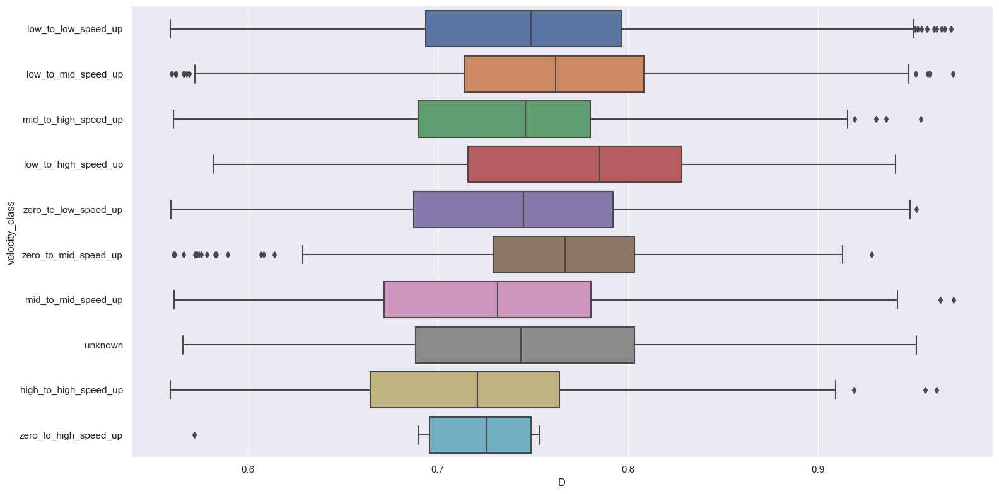

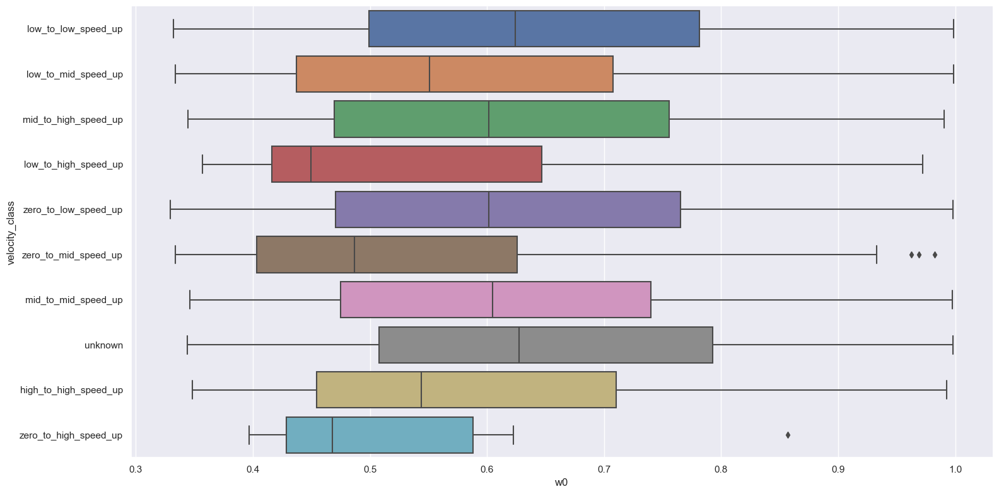

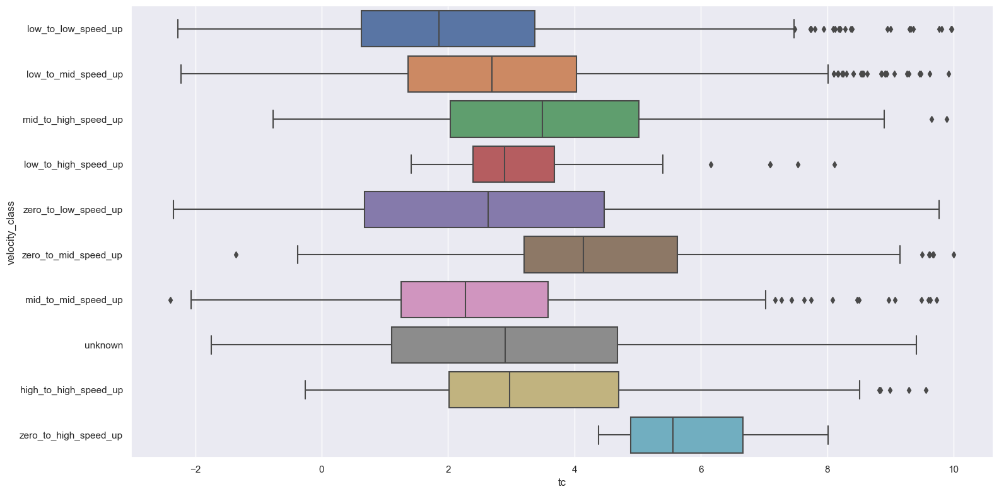

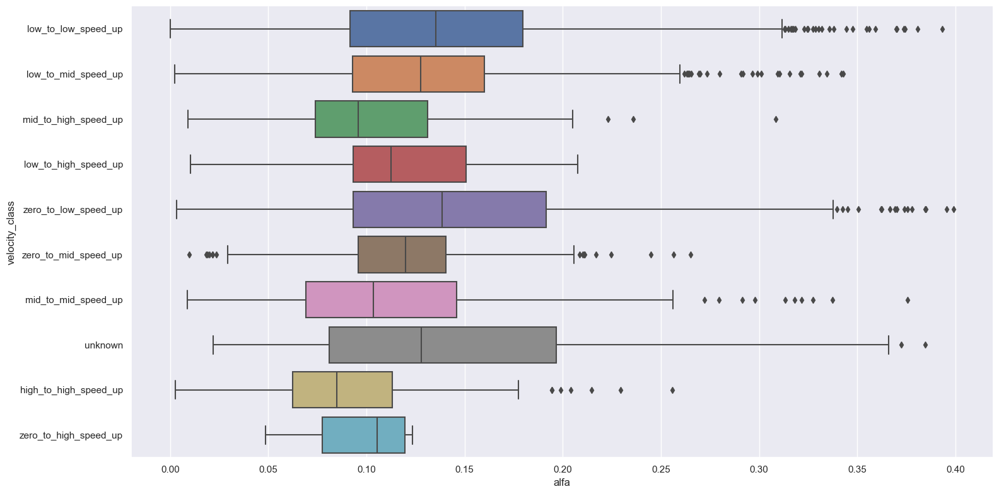

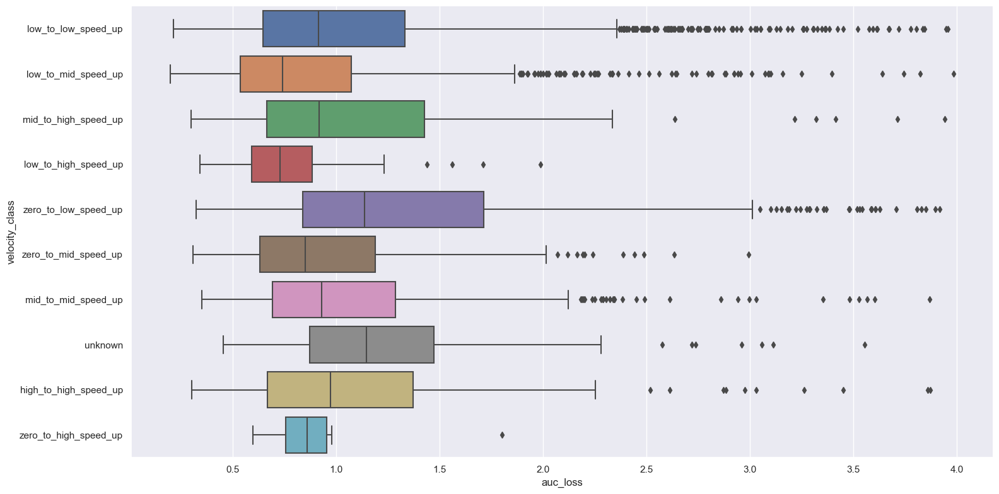

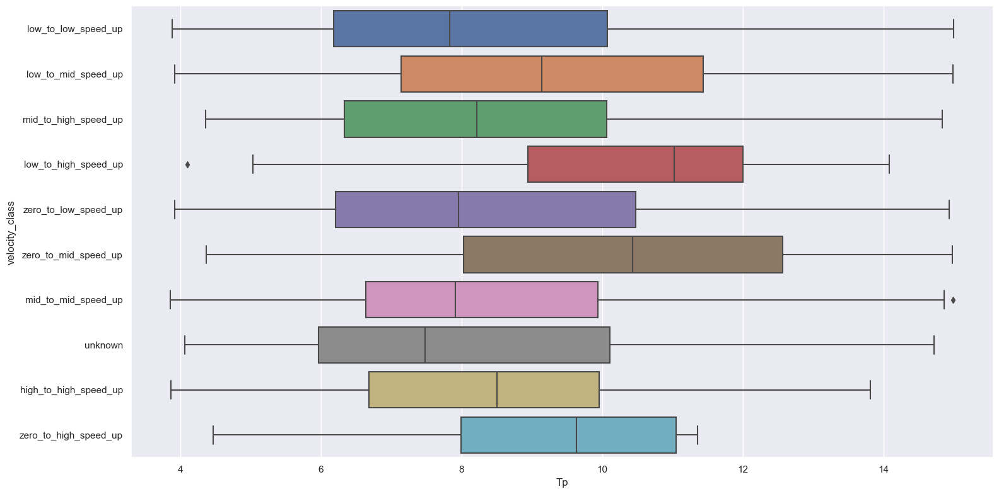

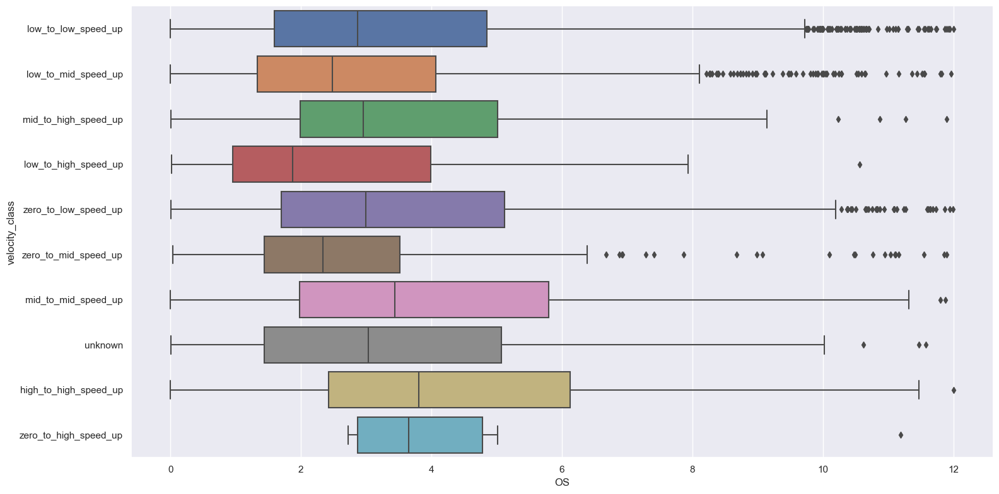

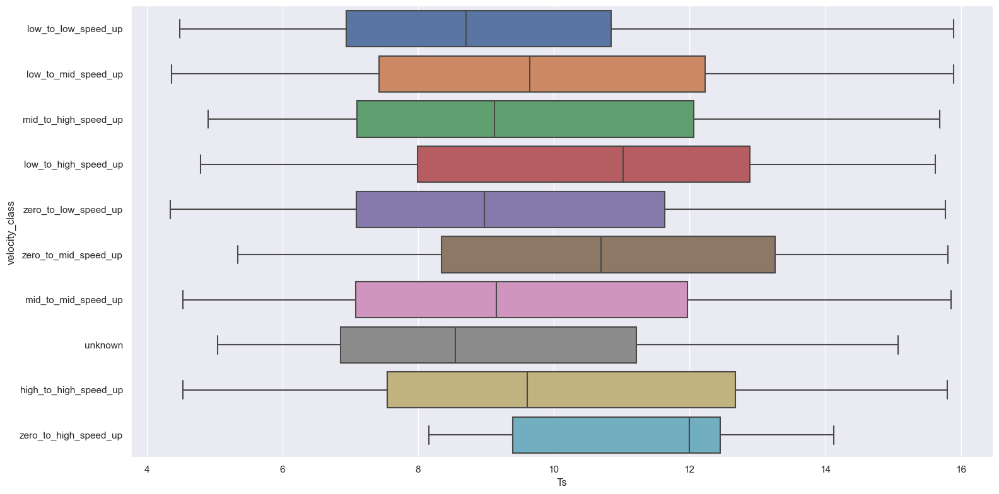

In [50]:
sns.catplot(data=filtered_parameters_df, y="velocity_class", x="D", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_velocity_classes_for_D_{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="velocity_class", x="w0", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_velocity_classes_for_w0_{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="velocity_class", x="tc", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_velocity_classes_for_tc_{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="velocity_class", x="alfa", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_velocity_classes_for_alfa_{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="velocity_class", x="auc_loss", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_velocity_classes_for_auc_loss_{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="velocity_class", x="Tp", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_velocity_classes_for_Tp_{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="velocity_class", x="OS", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_velocity_classes_for_OS_{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=filtered_parameters_df, y="velocity_class", x="Ts", kind="box", height=8, aspect=2)
plt.savefig(save_path + "boxplot_comparing_all_velocity_classes_for_Ts_{postfix}.png".format(postfix = output_postfix))
plt.show()

### low to low box plots

In [37]:
low_to_low_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == "low_to_low_speed_up"]

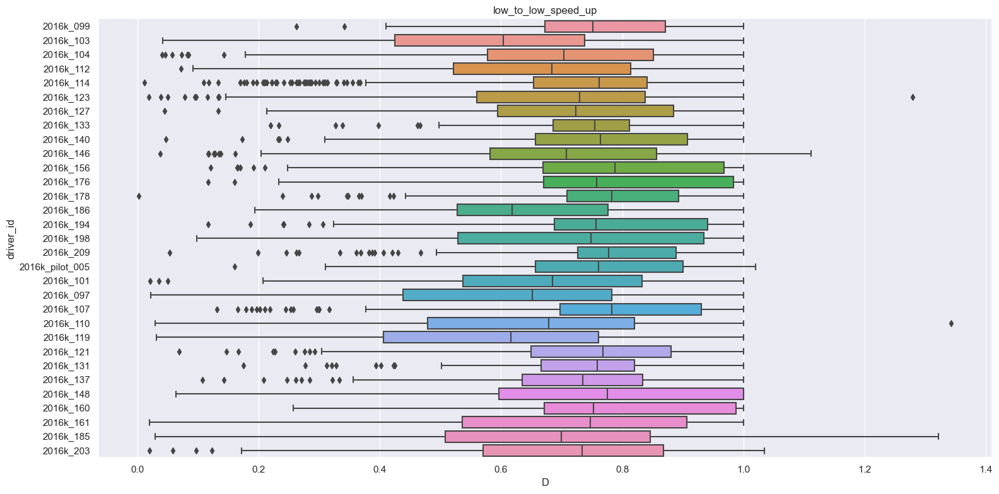

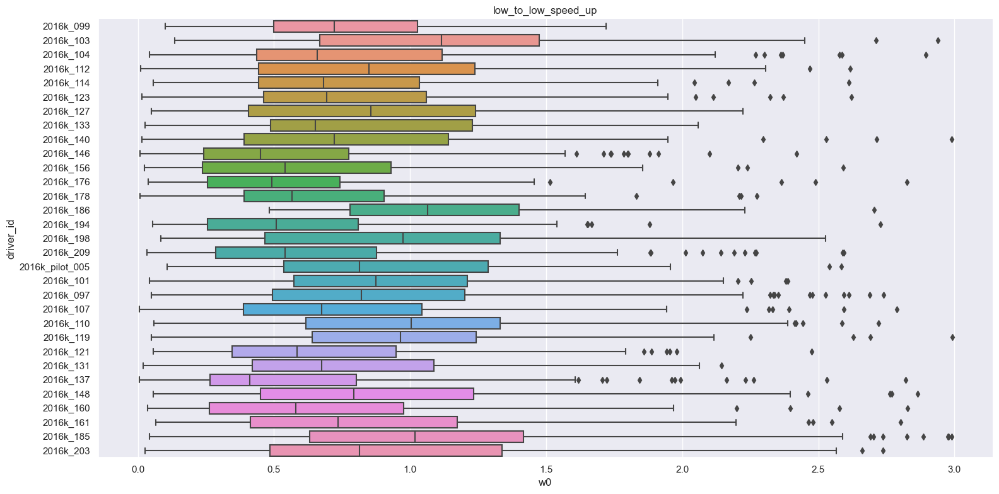

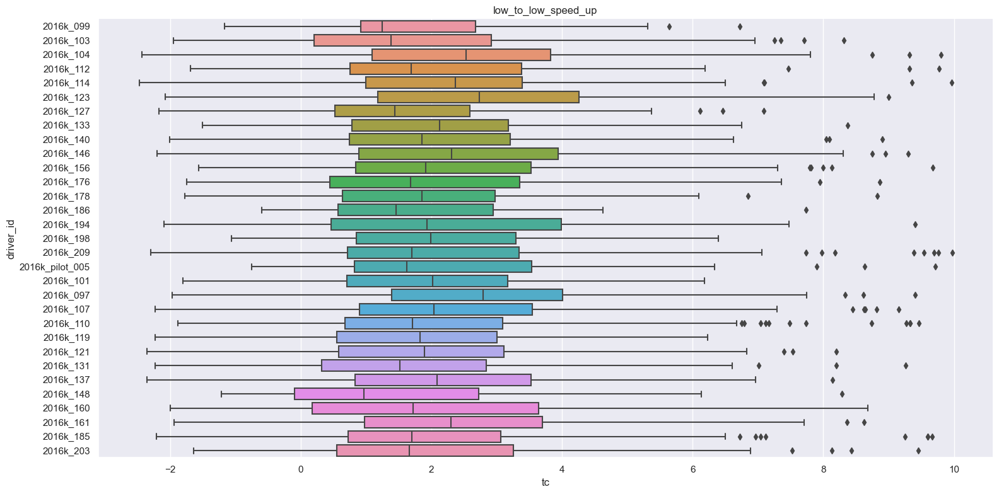

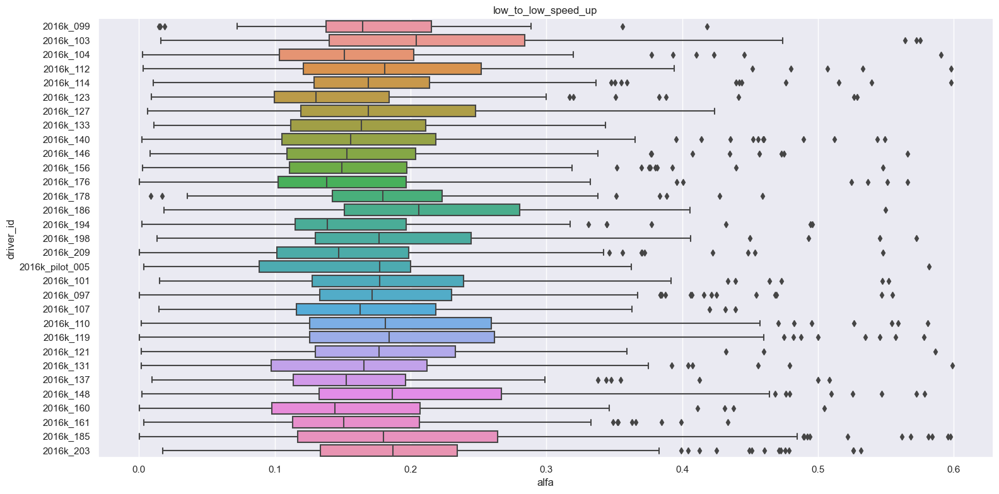

In [32]:
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [15, 25]
sns.catplot(data=low_to_low_df, y="driver_id", x="D", kind="box", height=8, aspect=2)
plt.title("low_to_low_speed_up")
plt.tight_layout()
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_D{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=low_to_low_df, y="driver_id", x="w0", kind="box", height=8, aspect=2)
plt.title("low_to_low_speed_up")
plt.tight_layout()
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_w0{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=low_to_low_df, y="driver_id", x="tc", kind="box", height=8, aspect=2)
plt.title("low_to_low_speed_up")
plt.tight_layout()
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_tc{postfix}.png".format(postfix = output_postfix))
sns.catplot(data=low_to_low_df, y="driver_id", x="alfa", kind="box", height=8, aspect=2)
plt.title("low_to_low_speed_up")
plt.tight_layout()
plt.savefig(save_path + "boxplot_comparing_all_drivers_for_alfa{postfix}.png".format(postfix = output_postfix))

## 2 drivers compared

In [51]:
driver1_index = 0
driver2_index = 1
driver1_df = filtered_parameters_df.loc[filtered_parameters_df.driver_id == unique_drivers[driver1_index]]
driver2_df = filtered_parameters_df.loc[filtered_parameters_df.driver_id == unique_drivers[driver2_index]]
driver1_df.sort_values(by=['velocity_class','driver_id'])
driver2_df.sort_values(by=['velocity_class','driver_id'])

,trip_name,speedup_index,driver_id,velocity_class,highway_driving,D,w0,tc,alfa,t_delay,auc_loss,Tp,OS,Ts
16147,10_20210525_1621949432683652_CT6_AVT_V3_export,5,2016k_198,high_to_high_speed_up,False,0.765387,0.397649,0.168870,0.023093,0.188412,0.486520,12.275905,2.384358,13.142521
16116,10_20210526_1622032910040786_CT6_AVT_V3_export,13,2016k_198,high_to_high_speed_up,False,0.664818,0.678186,9.558046,0.004367,-1.677547,1.617293,6.201224,6.105701,8.871732
16061,10_20210529_1622288812533776_CT6_AVT_V3_export,19,2016k_198,high_to_high_speed_up,False,0.761674,0.568919,1.588693,0.074246,0.177290,0.559398,8.522185,2.489893,9.230809
15906,10_20210617_1623888421163547_CT6_AVT_V3_export,1,2016k_198,high_to_high_speed_up,False,0.667458,0.421377,1.697303,0.094681,0.443409,0.832424,10.012166,5.984860,14.222144
15830,10_20210625_1624618714305115_CT6_AVT_V3_export,0,2016k_198,high_to_high_speed_up,True,0.748684,0.517534,3.215262,0.064179,1.222563,1.178498,9.156831,2.878228,10.323385
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15801,10_20210627_1624831334292330_CT6_AVT_V3_export,4,2016k_198,zero_to_low_speed_up,False,0.754210,0.436485,4.226424,0.084164,0.075203,0.482270,10.961203,2.709401,12.150619
16030,10_20210531_1622474730058257_CT6_AVT_V3_export,2,2016k_198,zero_to_mid_speed_up,False,0.838430,0.542382,3.411844,0.087067,0.207603,0.572712,10.627728,0.796299,8.796057
16024,10_20210531_1622475983226721_CT6_AVT_V3_export,1,2016k_198,zero_to_mid_speed_up,False,0.676582,0.718653,4.414496,0.082675,2.214820,1.076082,5.936577,5.576951,8.226598
15928,10_20210615_1623760729699487_CT6_AVT_V3_export,1,2016k_198,zero_to_mid_speed_up,False,0.672446,0.691074,3.148395,0.133723,0.319356,0.855193,6.141974,5.759985,8.607523


### Histograms

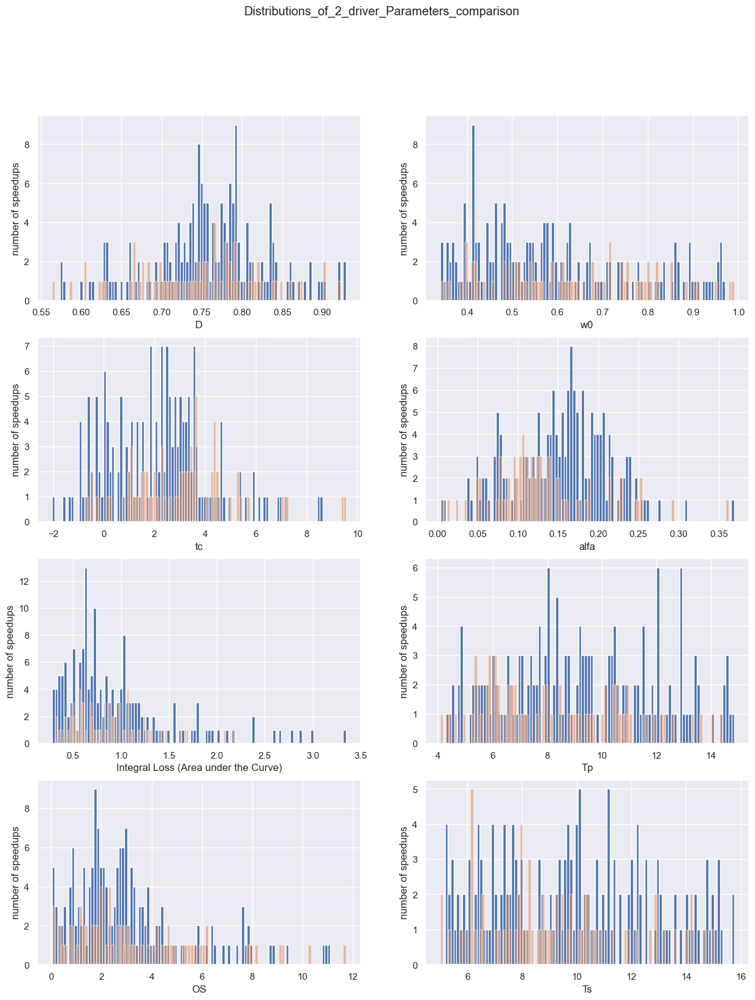

In [52]:
plt.rcParams['figure.figsize'] = [15, 18]
plt.suptitle('Distributions_of_2_driver_Parameters_comparison')
plt.subplot(4,2,1)
plt.hist(driver1_df.D.values, bins=100)
plt.hist(driver2_df.D.values, bins=100, alpha=0.5)
plt.ylabel("number of speedups")
plt.xlabel("D")
plt.subplot(4,2,2)
plt.hist(driver1_df.w0.values, bins=100)
plt.hist(driver2_df.w0.values, bins=100, alpha=0.5)
plt.ylabel("number of speedups")
plt.xlabel("w0")
plt.subplot(4,2,3)
plt.hist(driver1_df.tc.values, bins=100)
plt.hist(driver2_df.tc.values, bins=100, alpha=0.5)
plt.ylabel("number of speedups")
plt.xlabel("tc")
plt.subplot(4,2,4)
plt.hist(driver1_df.alfa.values, bins=100)
plt.hist(driver2_df.alfa.values, bins=100, alpha=0.5)
plt.ylabel("number of speedups")
plt.xlabel("alfa")
plt.subplot(4,2,5)
plt.hist(driver1_df.auc_loss.values, bins=100)
plt.hist(driver2_df.auc_loss.values, bins=100, alpha=0.5)
plt.ylabel("number of speedups")
plt.xlabel("Integral Loss (Area under the Curve)")
plt.subplot(4,2,6)
plt.hist(driver1_df.Tp.values, bins=100)
plt.hist(driver2_df.Tp.values, bins=100, alpha=0.5)
plt.ylabel("number of speedups")
plt.xlabel("Tp")
plt.subplot(4,2,7)
plt.hist(driver1_df.OS.values, bins=100)
plt.hist(driver2_df.OS.values, bins=100, alpha=0.5)
plt.ylabel("number of speedups")
plt.xlabel("OS")
plt.subplot(4,2,8)
plt.hist(driver1_df.Ts.values, bins=100)
plt.hist(driver2_df.Ts.values, bins=100, alpha=0.5)
plt.ylabel("number of speedups")
plt.xlabel("Ts")
plt.savefig(save_path + "Distributions_of_2_driver_Parameters_comparison_{postfix}.png".format(postfix = output_postfix))
plt.show()

### Scatterplots

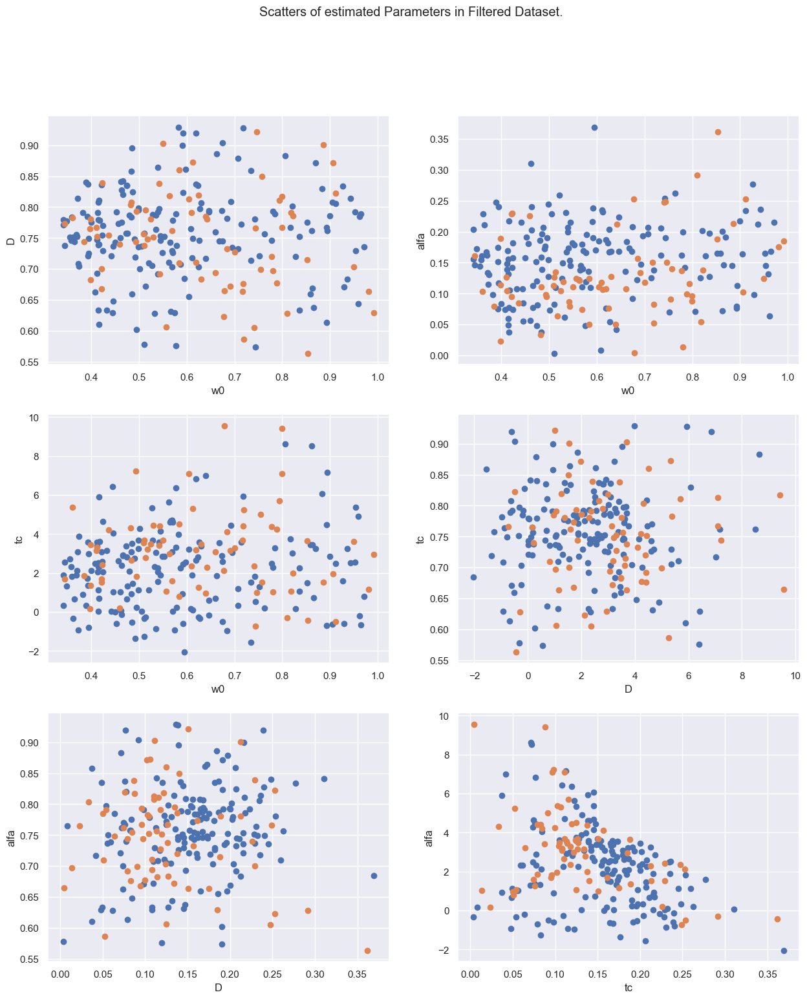

In [53]:
plt.rcParams['figure.figsize'] = [15, 17]
plt.suptitle('Scatters of estimated Parameters in Filtered Dataset.')
plt.subplot(3,2,1)
plt.scatter(driver1_df.w0.values, driver1_df.D.values)
plt.scatter(driver2_df.w0.values, driver2_df.D.values)
plt.ylabel("D")
plt.xlabel("w0")
plt.subplot(3,2,2)
plt.scatter(driver1_df.w0.values, driver1_df.alfa.values)
plt.scatter(driver2_df.w0.values, driver2_df.alfa.values)
plt.xlabel("w0")
plt.ylabel("alfa")
plt.subplot(3,2,3)
plt.scatter(driver1_df.w0.values, driver1_df.tc.values)
plt.scatter(driver2_df.w0.values, driver2_df.tc.values)
plt.xlabel("w0")
plt.ylabel("tc")
plt.subplot(3,2,4)
plt.scatter(driver1_df.tc.values, driver1_df.D.values)
plt.scatter(driver2_df.tc.values, driver2_df.D.values)
plt.ylabel("tc")
plt.xlabel("D")
plt.subplot(3,2,5)
plt.scatter(driver1_df.alfa.values, driver1_df.D.values)
plt.scatter(driver2_df.alfa.values, driver2_df.D.values)
plt.ylabel("alfa")
plt.xlabel("D")
plt.subplot(3,2,6)
plt.scatter(driver1_df.alfa.values, driver1_df.tc.values)
plt.scatter(driver2_df.alfa.values, driver2_df.tc.values)
plt.ylabel("alfa")
plt.xlabel("tc")
plt.savefig(save_path + "Scatters_of_estimated_Parameters_in_Filtered_Dataset_2_driver_comparison_{postfix}.png".format(postfix = output_postfix))
plt.show()

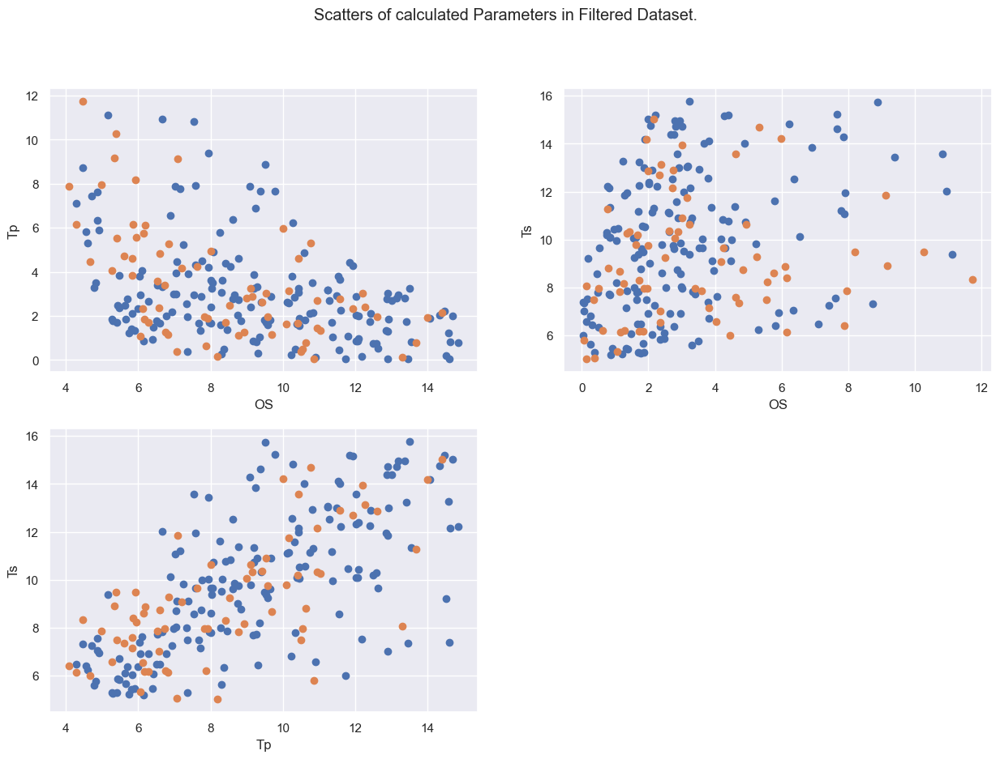

In [54]:
plt.rcParams['figure.figsize'] = [15, 10]
plt.suptitle('Scatters of calculated Parameters in Filtered Dataset.')
plt.subplot(2,2,1)
plt.scatter(driver1_df.Tp.values, driver1_df.OS.values)
plt.scatter(driver2_df.Tp.values, driver2_df.OS.values)
plt.ylabel("Tp")
plt.xlabel("OS")
plt.subplot(2,2,2)
plt.scatter(driver1_df.OS.values, driver1_df.Ts.values)
plt.scatter(driver2_df.OS.values, driver2_df.Ts.values)
plt.xlabel("OS")
plt.ylabel("Ts")
plt.subplot(2,2,3)
plt.scatter(driver1_df.Tp.values, driver1_df.Ts.values)
plt.scatter(driver2_df.Tp.values, driver2_df.Ts.values)
plt.xlabel("Tp")
plt.ylabel("Ts")
plt.savefig(save_path + "Scatters_of_calculated_Parameters_in_Filtered_Dataset_2_drivers_compared_{postfix}.png".format(postfix = output_postfix))
plt.show()

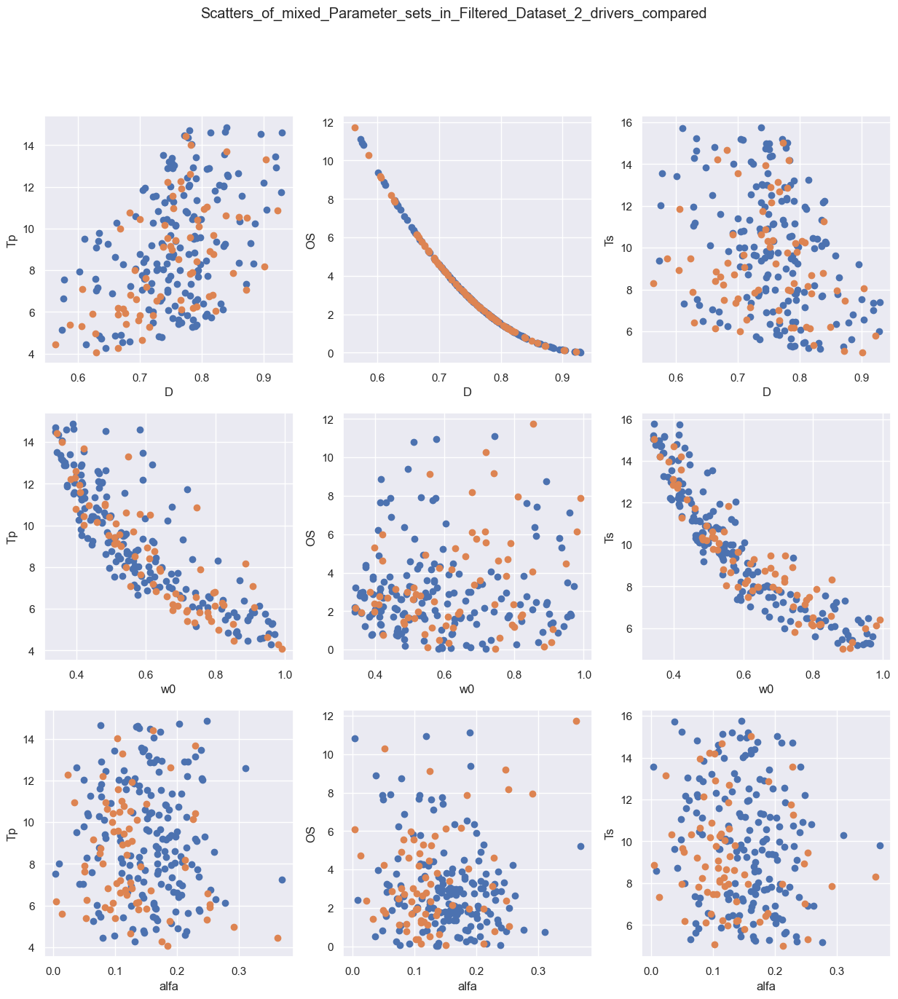

In [55]:
plt.rcParams['figure.figsize'] = [15, 15]
plt.suptitle('Scatters_of_mixed_Parameter_sets_in_Filtered_Dataset_2_drivers_compared')
plt.subplot(3,3,1)
plt.scatter(driver1_df.D.values, driver1_df.Tp.values)
plt.scatter(driver2_df.D.values, driver2_df.Tp.values)
plt.ylabel("Tp")
plt.xlabel("D")
plt.subplot(3,3,2)
plt.scatter(driver1_df.D.values, driver1_df.OS.values)
plt.scatter(driver2_df.D.values, driver2_df.OS.values)
plt.xlabel("D")
plt.ylabel("OS")
plt.subplot(3,3,3)
plt.scatter(driver1_df.D.values, driver1_df.Ts.values)
plt.scatter(driver2_df.D.values, driver2_df.Ts.values)
plt.xlabel("D")
plt.ylabel("Ts")
plt.subplot(3,3,4)
plt.scatter(driver1_df.w0.values, driver1_df.Tp.values)
plt.scatter(driver2_df.w0.values, driver2_df.Tp.values)
plt.ylabel("Tp")
plt.xlabel("w0")
plt.subplot(3,3,5)
plt.scatter(driver1_df.w0.values, driver1_df.OS.values)
plt.scatter(driver2_df.w0.values, driver2_df.OS.values)
plt.xlabel("w0")
plt.ylabel("OS")
plt.subplot(3,3,6)
plt.scatter(driver1_df.w0.values, driver1_df.Ts.values)
plt.scatter(driver2_df.w0.values, driver2_df.Ts.values)
plt.xlabel("w0")
plt.ylabel("Ts")
plt.subplot(3,3,7)
plt.scatter(driver1_df.alfa.values, driver1_df.Tp.values)
plt.scatter(driver2_df.alfa.values, driver2_df.Tp.values)
plt.ylabel("Tp")
plt.xlabel("alfa")
plt.subplot(3,3,8)
plt.scatter(driver1_df.alfa.values, driver1_df.OS.values)
plt.scatter(driver2_df.alfa.values, driver2_df.OS.values)
plt.xlabel("alfa")
plt.ylabel("OS")
plt.subplot(3,3,9)
plt.scatter(driver1_df.alfa.values, driver1_df.Ts.values)
plt.scatter(driver2_df.alfa.values, driver2_df.Ts.values)
plt.xlabel("alfa")
plt.ylabel("Ts")
plt.savefig(save_path + "Scatters_of_mixed_Parameter_sets_in_Filtered_Dataset_2_drivers_compared_{postfix}.png".format(postfix = output_postfix))
plt.show()

## Per Velocity Class Per Driver

In [56]:
filtered_parameters_df = filtered_parameters_df.sort_values(by=["driver_id"])
velocity_classes_df_dict = {}
for velocity_class in velocity_classes:
    velocity_class_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_class]
    velocity_classes_df_dict[velocity_class] = velocity_class_df

In [57]:
flatui = ["#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080",
    "#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080","#808080"]
flatui[25] = "#8d021F" #red
#flatui[16] = "#8d021F" 
flatui[26] = "#48aaad" #blue
#flatui[3] = "#48aaad"
my_cmap = ListedColormap(sns.color_palette(flatui).as_hex())

In [58]:
velocity_classes_overviews_df_dict = {}
per_driver_per_velocity_class_overview_df = per_driver_per_velocity_class_overview_df.sort_values(by=["driver_id"])
for velocity_class in velocity_classes:
    velocity_class_df = per_driver_per_velocity_class_overview_df.loc[per_driver_per_velocity_class_overview_df.velocity_class == velocity_class]
    velocity_classes_overviews_df_dict[velocity_class] = velocity_class_df

### Facetting Histograms

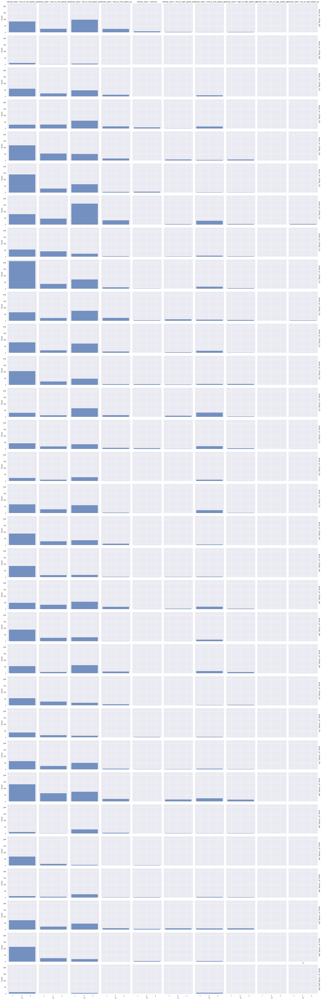

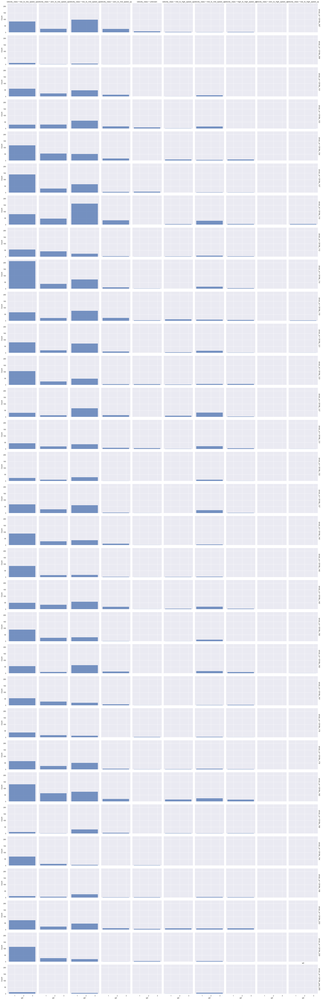

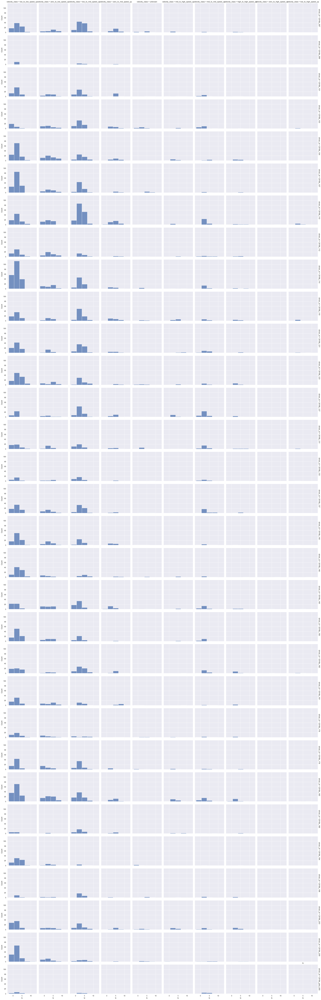

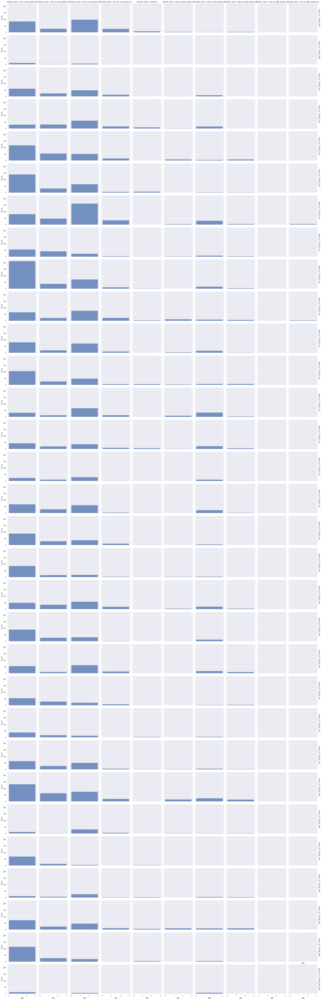

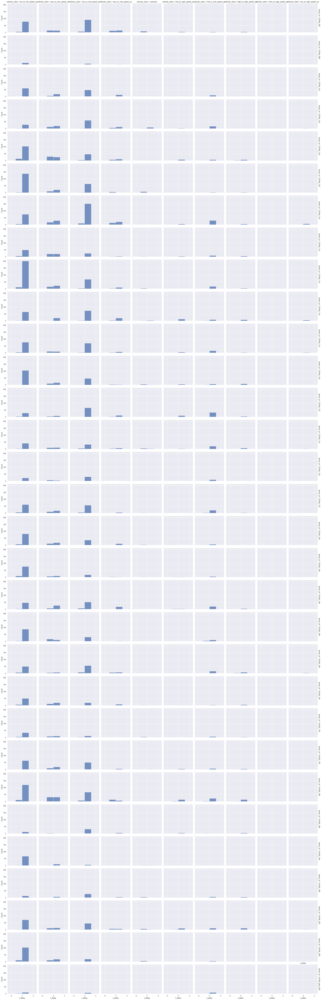

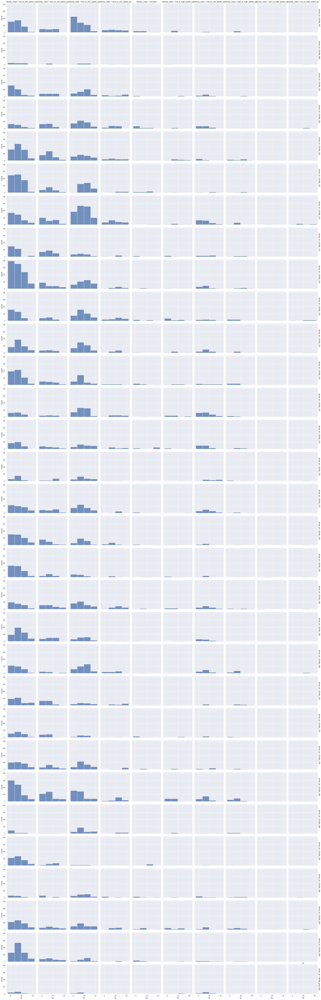

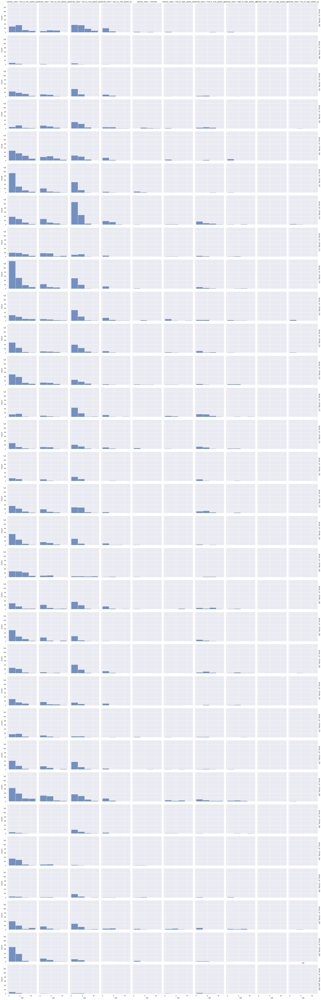

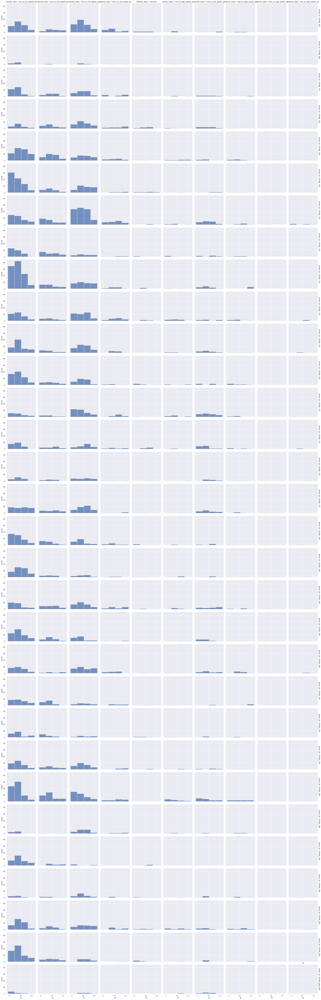

In [59]:
sns.set_theme(style="darkgrid")
sns.displot(filtered_parameters_df, x="D", col="velocity_class", row="driver_id", binwidth=3, height=3, facet_kws=dict(margin_titles=True))
plt.title("D")
plt.savefig(save_path + "Histograms_{p}_{postfix}.png".format(p = "D", postfix = output_postfix))
sns.displot(filtered_parameters_df, x="w0", col="velocity_class", row="driver_id", binwidth=3, height=3, facet_kws=dict(margin_titles=True))
plt.title("w0")
plt.savefig(save_path + "Histograms_{p}_{postfix}.png".format(p = "w0", postfix = output_postfix))
sns.displot(filtered_parameters_df, x="tc", col="velocity_class", row="driver_id", binwidth=3, height=3, facet_kws=dict(margin_titles=True))
plt.title("tc")
plt.savefig(save_path + "Histograms_{p}_{postfix}.png".format(p = "tc", postfix = output_postfix))
sns.displot(filtered_parameters_df, x="alfa", col="velocity_class", row="driver_id", binwidth=3, height=3, facet_kws=dict(margin_titles=True))
plt.title("alfa")
plt.savefig(save_path + "Histograms_{p}_{postfix}.png".format(p = "alfa", postfix = output_postfix))
sns.displot(filtered_parameters_df, x="t_delay", col="velocity_class", row="driver_id", binwidth=3, height=3, facet_kws=dict(margin_titles=True))
plt.title("t_delay")
plt.savefig(save_path + "Histograms_{p}_{postfix}.png".format(p = "t_delay", postfix = output_postfix))
sns.displot(filtered_parameters_df, x="Tp", col="velocity_class", row="driver_id", binwidth=3, height=3, facet_kws=dict(margin_titles=True))
plt.title("Tp")
plt.savefig(save_path + "Histograms_{p}_{postfix}.png".format(p = "Tp", postfix = output_postfix))
sns.displot(filtered_parameters_df, x="OS", col="velocity_class", row="driver_id", binwidth=3, height=3, facet_kws=dict(margin_titles=True))
plt.title("OS")
plt.savefig(save_path + "Histograms_{p}_{postfix}.png".format(p = "OS", postfix = output_postfix))
sns.displot(filtered_parameters_df, x="Ts", col="velocity_class", row="driver_id", binwidth=3, height=3, facet_kws=dict(margin_titles=True))
plt.title("Ts")
plt.savefig(save_path + "Histograms_{p}_{postfix}.png".format(p = "Ts", postfix = output_postfix))
plt.show()

### Dot plot

In [60]:
def create_dot_plot(save_path, per_driver_per_velocity_class_overview_df, unique_drivers, velocity_classes, flatui, avg_parameter):
    unique_drivers.sort()
    velocity_classes.sort()
    overview = pd.DataFrame(columns=velocity_classes)
    for driver in unique_drivers:
        driver_df = per_driver_per_velocity_class_overview_df.loc[per_driver_per_velocity_class_overview_df.driver_id == driver]
        driver_df = driver_df.sort_values(by=["velocity_class"])
        overview.loc[-1] = list(driver_df[avg_parameter].values)
        overview.index = overview.index + 1
    overview["driver_id"] = unique_drivers

    plt.rcParams['figure.figsize'] = [30, 30]
    unique_drivers.sort()
    sns.set_theme(style="whitegrid")
    # Make the PairGrid
    g = sns.PairGrid(overview,
                    x_vars=overview.columns[:9], y_vars=["driver_id"],
                    height=10, aspect=.25, palette=sns.color_palette(flatui).as_hex())

    # Draw a dot plot using the stripplot function
    g.map(sns.stripplot, size=10, orient="h", jitter=False,
        palette="flare_r", linewidth=1, edgecolor="w")

    # Use the same x axis limits on all columns and add better labels
    g.set(xlim=(0.5, 1), xlabel=avg_parameter, ylabel="")

    # Use semantically meaningful titles for the columns
    titles = velocity_classes

    for ax, title in zip(g.axes.flat, titles):

        # Set a different title for each axes
        ax.set(title=title)

        # Make the grid horizontal instead of vertical
        ax.xaxis.grid(False)
        ax.yaxis.grid(True)

    sns.despine(left=True, bottom=True)
    plt.savefig(save_path + "{p}_overview.png".format(p = avg_parameter))

#### D

In [61]:
create_dot_plot(save_path, per_driver_per_velocity_class_overview_df, unique_drivers, velocity_classes, flatui, "avg_D")

TypeError: '<' not supported between instances of 'float' and 'str'

#### w0

In [ ]:
create_dot_plot(save_path, per_driver_per_velocity_class_overview_df, drivers_ranked, velocity_classes, flatui, "avg_w0")

#### alfa

In [ ]:
create_dot_plot(save_path, per_driver_per_velocity_class_overview_df, unique_drivers, velocity_classes, flatui, "avg_alfa")

#### tc

In [ ]:
create_dot_plot(save_path, per_driver_per_velocity_class_overview_df, drivers_ranked, velocity_classes, flatui, "avg_tc")

#### Tp

In [ ]:
create_dot_plot(save_path, per_driver_per_velocity_class_overview_df, unique_drivers, velocity_classes, flatui, "avg_Tp")

#### OS

In [ ]:
create_dot_plot(save_path, per_driver_per_velocity_class_overview_df, drivers_ranked, velocity_classes, flatui, "avg_OS")

#### Ts

In [ ]:
create_dot_plot(save_path, per_driver_per_velocity_class_overview_df, unique_drivers, velocity_classes, flatui, "avg_Ts")

### Boxplots

In [ ]:
for i in range(9):
    sns.catplot(data=velocity_classes_df_dict[velocity_classes[i]], y="driver_id", x="alfa", kind="box",height=8, aspect=2)
    plt.title(velocity_classes[i])
    plt.savefig(save_path + "Boxplot_{v}_alfa_{postfix}.png".format(v = velocity_class, postfix = output_postfix))
    plt.show()
    sns.catplot(data=velocity_classes_df_dict[velocity_classes[i]], y="driver_id", x="w0", kind="box",height=8, aspect=2)
    plt.title(velocity_classes[i])
    plt.savefig(save_path + "Boxplot_{v}_w0_{postfix}.png".format(v = velocity_class, postfix = output_postfix))
    plt.show()
    sns.catplot(data=velocity_classes_df_dict[velocity_classes[i]], y="driver_id", x="D", kind="box",height=8, aspect=2)
    plt.title(velocity_classes[i])
    plt.savefig(save_path + "Boxplot_{v}_D_{postfix}.png".format(v = velocity_class, postfix = output_postfix))
    plt.show()
    sns.catplot(data=velocity_classes_df_dict[velocity_classes[i]], y="driver_id", x="tc", kind="box",height=8, aspect=2)
    plt.title(velocity_classes[i])
    plt.savefig(save_path + "Boxplot_{v}_tc_{postfix}.png".format(v = velocity_class, postfix = output_postfix))
    plt.show()
    sns.catplot(data=velocity_classes_df_dict[velocity_classes[i]], y="driver_id", x="Tp", kind="box",height=8, aspect=2)
    plt.title(velocity_classes[i])
    plt.savefig(save_path + "Boxplot_{v}_Tp_{postfix}.png".format(v = velocity_class, postfix = output_postfix))
    plt.show()
    sns.catplot(data=velocity_classes_df_dict[velocity_classes[i]], y="driver_id", x="OS", kind="box",height=8, aspect=2)
    plt.title(velocity_classes[i])
    plt.savefig(save_path + "Boxplot_{v}_OS_{postfix}.png".format(v = velocity_class, postfix = output_postfix))
    plt.show()
    sns.catplot(data=velocity_classes_df_dict[velocity_classes[i]], y="driver_id", x="Ts", kind="box",height=8, aspect=2)
    plt.title(velocity_classes[i])
    plt.savefig(save_path + "Boxplot_{v}_Ts_{postfix}.png".format(v = velocity_class, postfix = output_postfix))
    plt.show()

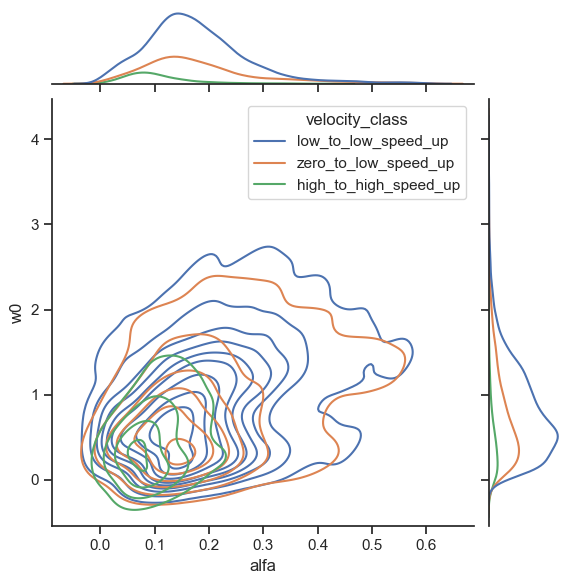

In [39]:
sns.set_theme(style="ticks")

reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.velocity_class == "low_to_low_speed_up") | (filtered_parameters_df.velocity_class == "zero_to_low_speed_up") | (filtered_parameters_df.velocity_class == "high_to_high_speed_up")]

# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="velocity_class",
    kind="kde",
)

In [41]:
plt.rcParams['figure.figsize'] = [30, 30]
group_a_ca_pt2_parameters_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == "low_to_low_speed_up"]
group_a_ca_pt2_parameters_df = group_a_ca_pt2_parameters_df.loc[(group_a_ca_pt2_parameters_df.driver_id == "2016k_185") | (group_a_ca_pt2_parameters_df.driver_id == "2016k_198") | (group_a_ca_pt2_parameters_df.driver_id == "2016k_178")]
g = sns.PairGrid(minimal_ca_pt2_parameters_df, hue="driver_id", diag_sharey=False, vars=["w0", "alfa","OS"])
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)
g.add_legend()
plt.show()

NameError: name 'minimal_ca_pt2_parameters_df' is not defined

In [42]:
df = pd.DataFrame(columns=["driver", "number_of_speedups"])
group_b_ca_pt2_parameters_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == "low_to_low_speed_up"]
for driver in unique_drivers:
    driver_df = group_b_ca_pt2_parameters_df.loc[group_b_ca_pt2_parameters_df.driver_id == driver]
    df.loc[-1] = [driver, driver_df.shape[0]]
    df.index = df.index + 1
df = df.sort_values(by="number_of_speedups")
df

,driver,number_of_speedups
24,NaN,0.0
17,2016k_099,29.0
16,2016k_186,37.0
0,2016k_pilot_005,40.0
22,2016k_133,58.0
15,2016k_198,58.0
14,2016k_176,120.0
25,2016k_127,123.0
21,2016k_131,130.0
26,2016k_103,135.0


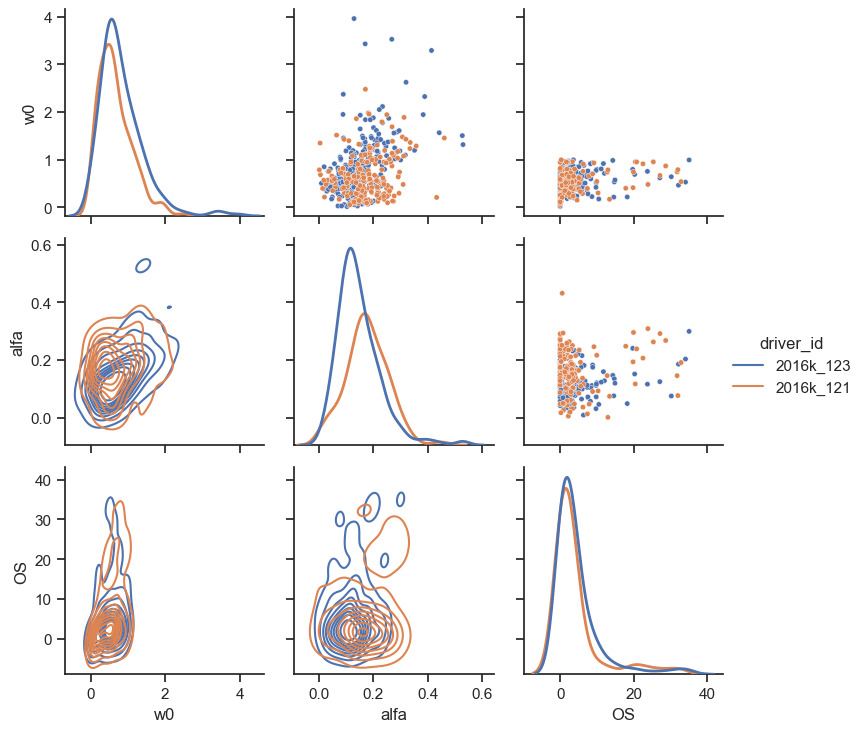

In [43]:
plt.rcParams['figure.figsize'] = [30, 30]
group_b_ca_pt2_parameters_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == "low_to_low_speed_up"]
group_b_ca_pt2_parameters_df = group_b_ca_pt2_parameters_df.loc[(group_b_ca_pt2_parameters_df.driver_id == "2016k_121") | (group_b_ca_pt2_parameters_df.driver_id == "2016k_123")]
g = sns.PairGrid(group_b_ca_pt2_parameters_df, hue="driver_id",diag_sharey=False, vars=["w0", "alfa","OS"])
g.map_upper(sns.scatterplot, s=15)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=2)
g.add_legend()
plt.show()

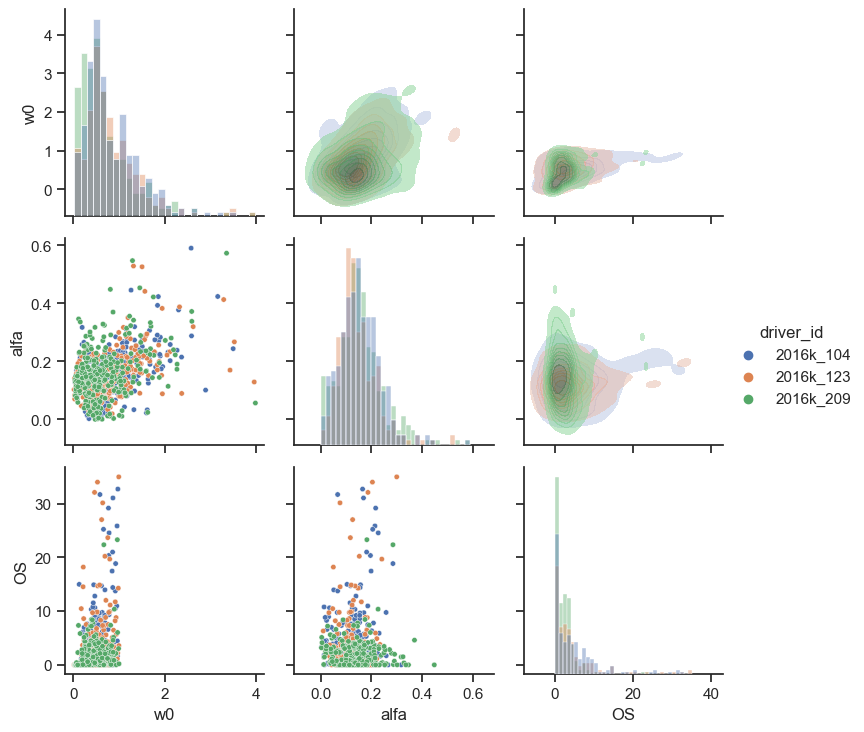

In [44]:
plt.rcParams['figure.figsize'] = [30, 30]
group_b_ca_pt2_parameters_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == "low_to_low_speed_up"]
group_b_ca_pt2_parameters_df = group_b_ca_pt2_parameters_df.loc[(group_b_ca_pt2_parameters_df.driver_id == "2016k_123") | (group_b_ca_pt2_parameters_df.driver_id == "2016k_209") | (group_b_ca_pt2_parameters_df.driver_id == "2016k_104")]
g = sns.PairGrid(group_b_ca_pt2_parameters_df, hue="driver_id",diag_sharey=False, vars=["w0", "alfa","OS"])
g.map_upper(sns.kdeplot, fill=True, alpha=0.5, multiple="stack")
g.map_lower(sns.scatterplot, s=15)
g.map_diag(sns.histplot, alpha=0.4)
g.add_legend()
plt.show()

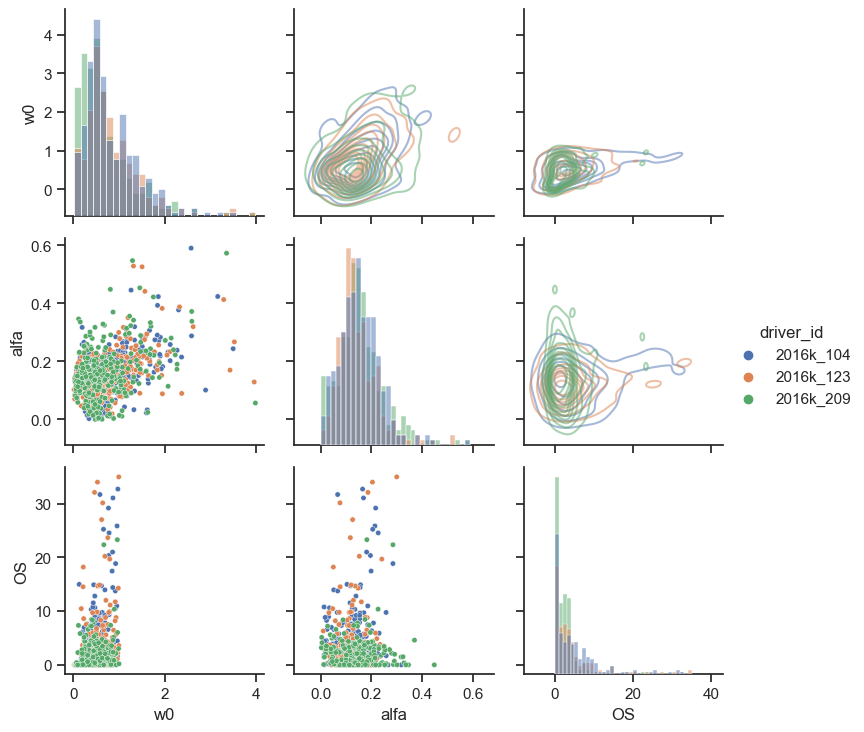

In [45]:
plt.rcParams['figure.figsize'] = [30, 30]
group_b_ca_pt2_parameters_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == "low_to_low_speed_up"]
group_b_ca_pt2_parameters_df = group_b_ca_pt2_parameters_df.loc[(group_b_ca_pt2_parameters_df.driver_id == "2016k_123") | (group_b_ca_pt2_parameters_df.driver_id == "2016k_209") | (group_b_ca_pt2_parameters_df.driver_id == "2016k_104")]
g = sns.PairGrid(group_b_ca_pt2_parameters_df, hue="driver_id",diag_sharey=False, vars=["w0", "alfa","OS"])
g.map_upper(sns.kdeplot, fill=False, alpha=0.5)
g.map_lower(sns.scatterplot, s=15)
g.map_diag(sns.histplot)
g.add_legend()
plt.show()

<Figure size 3000x3000 with 0 Axes>

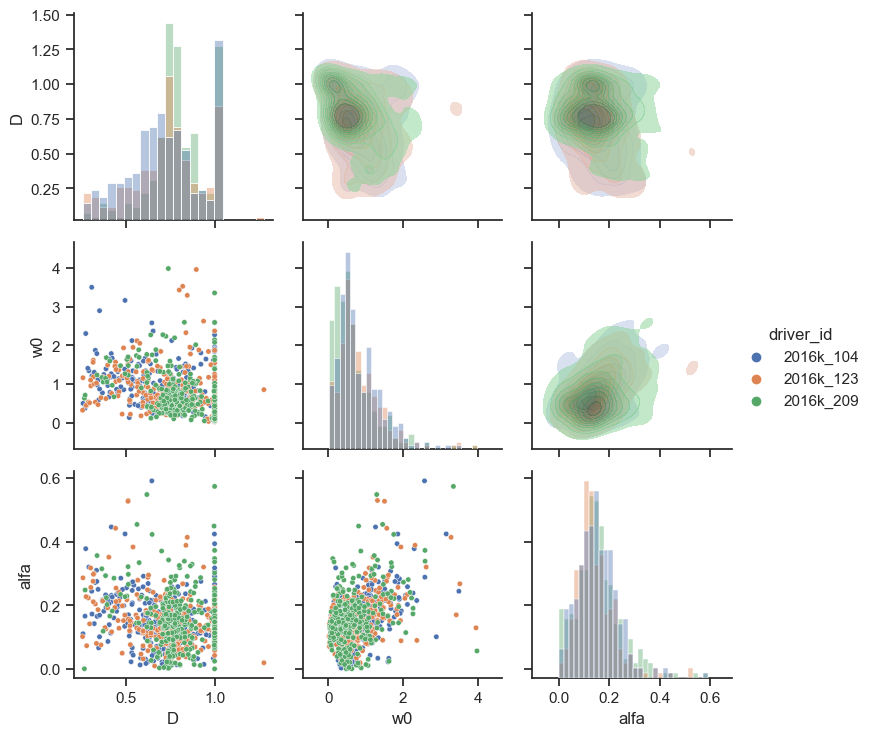

In [51]:
plt.rcParams['figure.figsize'] = [30, 30]
group_b_ca_pt2_parameters_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == "low_to_low_speed_up"]
group_b_ca_pt2_parameters_df = group_b_ca_pt2_parameters_df.loc[(group_b_ca_pt2_parameters_df.driver_id == "2016k_123") | (group_b_ca_pt2_parameters_df.driver_id == "2016k_209") | (group_b_ca_pt2_parameters_df.driver_id == "2016k_104")]
g = sns.PairGrid(group_b_ca_pt2_parameters_df, hue="driver_id",diag_sharey=False, vars=["D","w0", "alfa"])
g.map_upper(sns.kdeplot, fill=True, alpha=0.5, multiple="stack")
g.map_lower(sns.scatterplot, s=15)
g.map_diag(sns.histplot, alpha=0.4)
g.add_legend()
plt.show()

#### Pairplots: per driver per velocity class

c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)


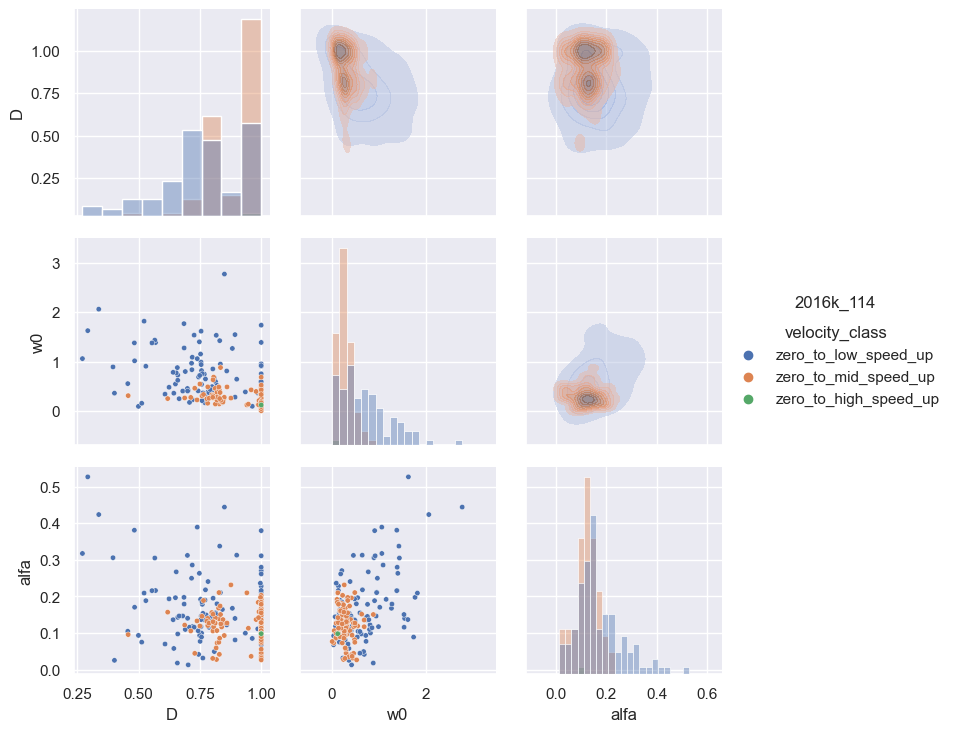

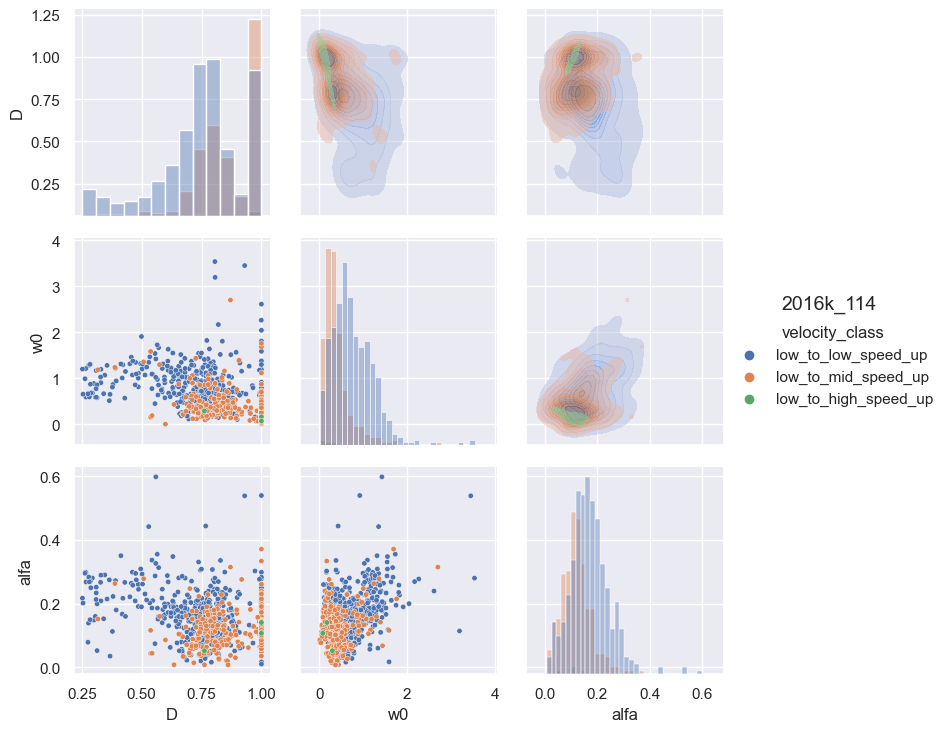

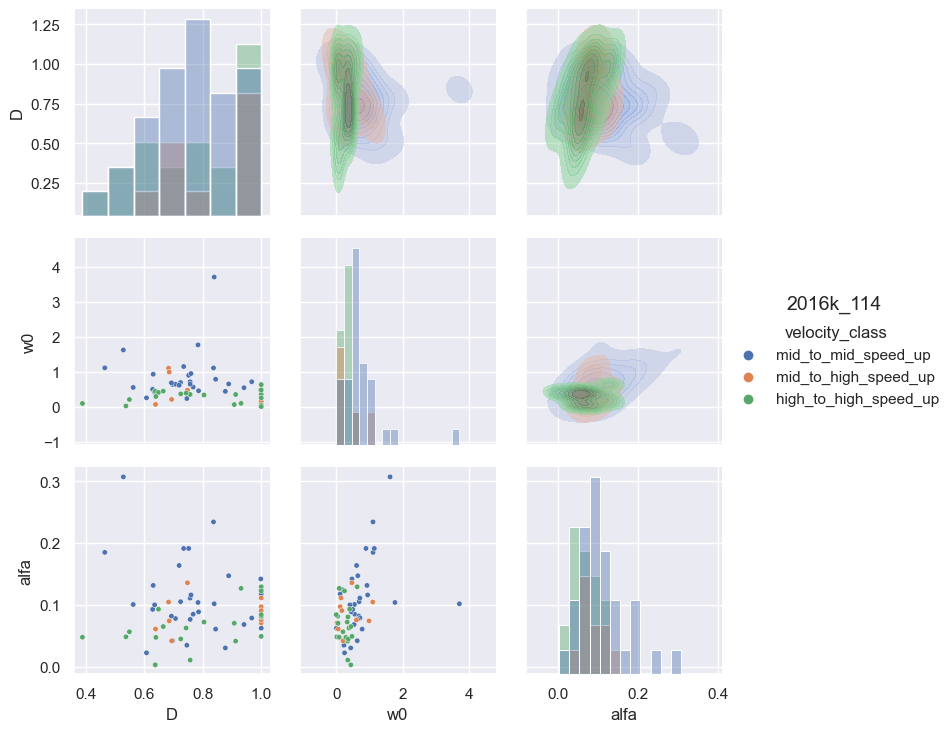

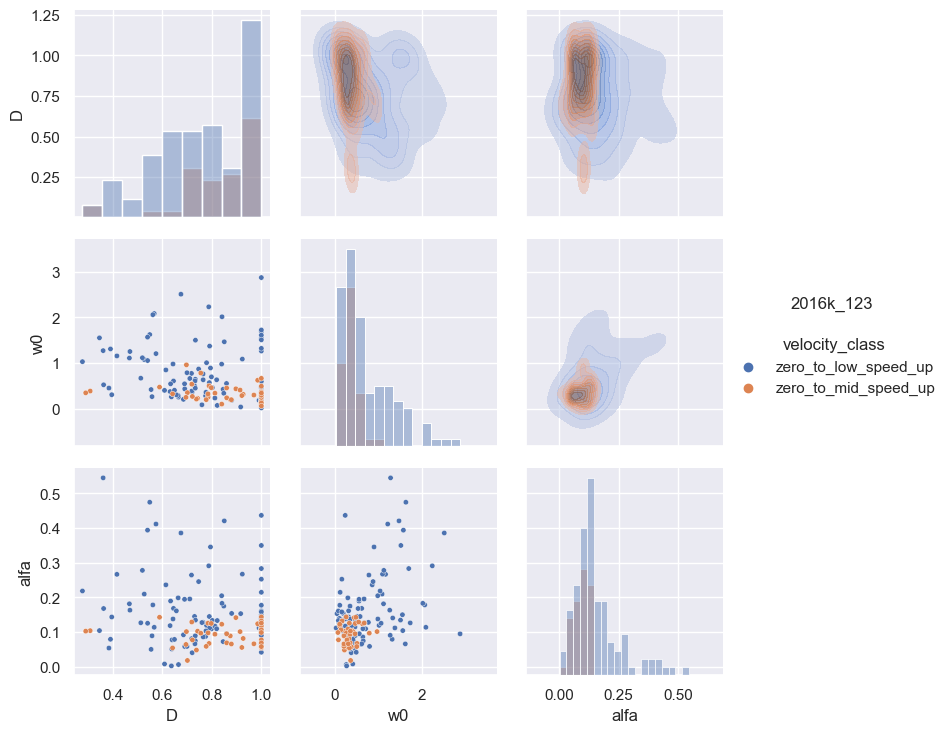

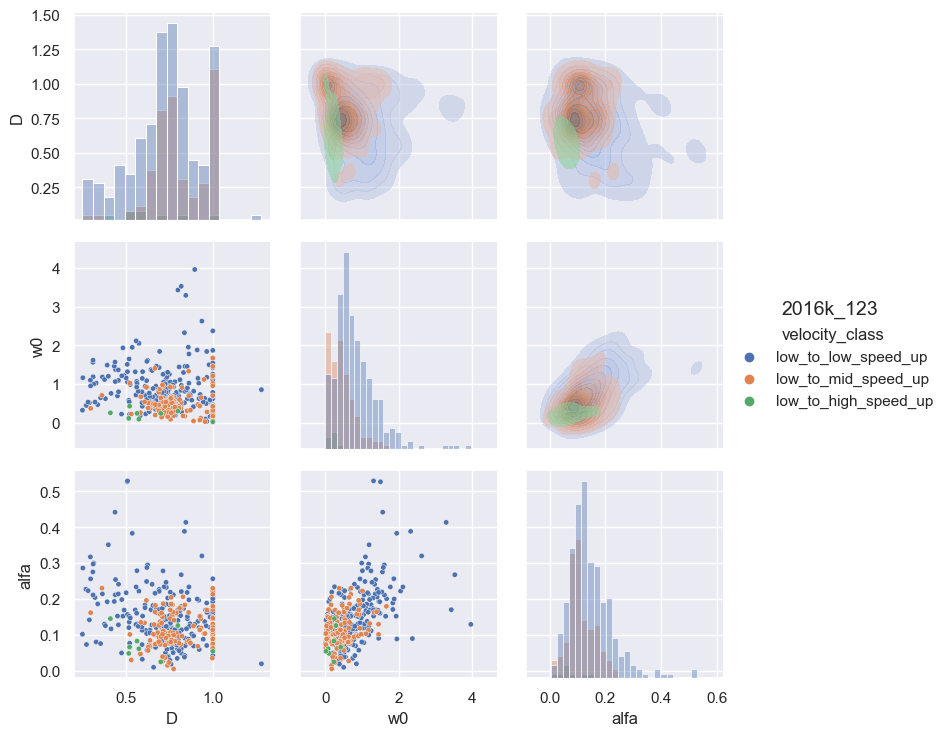

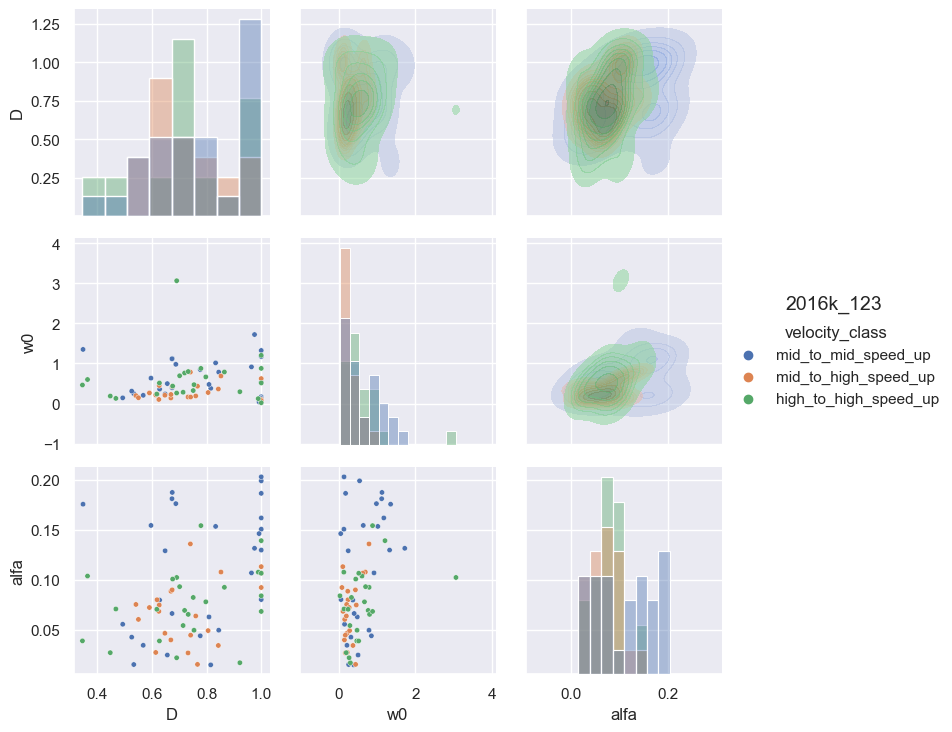

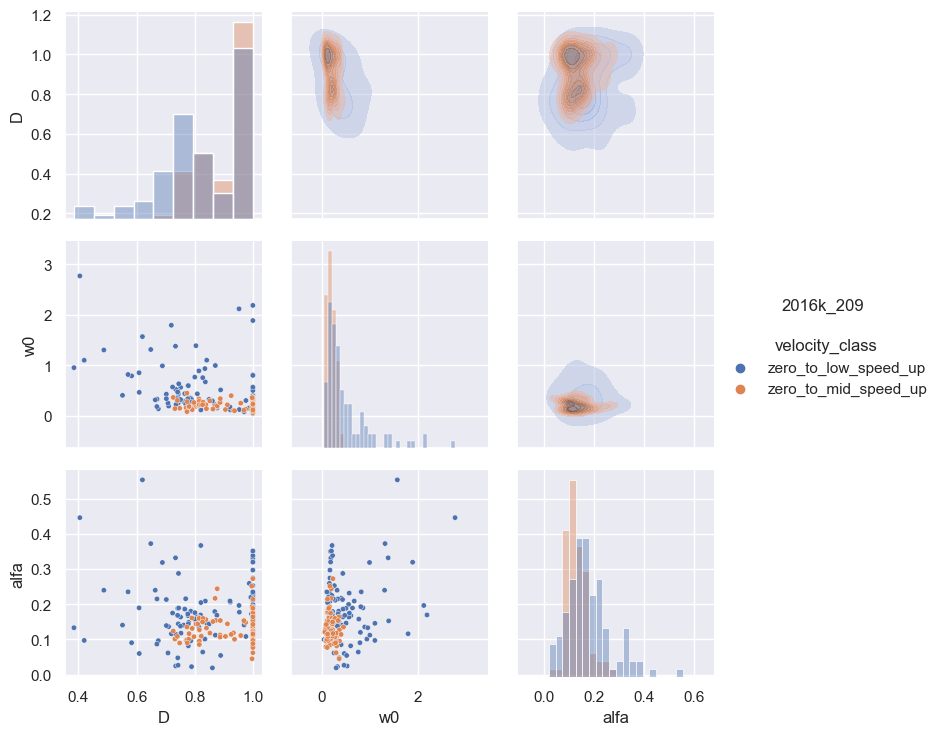

c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)


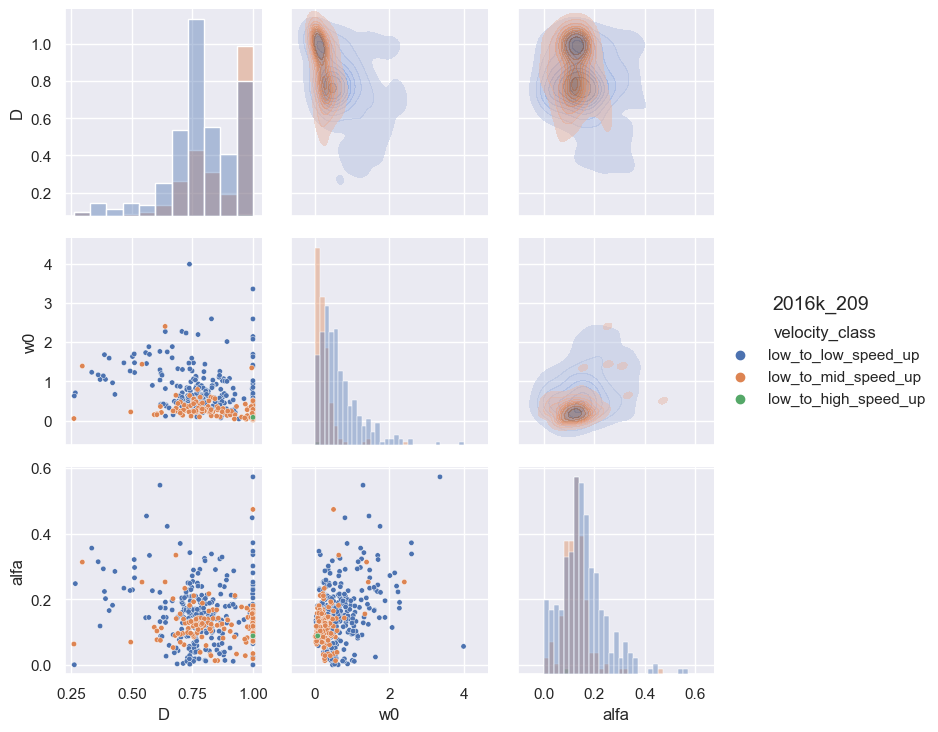

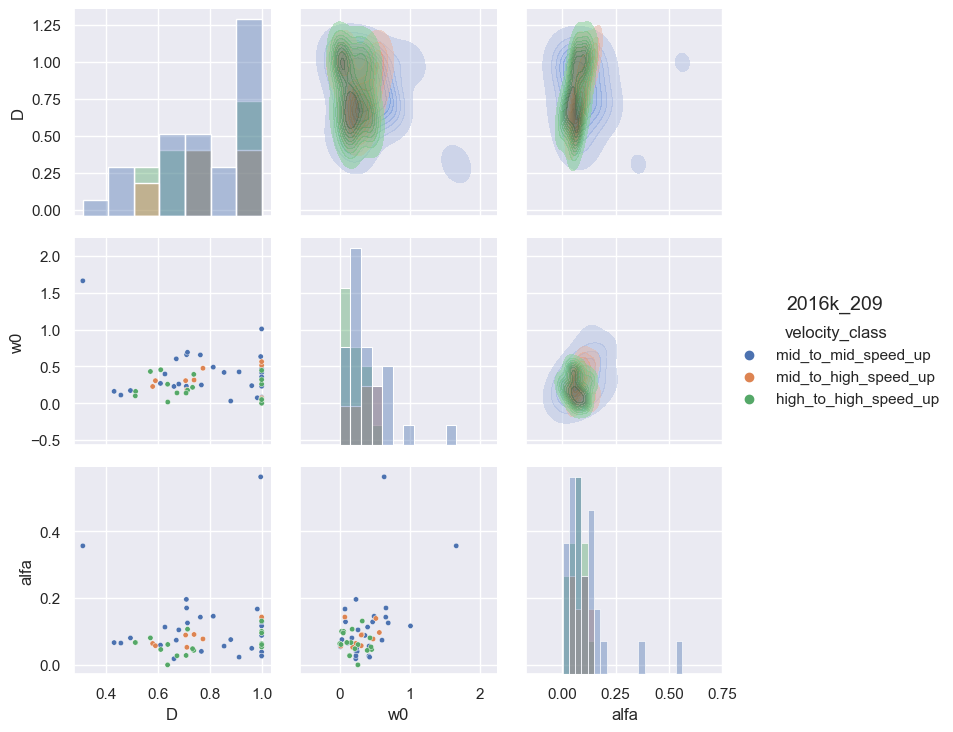

c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)


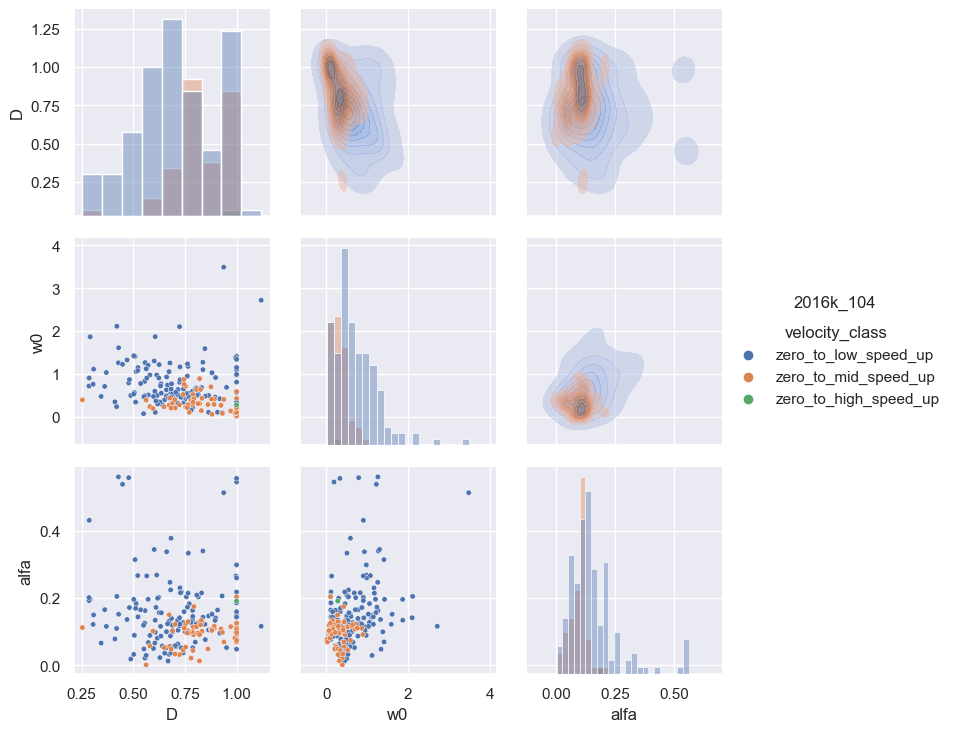

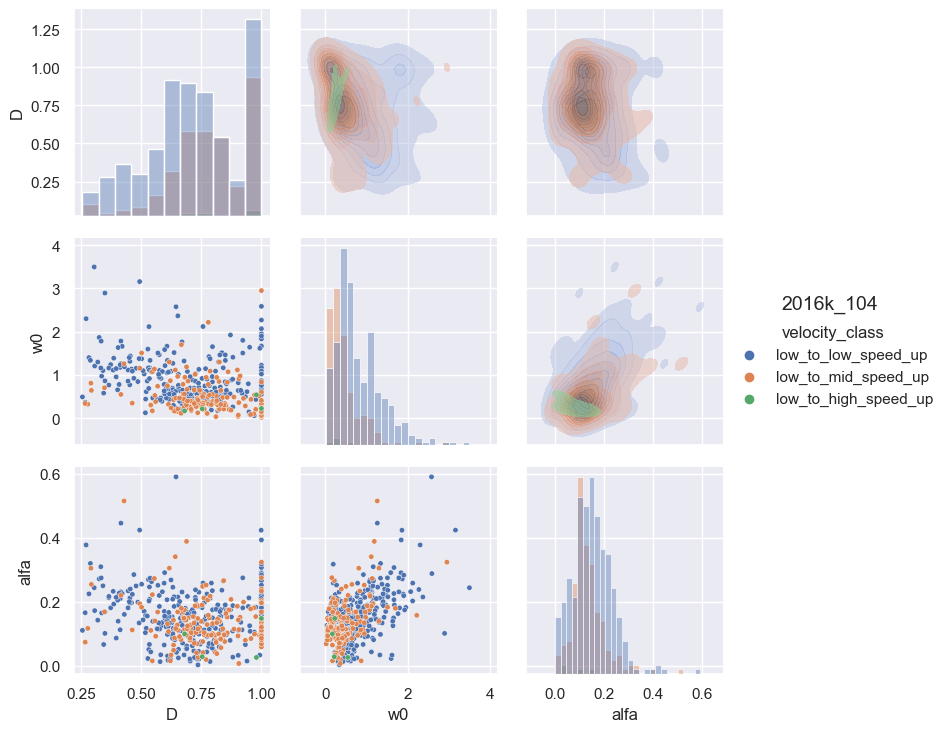

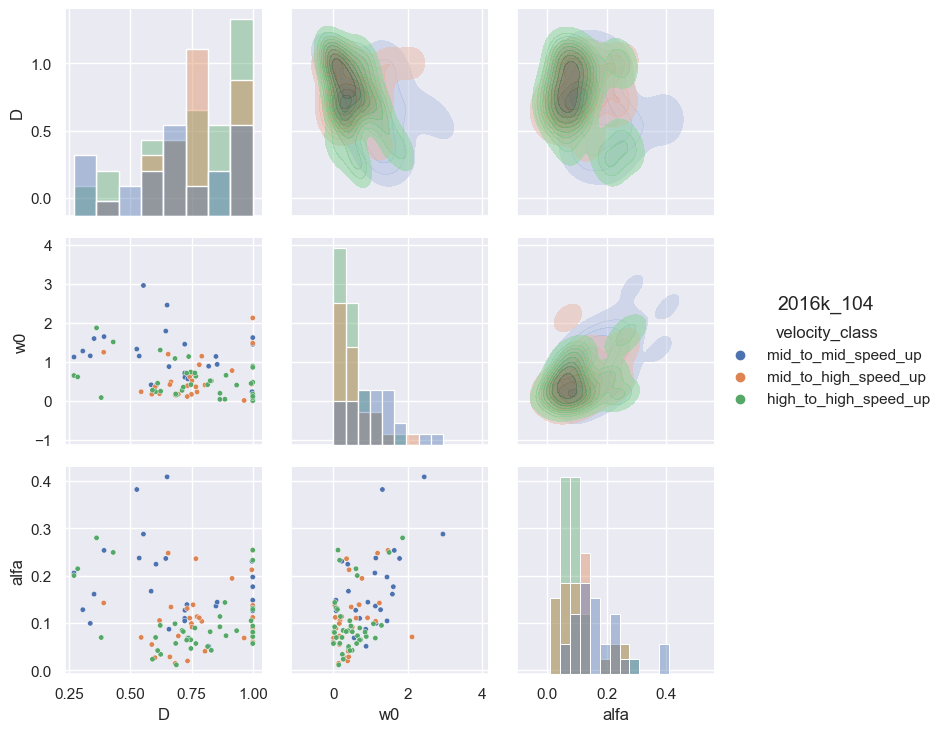

In [113]:
filtered_parameters_df = filtered_parameters_df.sort_values(by="velocity_class")
selected_drivers = ["2016k_114","2016k_123", "2016k_209", "2016k_104"]
for driver in selected_drivers:
    plt.rcParams['figure.figsize'] = [30, 30]
    group_a_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_classes[0]]
    group_b_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_classes[1]]
    group_c_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_classes[2]]
    group_abc_ca_pt2_parameters_df = pd.concat([group_a_df, group_b_df, group_c_df])
    group_abc_ca_pt2_parameters_df = group_abc_ca_pt2_parameters_df.loc[group_abc_ca_pt2_parameters_df.driver_id == driver]
    g = sns.PairGrid(group_abc_ca_pt2_parameters_df, hue="velocity_class",diag_sharey=False, vars=["D","w0", "alfa"])
    g.map_upper(sns.kdeplot, fill=True, alpha=0.5, multiple="stack")
    g.map_lower(sns.scatterplot, s=15)
    g.map_diag(sns.histplot, alpha=0.4)
    g.add_legend()
    g.fig.suptitle(driver, fontsize=14, y=0.59, x=0.88)
    plt.savefig(save_path+"Pair_graph_"+driver+"_group1.png")
    plt.show()
    group_a_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_classes[3]]
    group_b_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_classes[4]]
    group_c_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_classes[5]]
    group_abc_ca_pt2_parameters_df = pd.concat([group_a_df, group_b_df, group_c_df])
    group_abc_ca_pt2_parameters_df = group_abc_ca_pt2_parameters_df.loc[group_abc_ca_pt2_parameters_df.driver_id == driver]
    g = sns.PairGrid(group_abc_ca_pt2_parameters_df, hue="velocity_class",diag_sharey=False, vars=["D","w0", "alfa"])
    g.map_upper(sns.kdeplot, fill=True, alpha=0.5, multiple="stack")
    g.map_lower(sns.scatterplot, s=15)
    g.map_diag(sns.histplot, alpha=0.4)
    g.add_legend()
    g.fig.suptitle(driver, fontsize=14, y=0.59, x=0.88)
    plt.savefig(save_path+"Pair_graph_"+driver+"_group2.png")
    plt.show()
    group_a_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_classes[6]]
    group_b_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_classes[7]]
    group_c_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_classes[8]]
    group_abc_ca_pt2_parameters_df = pd.concat([group_a_df, group_b_df, group_c_df])
    group_abc_ca_pt2_parameters_df = group_abc_ca_pt2_parameters_df.loc[group_abc_ca_pt2_parameters_df.driver_id == driver]
    g = sns.PairGrid(group_abc_ca_pt2_parameters_df, hue="velocity_class", diag_sharey=False, vars=["D","w0", "alfa"])
    g.map_upper(sns.kdeplot, fill=True, alpha=0.5, multiple="stack")
    g.map_lower(sns.scatterplot, s=15)
    g.map_diag(sns.histplot, alpha=0.4)
    g.add_legend()
    g.fig.suptitle(driver, fontsize=14, y=0.59, x=0.88)
    plt.savefig(save_path+"Pair_graph_"+driver+"_group3.png")
    plt.show()

#### Pairplots: per velocity class per driver

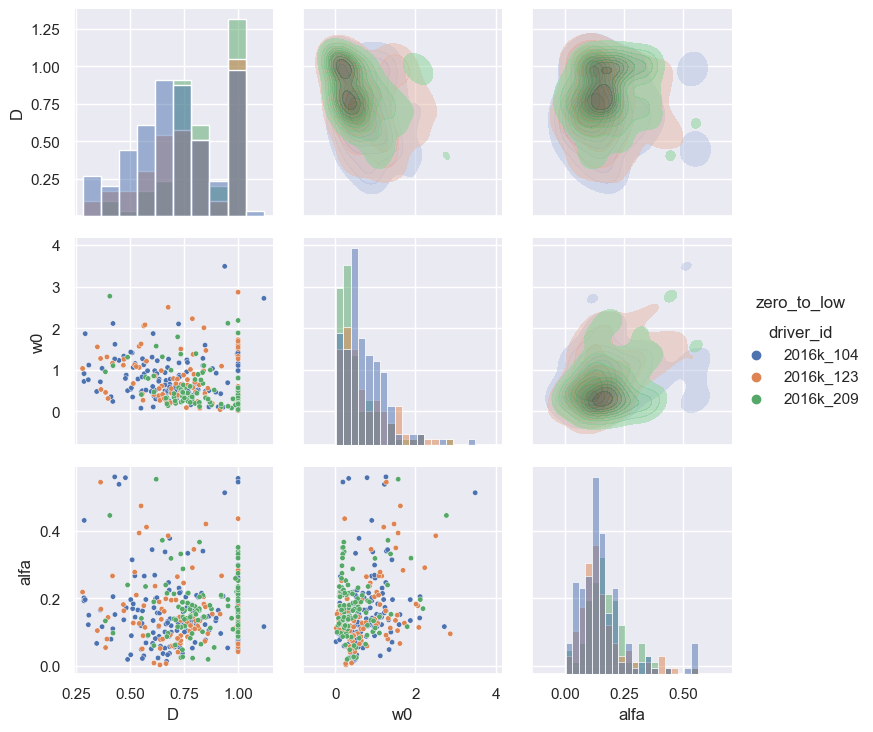

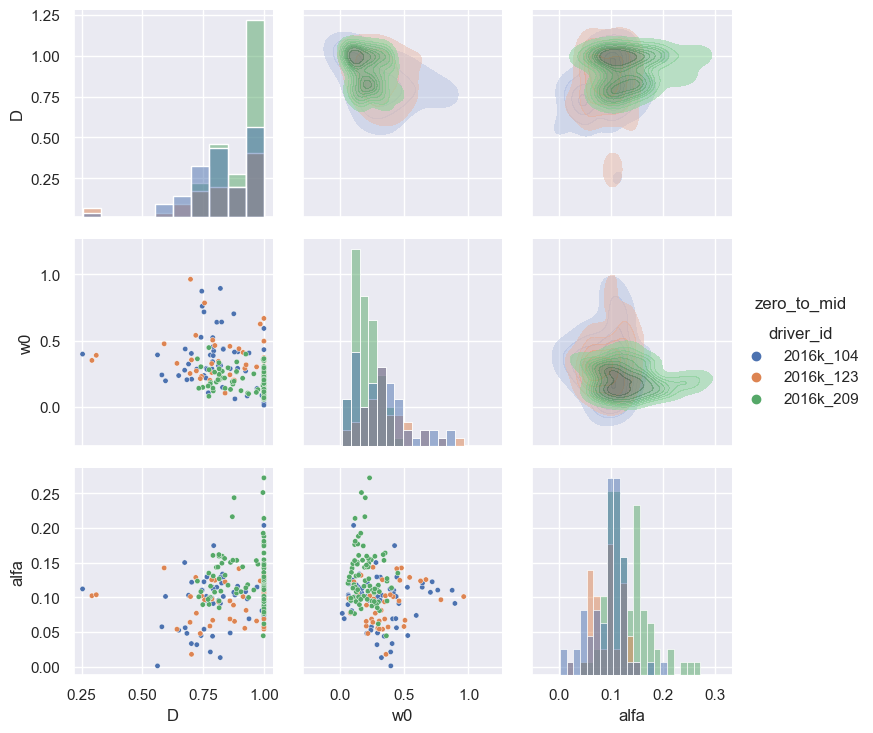

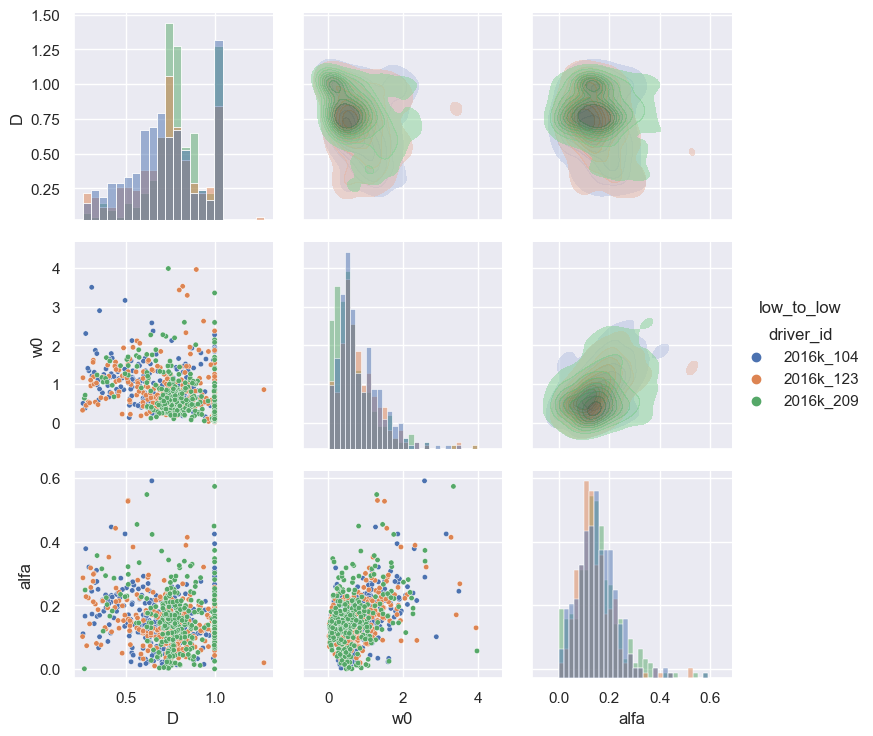

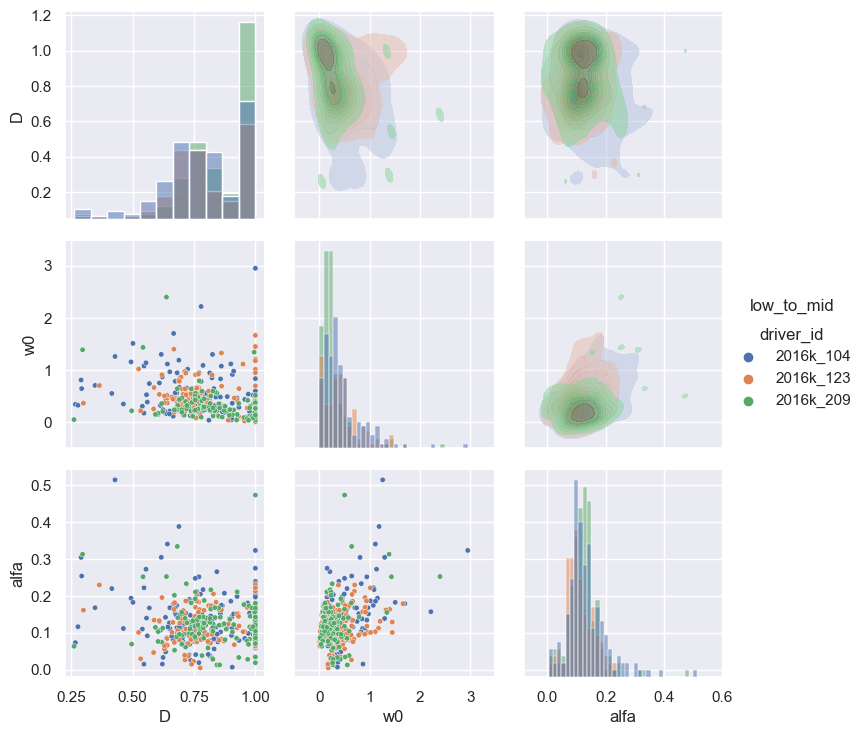

c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)
c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\seaborn\axisgrid.py:1609: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  func(x=x, y=y, **kwargs)


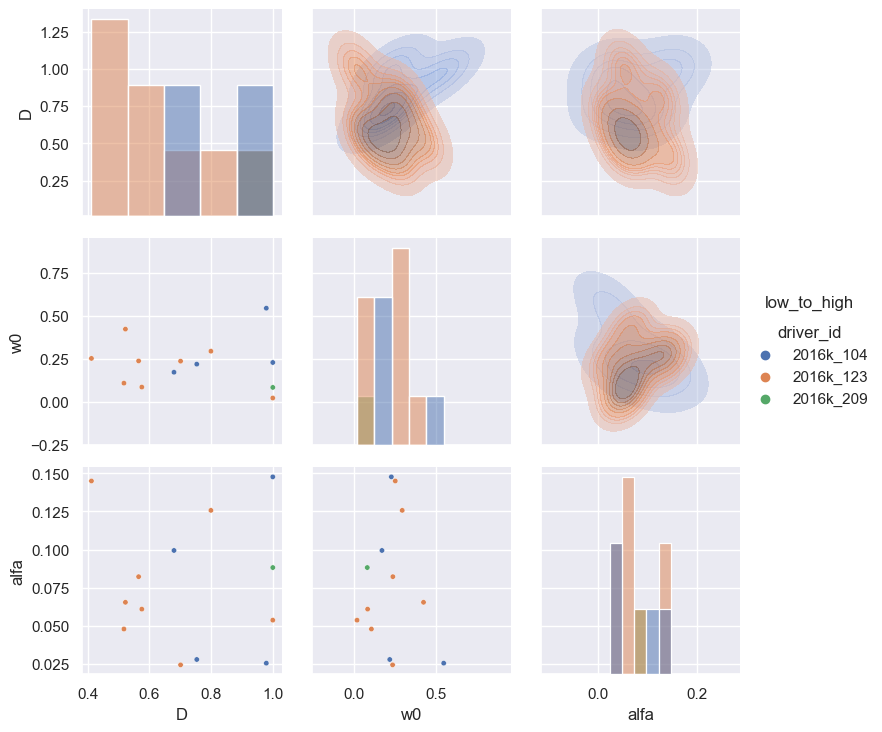

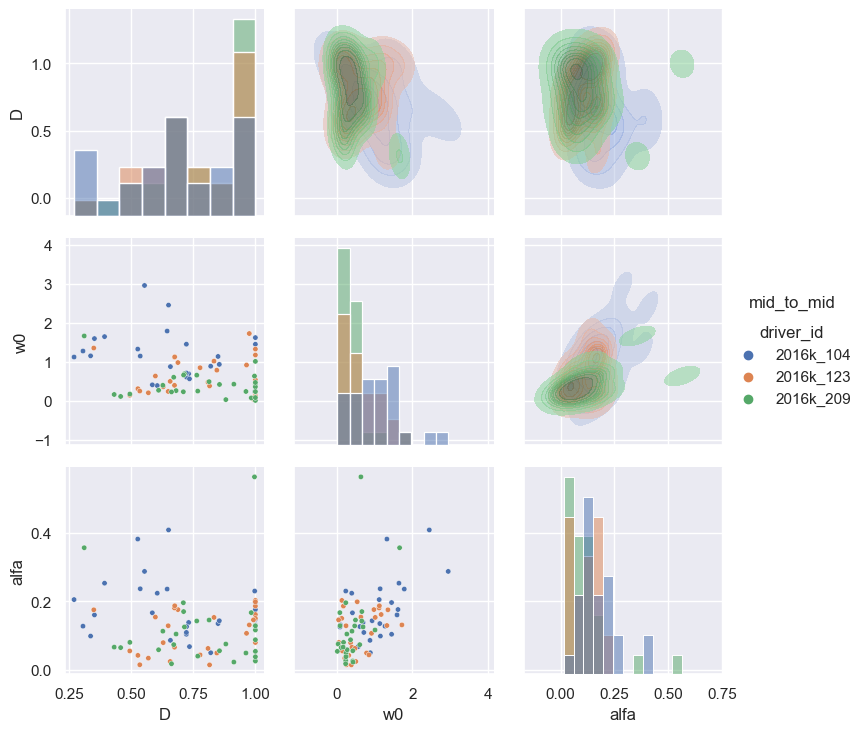

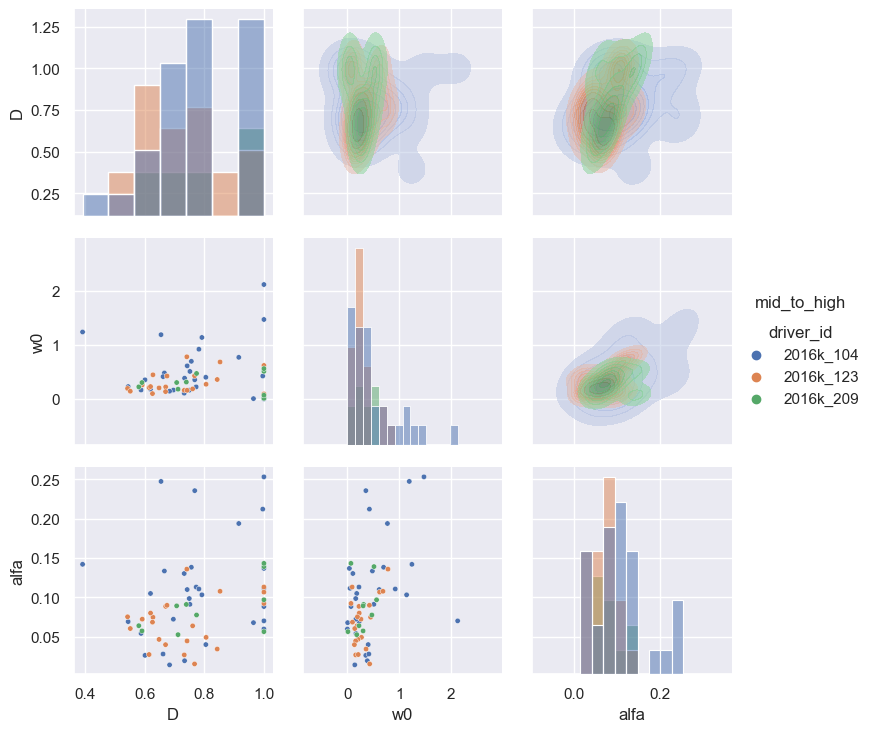

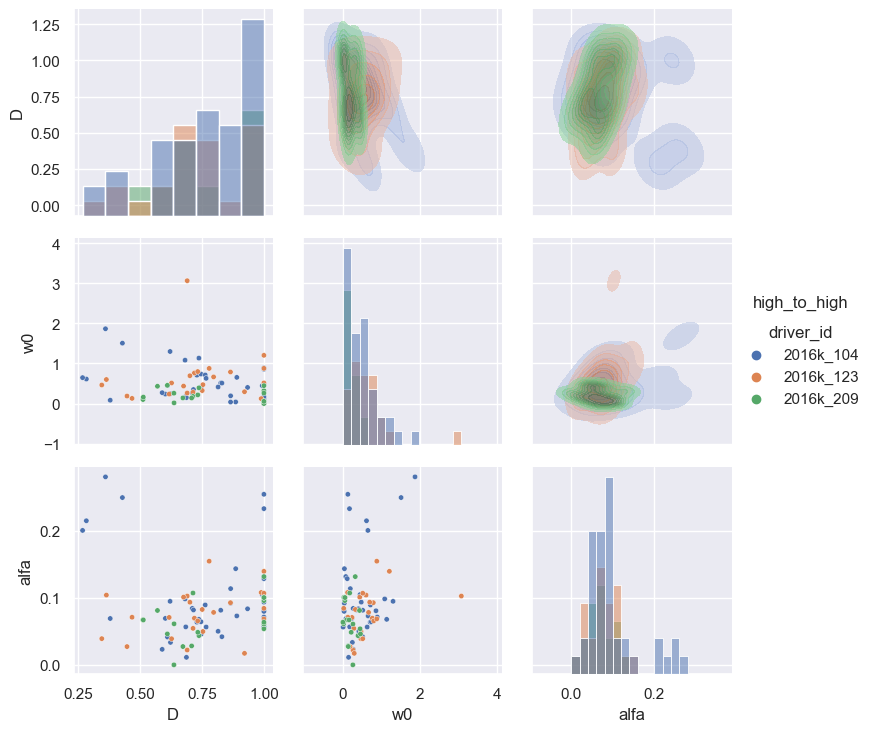

In [109]:
plt.rcParams['figure.figsize'] = [30, 30]
sns.set_theme(style="darkgrid")
for velocity_class in velocity_classes:
    if velocity_class != "zero_to_high_speed_up":
        group_b_ca_pt2_parameters_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == velocity_class]
        group_b_ca_pt2_parameters_df = group_b_ca_pt2_parameters_df.loc[(group_b_ca_pt2_parameters_df.driver_id == "2016k_123") | (group_b_ca_pt2_parameters_df.driver_id == "2016k_209") | (group_b_ca_pt2_parameters_df.driver_id == "2016k_104")]
        g = sns.PairGrid(group_b_ca_pt2_parameters_df, hue="driver_id",diag_sharey=False, vars=["D","w0", "alfa"])
        g.map_upper(sns.kdeplot, fill=True, alpha=0.5, multiple="stack")
        g.map_lower(sns.scatterplot, s=15)
        g.map_diag(sns.histplot)
        g.add_legend()
        g.fig.suptitle(velocity_class[:-9], fontsize=12, y=0.59, x=0.92)
        plt.savefig(save_path+velocity_class+".png")
        plt.show()

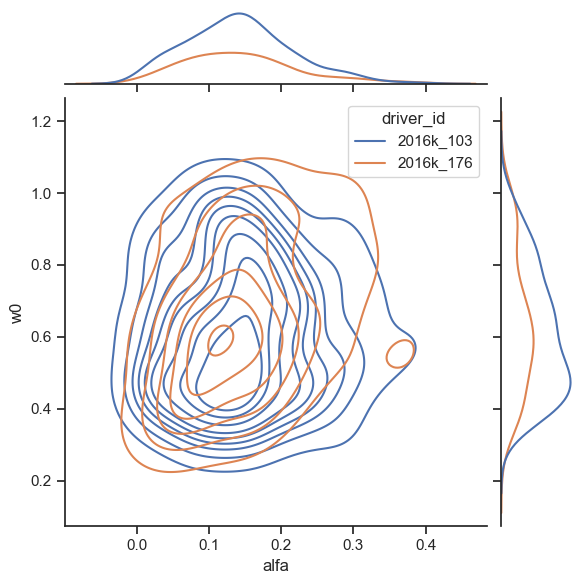

In [ ]:
sns.set_theme(style="ticks")

reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == "2016k_199") | (filtered_parameters_df.driver_id == "2016k_103") | (filtered_parameters_df.driver_id == "2016k_176")]

# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)

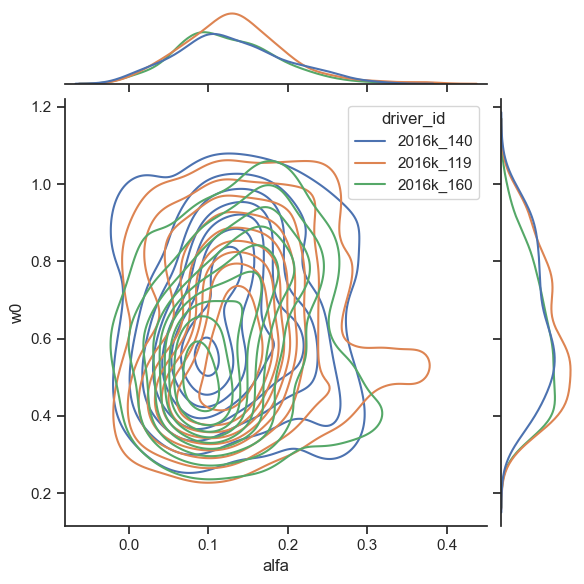

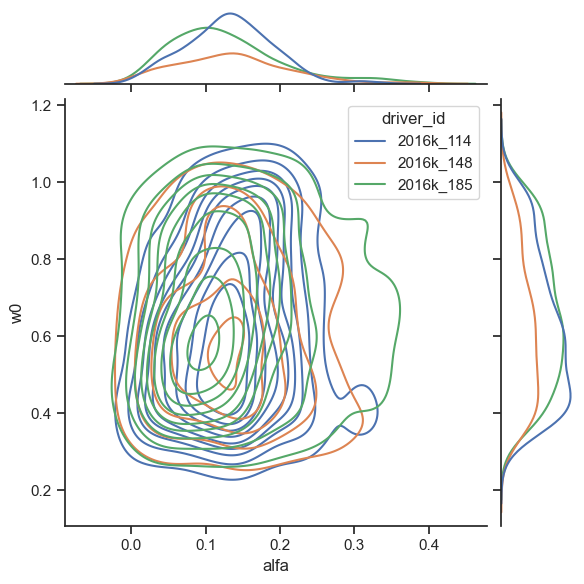

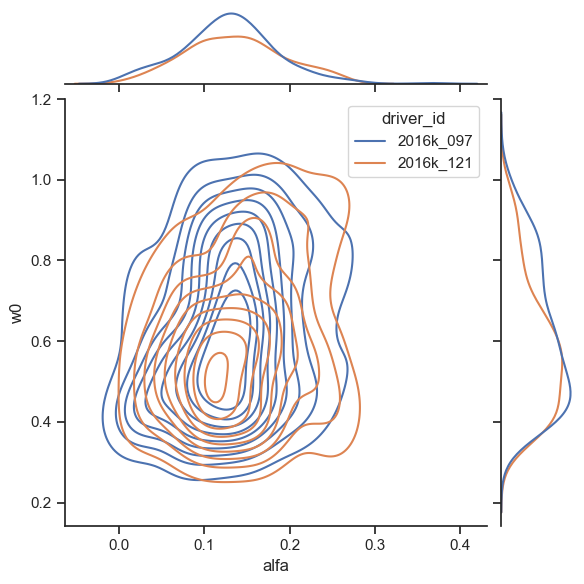

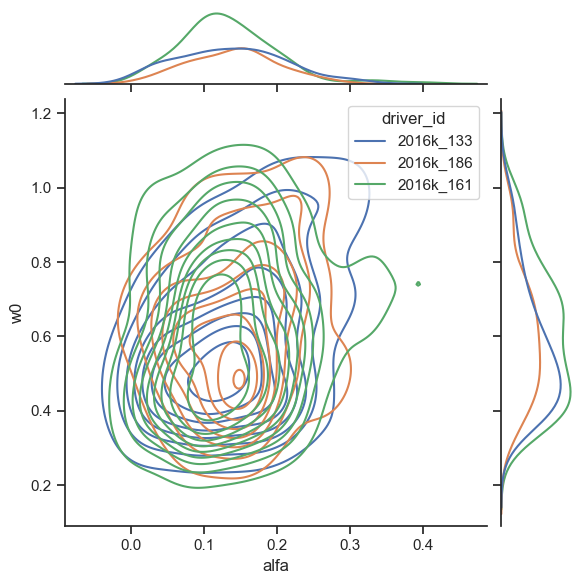

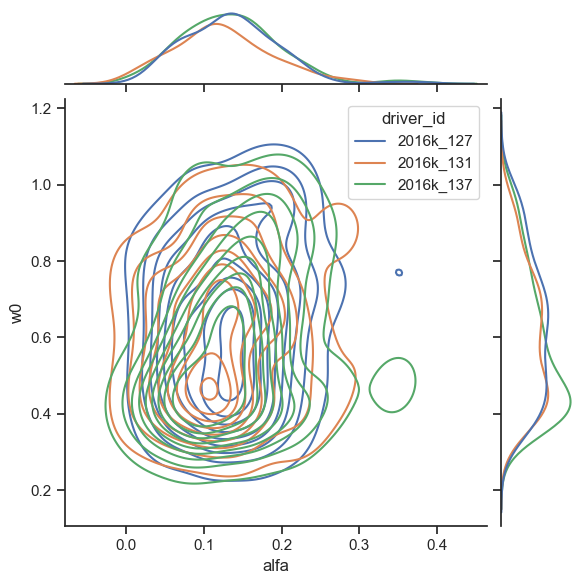

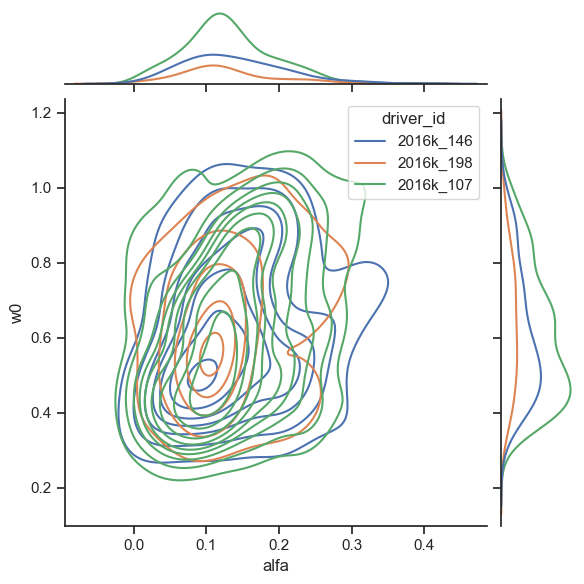

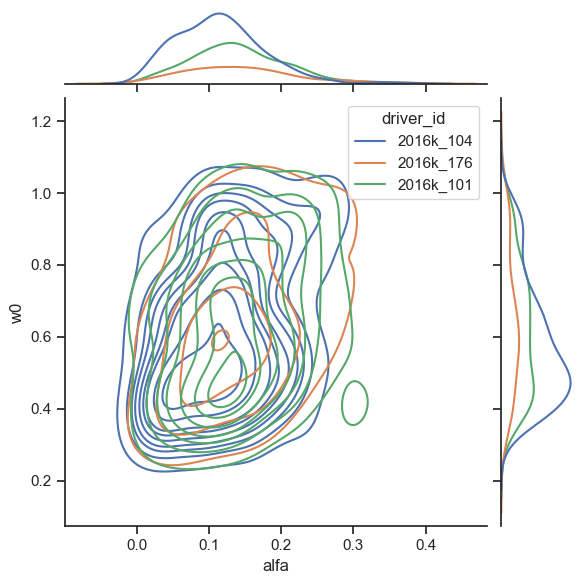

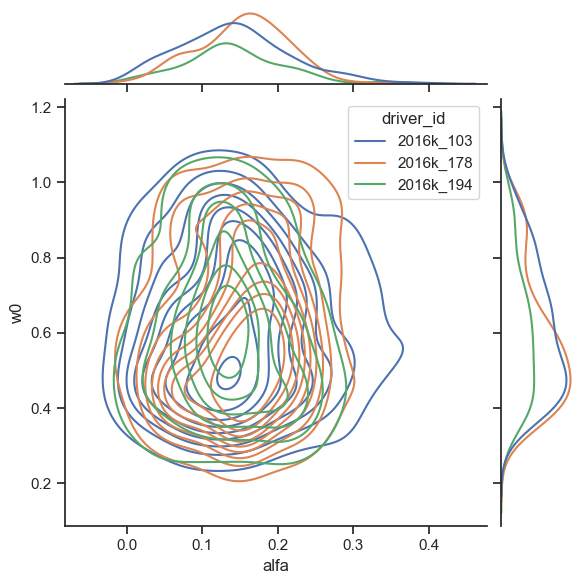

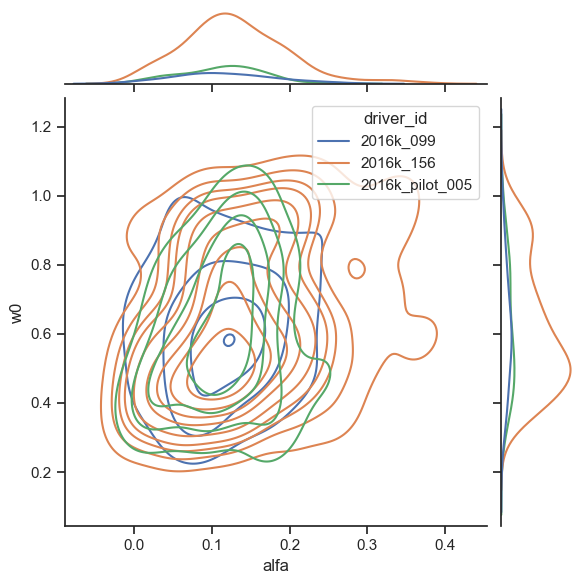

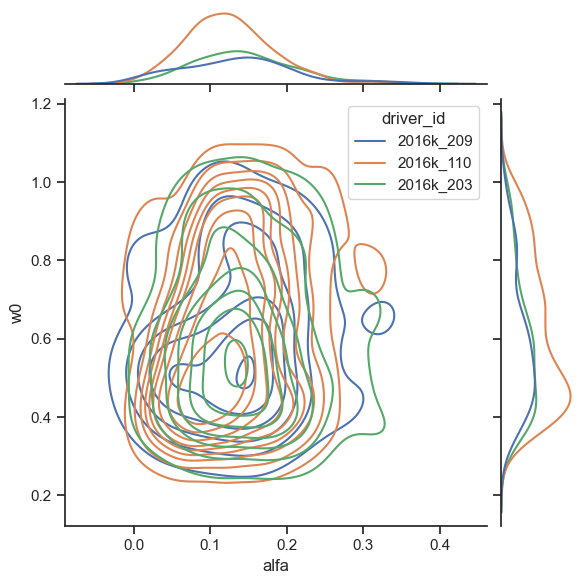

In [ ]:
sns.set_theme(style="ticks")

reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == unique_drivers[0]) | (filtered_parameters_df.driver_id == unique_drivers[1]) | (filtered_parameters_df.driver_id == unique_drivers[2])]
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)
reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == unique_drivers[3]) | (filtered_parameters_df.driver_id == unique_drivers[4]) | (filtered_parameters_df.driver_id == unique_drivers[5])]
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)
reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == unique_drivers[7]) | (filtered_parameters_df.driver_id == unique_drivers[8]) | (filtered_parameters_df.driver_id == unique_drivers[9])]
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)
reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == unique_drivers[10]) | (filtered_parameters_df.driver_id == unique_drivers[11]) | (filtered_parameters_df.driver_id == unique_drivers[12])]
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)
reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == unique_drivers[13]) | (filtered_parameters_df.driver_id == unique_drivers[14]) | (filtered_parameters_df.driver_id == unique_drivers[15])]
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)
reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == unique_drivers[16]) | (filtered_parameters_df.driver_id == unique_drivers[17]) | (filtered_parameters_df.driver_id == unique_drivers[18])]
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)
reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == unique_drivers[19]) | (filtered_parameters_df.driver_id == unique_drivers[20]) | (filtered_parameters_df.driver_id == unique_drivers[21])]
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)
reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == unique_drivers[22]) | (filtered_parameters_df.driver_id == unique_drivers[23]) | (filtered_parameters_df.driver_id == unique_drivers[24])]
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)
reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == unique_drivers[25]) | (filtered_parameters_df.driver_id == unique_drivers[26]) | (filtered_parameters_df.driver_id == unique_drivers[27])]
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)
reduced_filtered_parameters_df = filtered_parameters_df.loc[(filtered_parameters_df.driver_id == unique_drivers[28]) | (filtered_parameters_df.driver_id == unique_drivers[29]) | (filtered_parameters_df.driver_id == unique_drivers[30])]
# Show the joint distribution using kernel density estimation
g = sns.jointplot(
    data=reduced_filtered_parameters_df,
    x="alfa", y="w0", hue="driver_id",
    kind="kde",
)

## Multidimensional K-Means

In [22]:
cluster_array = np.array([filtered_parameters_df.D.values, filtered_parameters_df.w0.values,
    filtered_parameters_df.tc.values, filtered_parameters_df.alfa.values, filtered_parameters_df.t_delay.values]).T
cluster_array.shape

(19642, 5)

In [23]:
kmeans_model = KMeans(init="k-means++", n_clusters=3, random_state=6969669, n_init=10)
kmeans_predict = kmeans_model.fit_predict(cluster_array)
kmeans_model.cluster_centers_

array([[0.74107653, 0.69672161, 6.38186017, 0.10214509, 0.03549419],
       [0.77951101, 0.60452243, 0.46985699, 0.1803444 , 0.48672445],
       [0.76013318, 0.65574077, 3.181711  , 0.14866214, 0.4877722 ]])

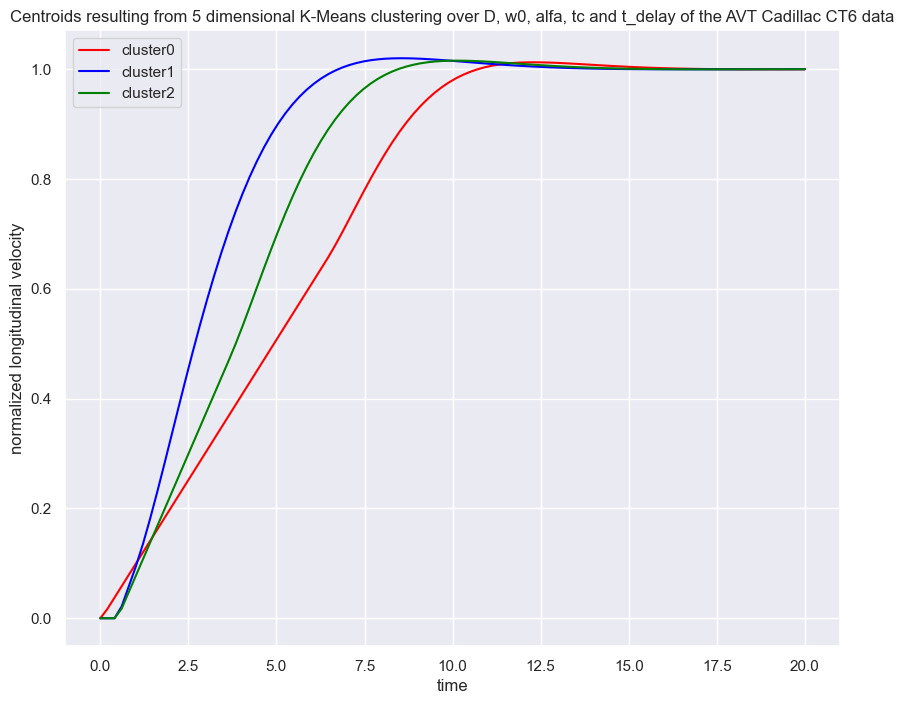

In [55]:
time = np.linspace(0,20,100)
y_center0 = []
y_center1 = []
y_center2 = []
for i, time_point in enumerate(list(time)):
    Y0 = get_ca_pt2_element(ca_pt2_parameters=kmeans_model.cluster_centers_[0], U=time_point)
    y_center0.append(Y0)
    Y1 = get_ca_pt2_element(ca_pt2_parameters=kmeans_model.cluster_centers_[1], U=time_point)
    y_center1.append(Y1)
    Y2 = get_ca_pt2_element(ca_pt2_parameters=kmeans_model.cluster_centers_[2], U=time_point)
    y_center2.append(Y2)
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [10, 8]
plt.title("Centroids resulting from 5 dimensional K-Means clustering over D, w0, alfa, tc and t_delay of the AVT Cadillac CT6 data")
plt.plot(time, y_center0, label="cluster0", color=color_list[0])
plt.plot(time, y_center1, label="cluster1", color=color_list[1])
plt.plot(time, y_center2, label="cluster2", color=color_list[2])
plt.xlabel("time")
plt.ylabel("normalized longitudinal velocity")
plt.legend()
plt.savefig(save_path + "K_Means0.png")
plt.show()

In [65]:
cluster_array.shape

(5, 19642)

D-w0

Cluster Centers D: [0.74107653 0.77951101 0.76013318]
Cluster Centers w0: [0.69672161 0.60452243 0.65574077]


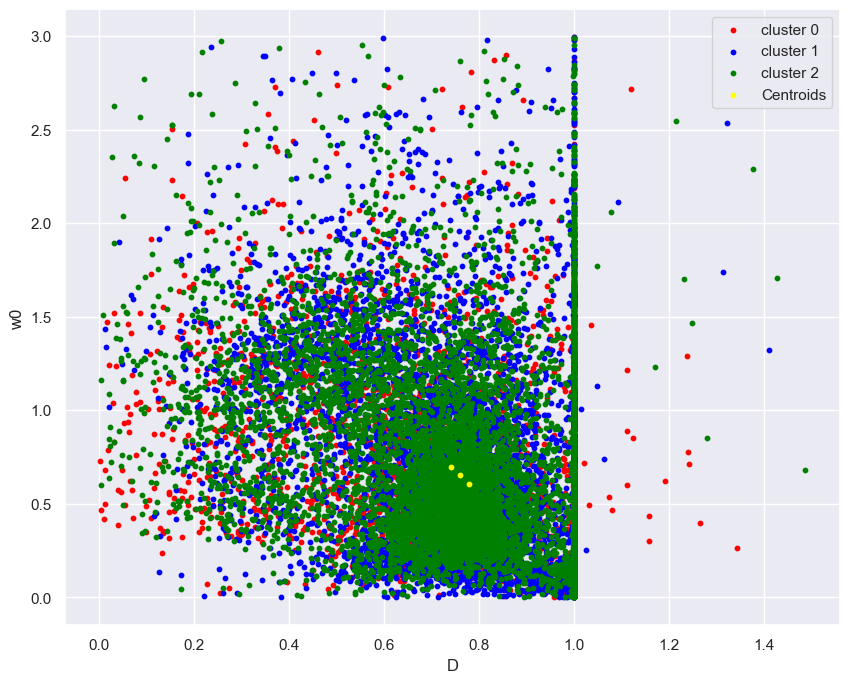

In [26]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(cluster_array[kmeans_predict == i, 0], cluster_array[kmeans_predict == i, 1], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(kmeans_model.cluster_centers_[:, 0], kmeans_model.cluster_centers_[:,1], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("D")
plt.ylabel("w0")
plt.legend()
plt.savefig(save_path+"KMeans_D_w0.png")
print("Cluster Centers D:", str(kmeans_model.cluster_centers_[:, 0]))
print("Cluster Centers w0:", str(kmeans_model.cluster_centers_[:, 1]))

alfa-tc

Cluster Centers alfa: [0.10214509 0.1803444  0.14866214]
Cluster Centers tc: [6.38186017 0.46985699 3.181711  ]


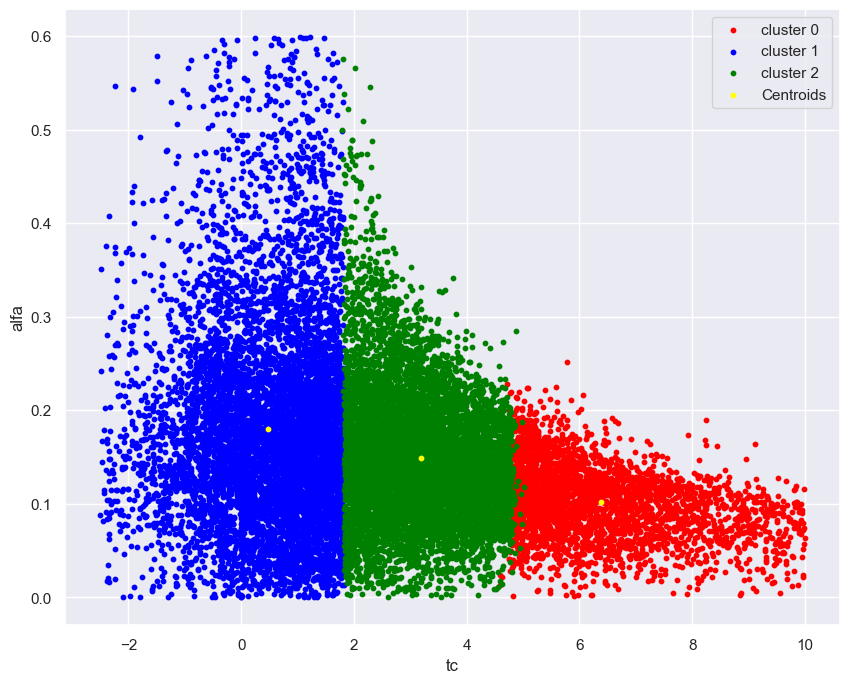

In [31]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(cluster_array[kmeans_predict == i, 2], cluster_array[kmeans_predict == i, 3], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(kmeans_model.cluster_centers_[:, 2], kmeans_model.cluster_centers_[:,3], s = 10, c = "yellow", label = "Centroids")

plt.ylabel("alfa")
plt.xlabel("tc")
plt.legend()
plt.savefig(save_path+"KMeans_tc_alfa.png")
print("Cluster Centers alfa:", str(kmeans_model.cluster_centers_[:, 3]))
print("Cluster Centers tc:", str(kmeans_model.cluster_centers_[:, 2]))

Cluster Centers D: [0.74107653 0.77951101 0.76013318]
Cluster Centers tc: [6.38186017 0.46985699 3.181711  ]


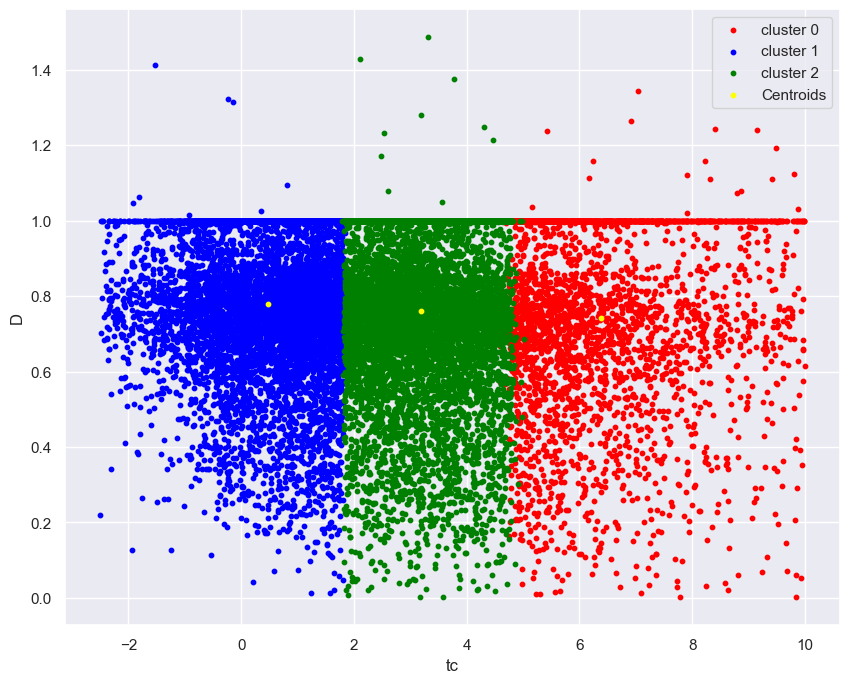

In [30]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(cluster_array[kmeans_predict == i, 2], cluster_array[kmeans_predict == i, 0], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(kmeans_model.cluster_centers_[:, 2], kmeans_model.cluster_centers_[:,0], s = 10, c = "yellow", label = "Centroids")

plt.ylabel("D")
plt.xlabel("tc")
plt.legend()
plt.savefig(save_path+"KMeans_tc_D.png")
print("Cluster Centers D:", str(kmeans_model.cluster_centers_[:, 0]))
print("Cluster Centers tc:", str(kmeans_model.cluster_centers_[:, 2]))

Cluster Centers tc: [6.38186017 0.46985699 3.181711  ]
Cluster Centers w0: [0.69672161 0.60452243 0.65574077]


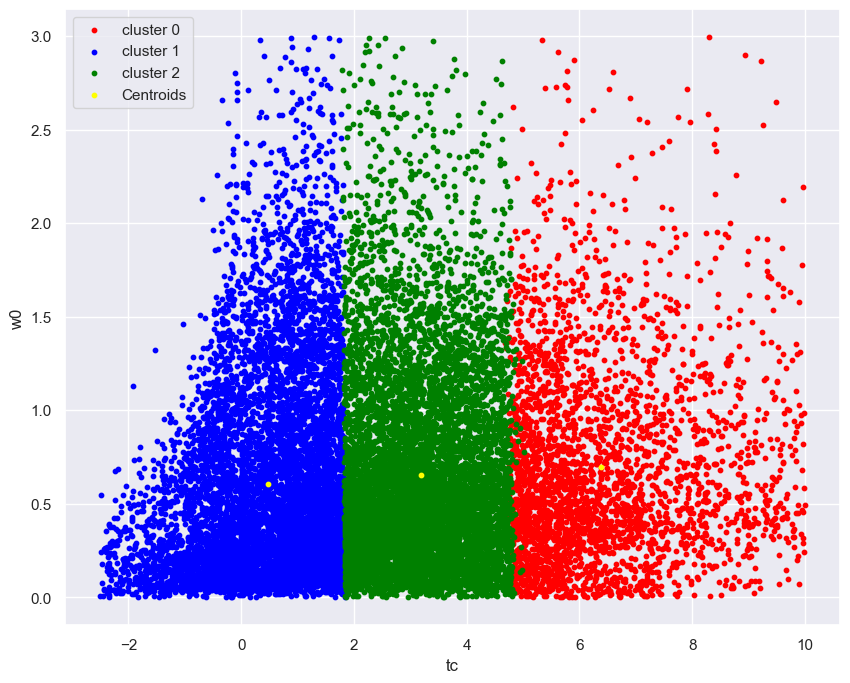

In [29]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(cluster_array[kmeans_predict == i, 2], cluster_array[kmeans_predict == i, 1], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(kmeans_model.cluster_centers_[:, 2], kmeans_model.cluster_centers_[:,1], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("tc")
plt.ylabel("w0")
plt.legend()
plt.savefig(save_path+"KMeans_tc_w0.png")
print("Cluster Centers tc:", str(kmeans_model.cluster_centers_[:, 2]))
print("Cluster Centers w0:", str(kmeans_model.cluster_centers_[:, 1]))

D-tc

Cluster Centers D: [0.74107653 0.77951101 0.76013318]
Cluster Centers alfa: [0.10214509 0.1803444  0.14866214]


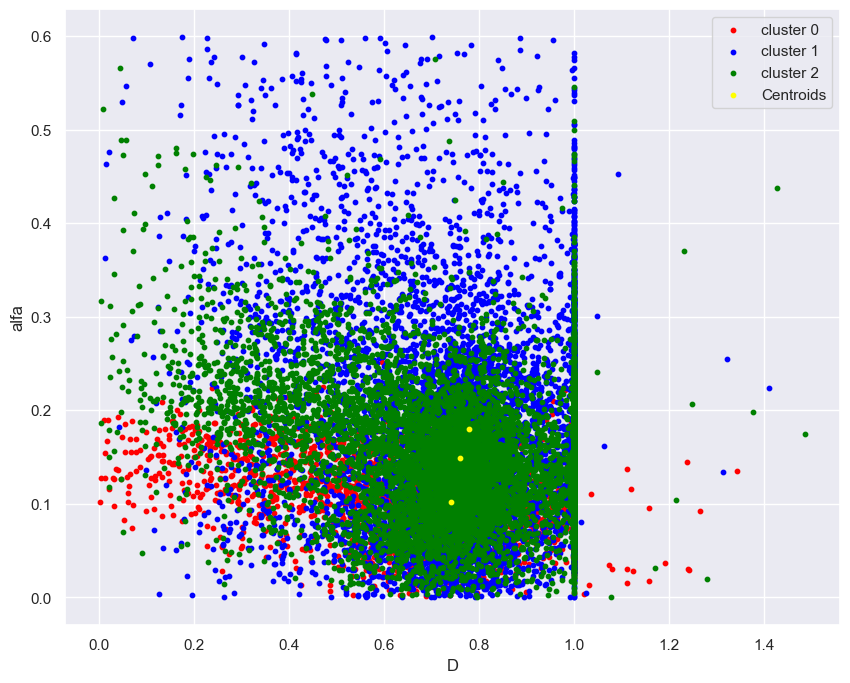

In [27]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(cluster_array[kmeans_predict == i, 0], cluster_array[kmeans_predict == i, 3], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(kmeans_model.cluster_centers_[:, 0], kmeans_model.cluster_centers_[:,3], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("D")
plt.ylabel("alfa")
plt.legend()
plt.savefig(save_path+"KMeans_D_alfa.png")
print("Cluster Centers D:", str(kmeans_model.cluster_centers_[:, 0]))
print("Cluster Centers alfa:", str(kmeans_model.cluster_centers_[:, 3]))

Cluster Centers w0: [0.69672161 0.60452243 0.65574077]
Cluster Centers alfa: [0.10214509 0.1803444  0.14866214]


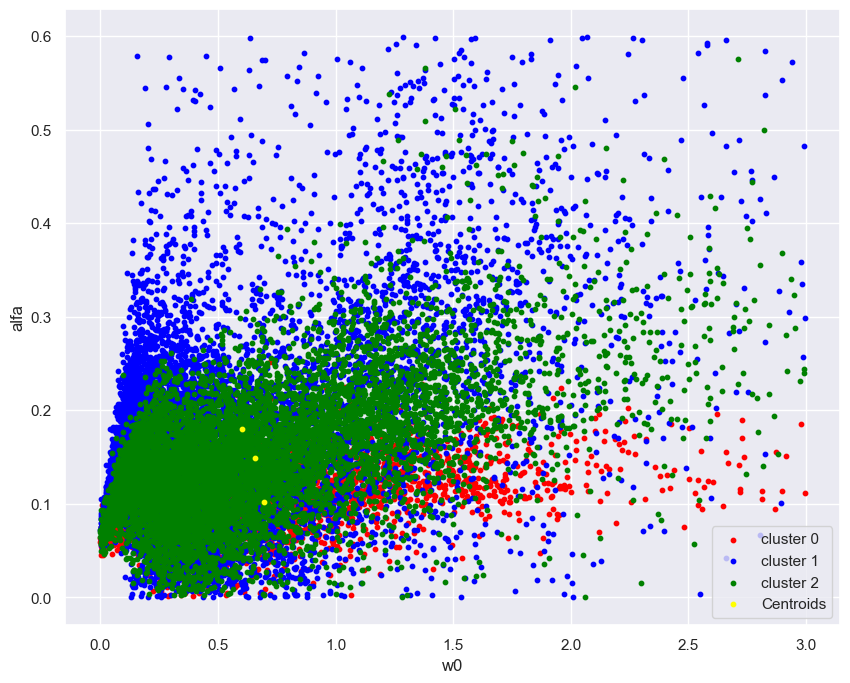

In [28]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(cluster_array[kmeans_predict == i, 1], cluster_array[kmeans_predict == i, 3], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(kmeans_model.cluster_centers_[:, 1], kmeans_model.cluster_centers_[:,3], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("w0")
plt.ylabel("alfa")
plt.legend()
plt.savefig(save_path+"KMeans_w0_alfa.png")
print("Cluster Centers w0:", str(kmeans_model.cluster_centers_[:, 1]))
print("Cluster Centers alfa:", str(kmeans_model.cluster_centers_[:, 3]))

Cluster Centers tc: [6.38186017 0.46985699 3.181711  ]
Cluster Centers t_dealy: [0.03549419 0.48672445 0.4877722 ]


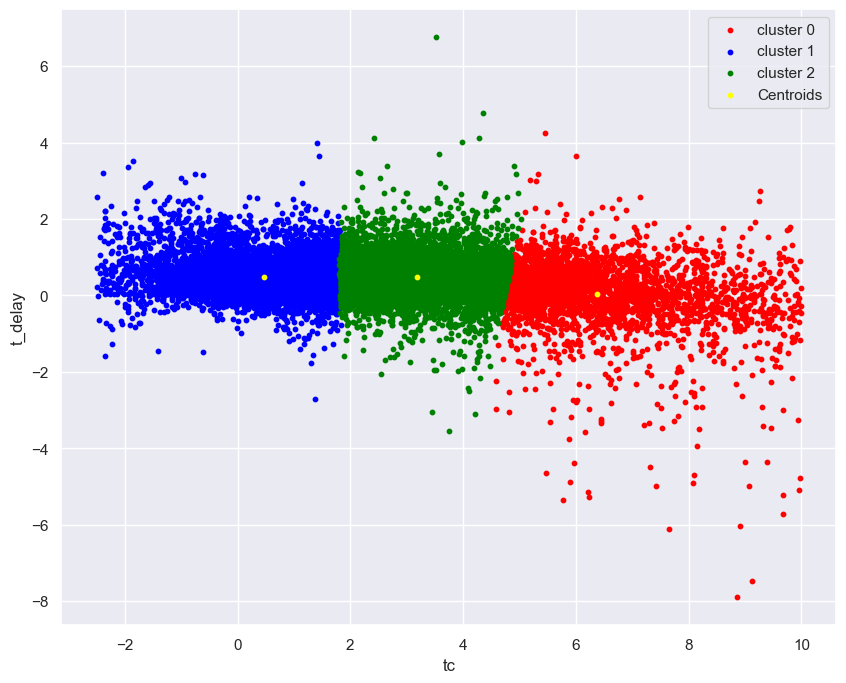

In [87]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(cluster_array[kmeans_predict == i, 2], cluster_array[kmeans_predict == i, 4], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(kmeans_model.cluster_centers_[:, 2], kmeans_model.cluster_centers_[:,4], s = 10, c = "yellow", label = "Centroids")

plt.ylabel("t_delay")
plt.xlabel("tc")
plt.legend()
print("Cluster Centers tc:", str(kmeans_model.cluster_centers_[:, 2]))
print("Cluster Centers t_dealy:", str(kmeans_model.cluster_centers_[:, 4]))

Cluster Centers alfa: [0.10214509 0.1803444  0.14866214]
Cluster Centers t_dealy: [0.03549419 0.48672445 0.4877722 ]


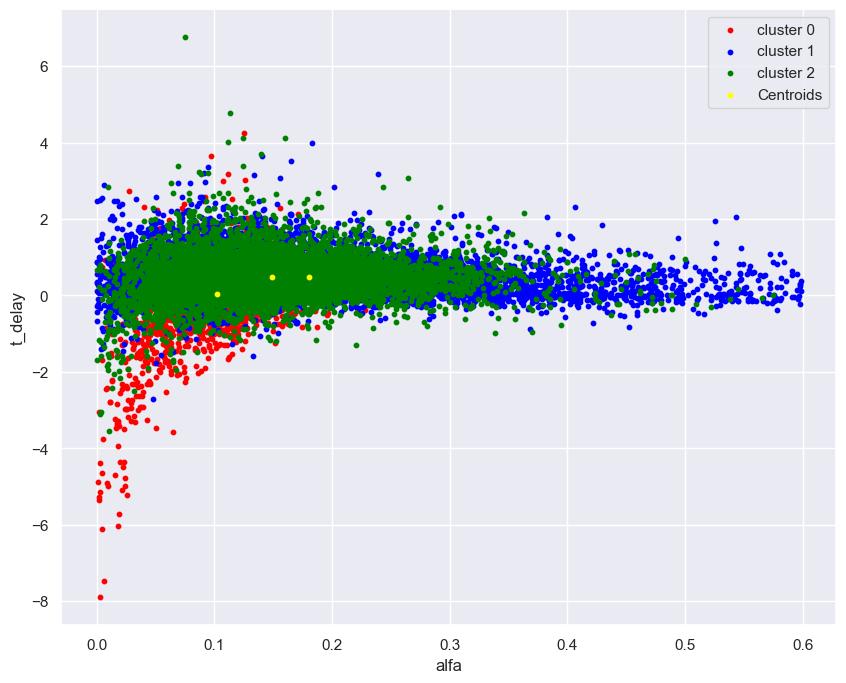

In [86]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(cluster_array[kmeans_predict == i, 3], cluster_array[kmeans_predict == i, 4], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(kmeans_model.cluster_centers_[:, 3], kmeans_model.cluster_centers_[:,4], s = 10, c = "yellow", label = "Centroids")

plt.ylabel("t_delay")
plt.xlabel("alfa")
plt.legend()
print("Cluster Centers alfa:", str(kmeans_model.cluster_centers_[:, 3]))
print("Cluster Centers t_dealy:", str(kmeans_model.cluster_centers_[:, 4]))

### subsets

In [208]:
low_to_low_cluster_array = np.array([low_to_low_df.D.values, low_to_low_df.w0.values,
    low_to_low_df.tc.values, low_to_low_df.alfa.values, low_to_low_df.t_delay.values]).T
low_to_low_cluster_array.shape

(6599, 5)

In [211]:
low_to_low_kmeans_model = KMeans(init="k-means++", n_clusters=3, random_state=6969669, n_init=10)
low_to_low_kmeans_predict = kmeans_model.fit_predict(low_to_low_cluster_array)

Cluster Centers alfa: [5.63599389 0.48017791 2.90248346]
Cluster Centers tc: [0.85305315 0.76551688 0.85226371]


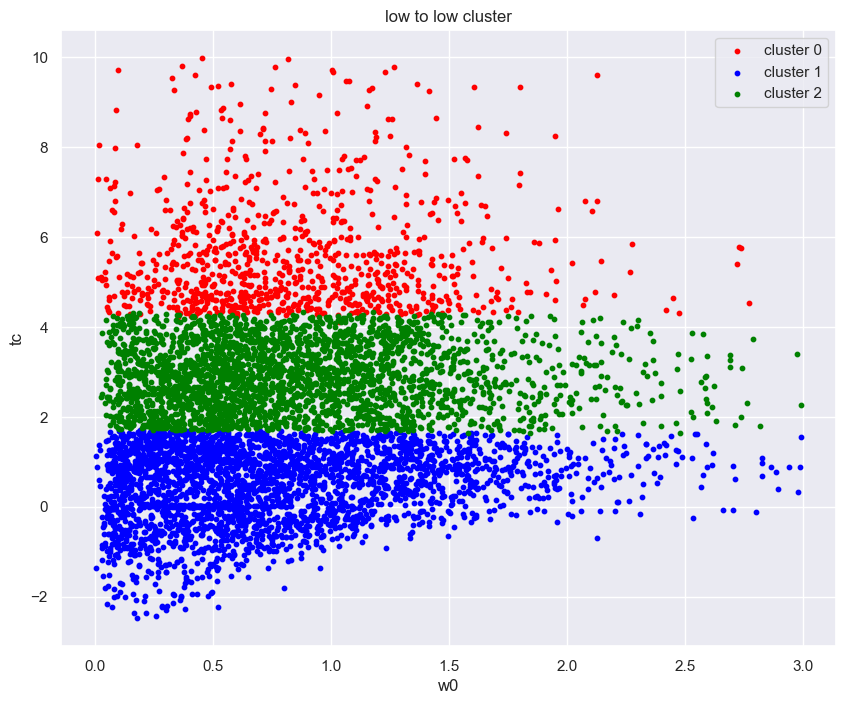

In [214]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(low_to_low_cluster_array[low_to_low_kmeans_predict == i, 1], low_to_low_cluster_array[low_to_low_kmeans_predict == i, 2], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
#plt.scatter(reduced_kmeans_model.cluster_centers_[:, 1], kmeans_model.cluster_centers_[:,2], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("w0")
plt.ylabel("tc")
plt.legend()
plt.title("low to low cluster")
print("Cluster Centers alfa:", str(kmeans_model.cluster_centers_[:, 2]))
print("Cluster Centers tc:", str(kmeans_model.cluster_centers_[:, 1]))
#plt.savefig(save_path+"reduced_scatter12.png")

### subset of subset

In [45]:
driver104 = low_to_low_df.loc[low_to_low_df.driver_id.values == "2016k_104"]

In [46]:
driver104_cluster_array = np.array([driver104.D.values, driver104.w0.values,
    driver104.tc.values, driver104.alfa.values, driver104.t_delay.values]).T
driver104_cluster_array.shape

(317, 5)

In [47]:
driver104_kmeans_model = KMeans(init="k-means++", n_clusters=3, random_state=6969669, n_init=10)
driver104_kmeans_predict = driver104_kmeans_model.fit_predict(driver104_cluster_array)

c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [48]:
driver104_kmeans_model.cluster_centers_

array([[0.67313108, 0.92337392, 3.44035248, 0.17144083, 0.55518975],
       [0.72978783, 0.70250756, 0.86246628, 0.14789501, 0.52660045],
       [0.65540352, 0.84459582, 6.46987585, 0.1129846 , 0.12751155]])

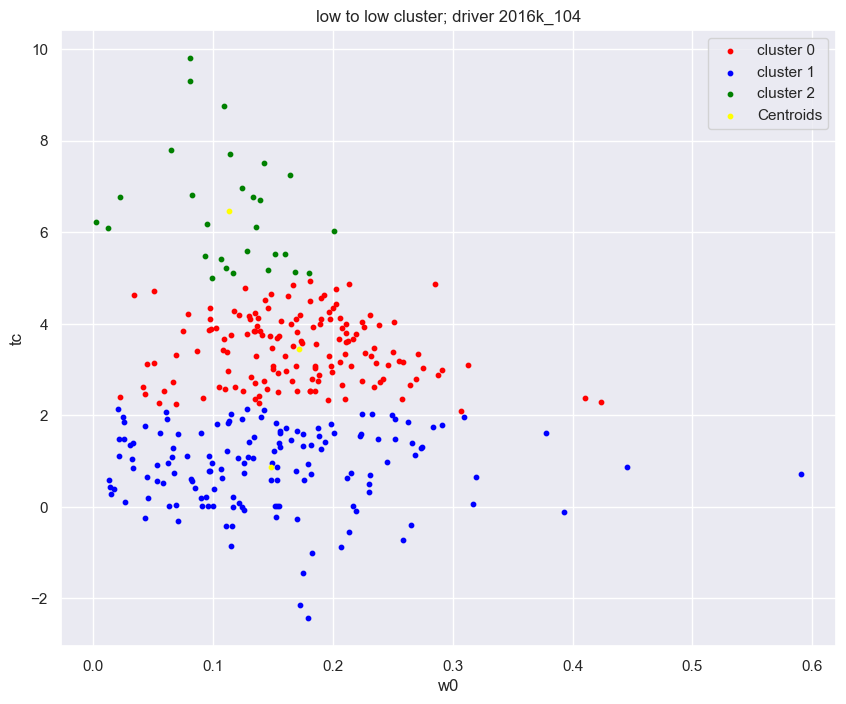

In [49]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(driver104_cluster_array[driver104_kmeans_predict == i, 3], driver104_cluster_array[driver104_kmeans_predict == i, 2], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(driver104_kmeans_model.cluster_centers_[:, 3], driver104_kmeans_model.cluster_centers_[:,2], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("w0")
plt.ylabel("tc")
plt.legend()
plt.title("low to low cluster; driver 2016k_104")
plt.savefig(save_path+"driver_2016k_104__low_to_low_speedup__KMeans_tc_alfa.png")

In [12]:
def get_y_ca_pt2(ca_pt2_parameters):
    time = np.linspace(0,20,100)
    y_ca_pt2 = []
    for i, time_point in enumerate(list(time)):
        Y = get_ca_pt2_element(ca_pt2_parameters=ca_pt2_parameters, U=time_point)
        y_ca_pt2.append(Y)
    return np.array(y_ca_pt2)

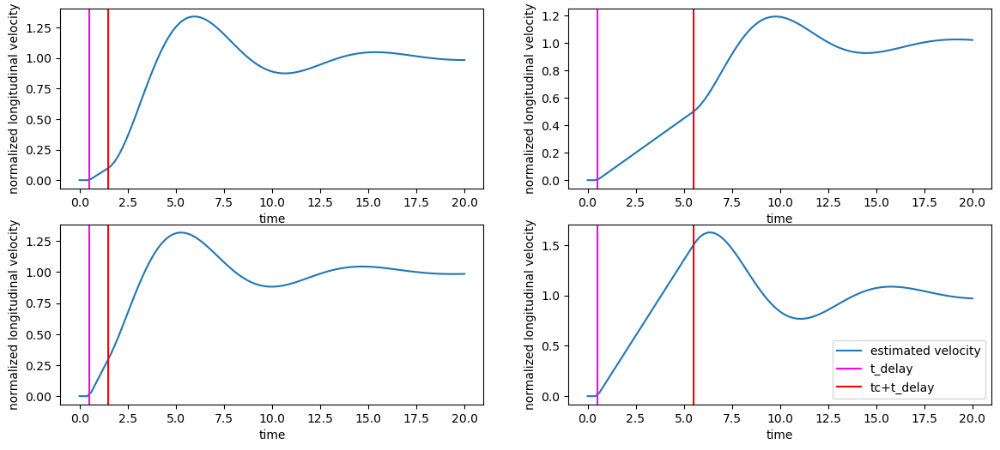

In [51]:
plt.rcParams['figure.figsize'] = [14, 6]
time = np.linspace(0,20,100)
t_delay = 0.5
tc = 5.0
plt.subplot(2,2,1)
tc = 1.0
y = get_y_ca_pt2([0.3, 0.7, tc, 0.1, t_delay])
plt.plot(time, y, label="estimated velocity")
plt.axvline(x=t_delay, color='magenta', label='t_delay')
plt.axvline(x=tc+t_delay, color='red', label='tc+t_delay')
plt.xlabel("time")
plt.ylabel("normalized longitudinal velocity")

plt.subplot(2,2,2)
tc = 5.0
y = get_y_ca_pt2([0.3, 0.7, tc, 0.1, t_delay])
plt.plot(time, y, label="estimated velocity")
plt.axvline(x=t_delay, color='magenta', label='t_delay')
plt.axvline(x=tc+t_delay, color='red', label='tc+t_delay')
plt.xlabel("time")
plt.ylabel("normalized longitudinal velocity")
plt.subplot(2,2,3)
tc = 1.0
y = get_y_ca_pt2([0.3, 0.7, tc, 0.3, t_delay])
plt.plot(time, y, label="estimated velocity")
plt.axvline(x=t_delay, color='magenta', label='t_delay')
plt.axvline(x=tc+t_delay, color='red', label='tc+t_delay')
plt.xlabel("time")
plt.ylabel("normalized longitudinal velocity")
plt.subplot(2,2,4)
tc = 5.0
y = get_y_ca_pt2([0.3, 0.7, tc, 0.3, t_delay])
plt.plot(time, y, label="estimated velocity")
plt.axvline(x=t_delay, color='magenta', label='t_delay')
plt.axvline(x=tc+t_delay, color='red', label='tc+t_delay')
plt.xlabel("time")
plt.ylabel("normalized longitudinal velocity")
plt.legend()
plt.savefig("CA_PT2_example_alfa.png")

plt.show()

Text(0, 0.5, 'normalized longitudinal velocity')

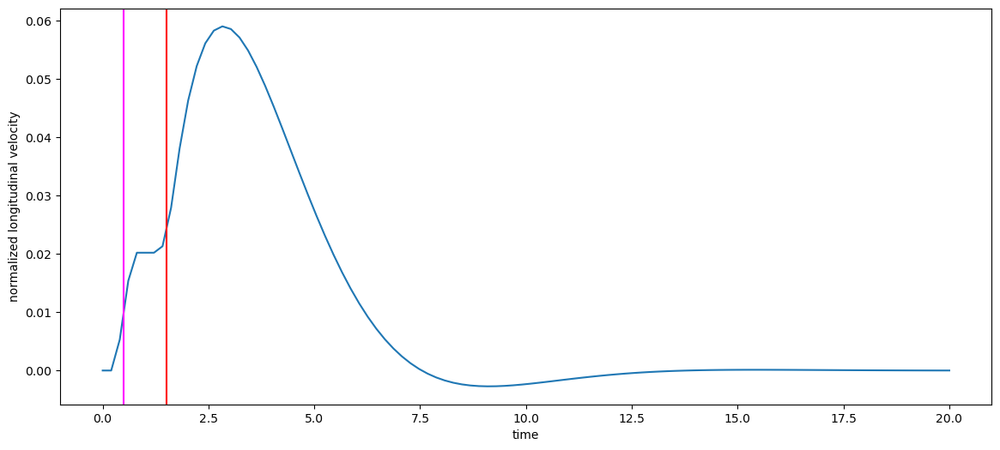

In [49]:
plt.subplot(2,2,1)
tc = 1.0
y = get_y_ca_pt2([0.3, 0.7, tc, 0.1, t_delay])
plt.plot(time, y, label="estimated velocity")
plt.axvline(x=t_delay, color='magenta', label='t_delay')
plt.axvline(x=tc+t_delay, color='red', label='tc+t_delay')
plt.xlabel("time")
plt.ylabel("normalized longitudinal velocity")
tc = 1.0
y = get_y_ca_pt2([0.7, 0.7, tc, 0.1, t_delay])
a = np.gradient(y)
#plt.plot(time, y, label="estimated velocity")
plt.plot(time, a, label="estimated acceleration")
plt.axvline(x=t_delay, color='magenta', label='t_delay')
plt.axvline(x=tc+t_delay, color='red', label='tc+t_delay')
plt.xlabel("time")
plt.ylabel("derivative of normalized longitudinal velocity (acceleration)")

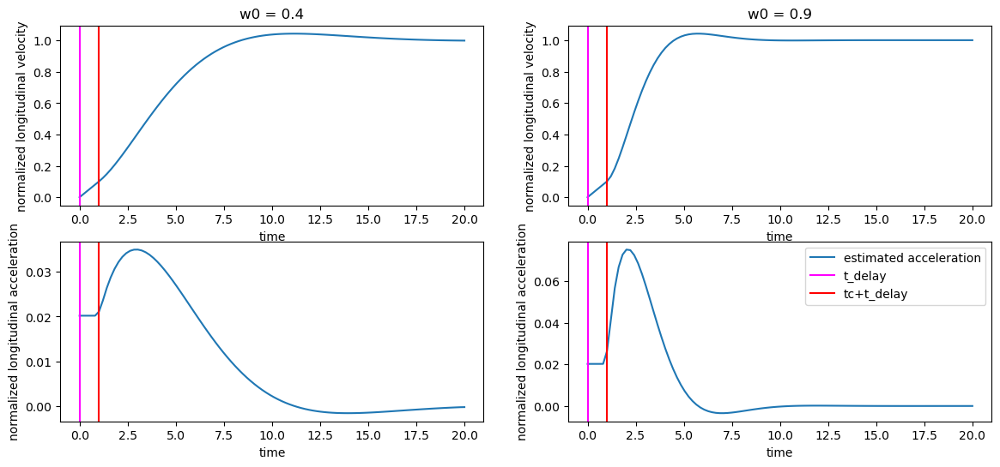

In [57]:
plt.rcParams['figure.figsize'] = [14, 6]
time = np.linspace(0,20,100)
t_delay = 0.0
plt.subplot(2,2,1)
tc = 1.0
y = get_y_ca_pt2([0.7, 0.4, tc, 0.1, t_delay])
plt.plot(time, y, label="estimated velocity")
plt.axvline(x=t_delay, color='magenta', label='t_delay')
plt.axvline(x=tc+t_delay, color='red', label='tc+t_delay')
plt.xlabel("time")
plt.ylabel("normalized longitudinal velocity")
plt.title("w0 = 0.4")
plt.subplot(2,2,2)
tc = 1.0
y = get_y_ca_pt2([0.7, 0.9, tc, 0.1, t_delay])
plt.plot(time, y, label="estimated velocity")
plt.axvline(x=t_delay, color='magenta', label='t_delay')
plt.axvline(x=tc+t_delay, color='red', label='tc+t_delay')
plt.xlabel("time")
plt.ylabel("normalized longitudinal velocity")
plt.title("w0 = 0.9")
plt.subplot(2,2,3)
tc = 1.0
y = get_y_ca_pt2([0.7, 0.4, tc, 0.1, t_delay])
a = np.gradient(y)
plt.plot(time, a, label="estimated acceleration")
plt.axvline(x=t_delay, color='magenta', label='t_delay')
plt.axvline(x=tc+t_delay, color='red', label='tc+t_delay')
plt.xlabel("time")
plt.ylabel("normalized longitudinal acceleration")
plt.subplot(2,2,4)
tc = 1.0
y = get_y_ca_pt2([0.7, 0.9, tc, 0.1, t_delay])
a = np.gradient(y)
plt.plot(time, a, label="estimated acceleration")
plt.axvline(x=t_delay, color='magenta', label='t_delay')
plt.axvline(x=tc+t_delay, color='red', label='tc+t_delay')
plt.xlabel("time")
plt.ylabel("normalized longitudinal acceleration")
plt.legend()
plt.savefig("CA_PT2_example_w0.png")

In [292]:
def plot_centroid_swarm(save_path, kmeans_model, kmeans_predict, cluster_array, cluster_index, color):
    time = np.linspace(0,20,100)
    y_centroid = get_y_ca_pt2(kmeans_model.cluster_centers_[cluster_index])
    print(time.shape)
    print(y_centroid.shape)
    plt.plot(time, y_centroid, color=color)
    n_examples = min(30, cluster_array[kmeans_predict == cluster_index].shape[0]-1)
    for i in range(n_examples):
        example_params = cluster_array[kmeans_predict == cluster_index][i]
        y_example = get_y_ca_pt2(example_params)
        plt.plot(time, y_example, alpha=0.1, color=color)
    plt.title("driver 2016k_104 doing low to low speedups: centroid {k} and clustered speedups".format(k=cluster_index))
    plt.xlabel("time")
    plt.ylabel("normalized longitudinal velocity")
    plt.savefig(save_path+"Cluster_center_{k}_and_clustered_speedups.png".format(k=cluster_index))
    plt.show()

(100,)
(100,)


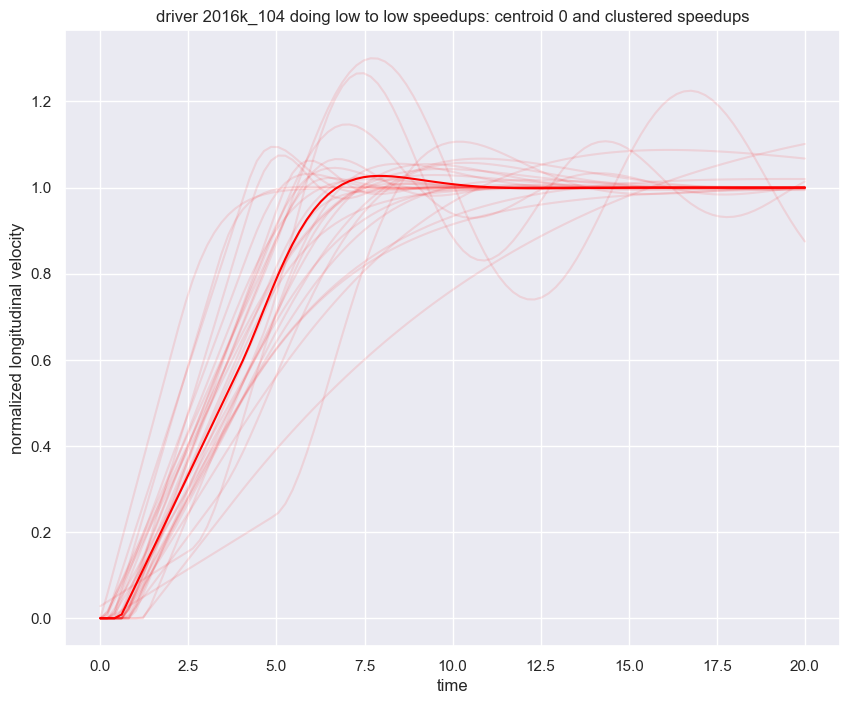

In [293]:
plot_centroid_swarm(save_path, driver104_kmeans_model, driver104_kmeans_predict, driver104_cluster_array, 0, color_list[0])

(100,)
(100,)


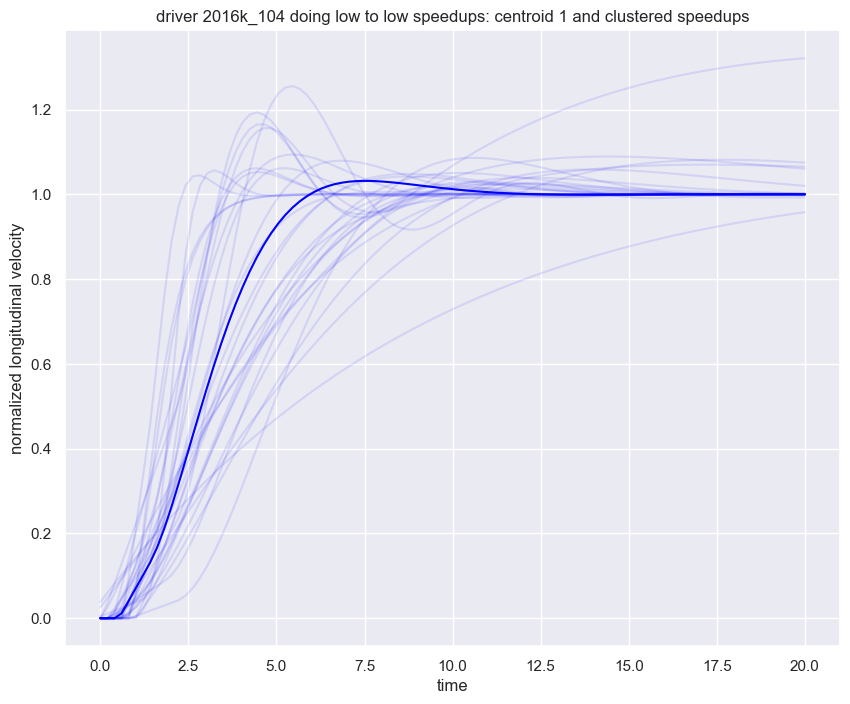

In [294]:
plot_centroid_swarm(save_path, driver104_kmeans_model, driver104_kmeans_predict, driver104_cluster_array, 1, color_list[1])

(100,)
(100,)


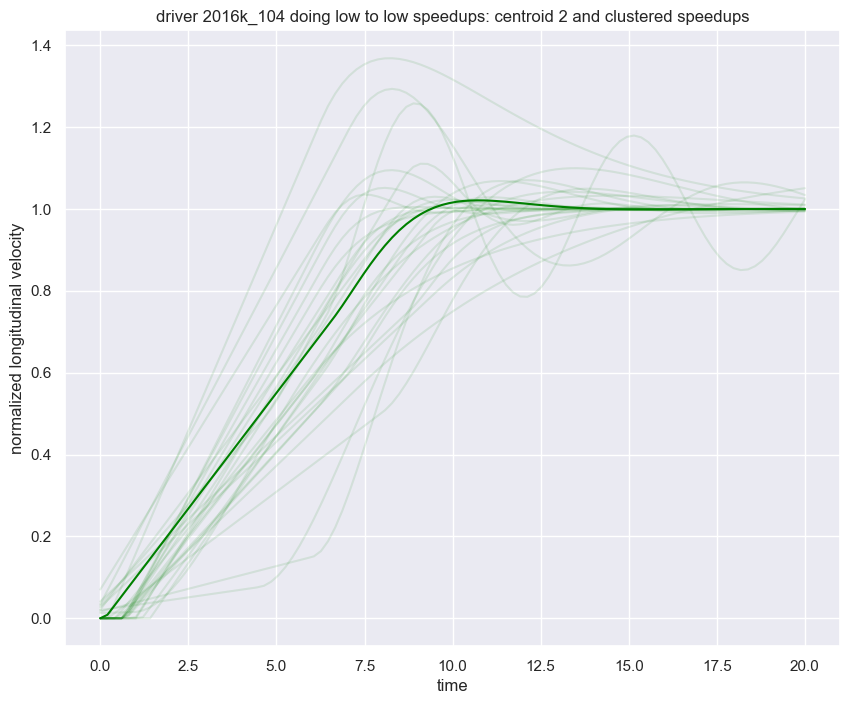

In [295]:
plot_centroid_swarm(save_path, driver104_kmeans_model, driver104_kmeans_predict, driver104_cluster_array, 2, color_list[2])

In [ ]:
sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [10, 8]

plt.title("Centroids resulting from 5 dimensional K-Means clustering over D, w0, alfa, tc and t_delay of the AVT Cadillac CT6 data")
plt.plot(time, y_center0, label="cluster0")
plt.plot(time, y_center1, label="cluster1")
plt.plot(time, y_center2, label="cluster2")
plt.xlabel("time")
plt.ylabel("normalized longitudinal velocity")
plt.legend()
plt.savefig(save_path + "K_Means0.png")

#### 123

In [38]:
driver123 = low_to_low_df.loc[low_to_low_df.driver_id.values == "2016k_123"]

driver123_cluster_array = np.array([driver123.D.values, driver123.w0.values,
    driver123.tc.values, driver123.alfa.values, driver123.t_delay.values]).T

driver123_kmeans_model = KMeans(init="k-means++", n_clusters=3, random_state=6969669, n_init=10)
driver123_kmeans_predict = driver123_kmeans_model.fit_predict(driver123_cluster_array)

sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [10, 8]
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(driver123_cluster_array[driver123_kmeans_predict == i, 3], driver123_cluster_array[driver123_kmeans_predict == i, 2], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(driver123_kmeans_model.cluster_centers_[:, 3], driver123_kmeans_model.cluster_centers_[:,2], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("w0")
plt.ylabel("tc")
plt.legend()
plt.title("low to low cluster; driver 2016k_123")
plt.savefig(save_path+"driver_2016k_123__low_to_low_speedup__KMeans_tc_alfa.png")

#### 209

c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


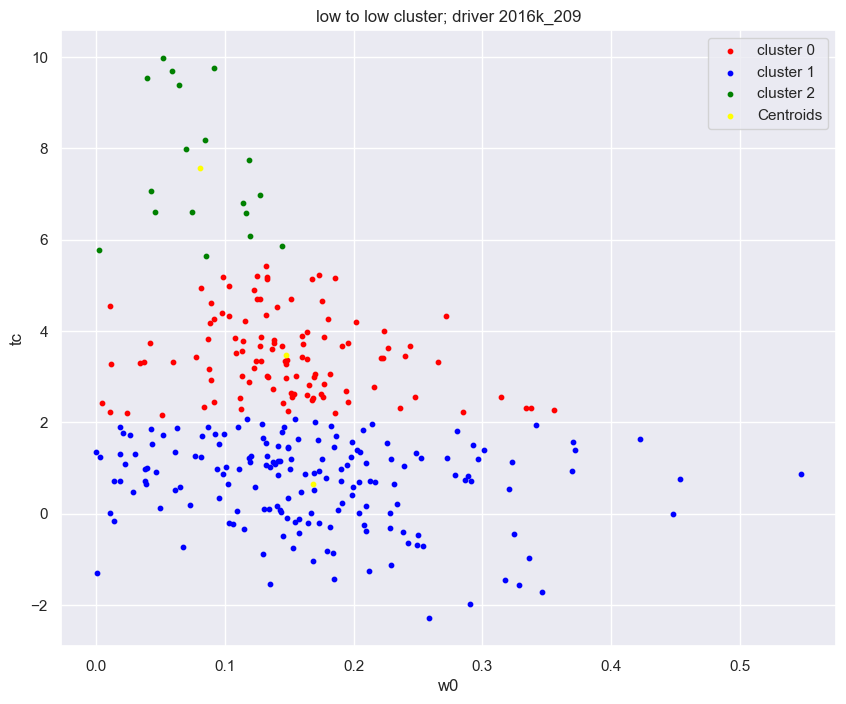

In [43]:
driver209 = low_to_low_df.loc[low_to_low_df.driver_id.values == "2016k_209"]

driver209_cluster_array = np.array([driver209.D.values, driver209.w0.values,
    driver209.tc.values, driver209.alfa.values, driver209.t_delay.values]).T

driver209_kmeans_model = KMeans(init="k-means++", n_clusters=3, random_state=6969669, n_init=10)
driver209_kmeans_predict = driver209_kmeans_model.fit_predict(driver209_cluster_array)

sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [10, 8]
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(driver209_cluster_array[driver209_kmeans_predict == i, 3], driver209_cluster_array[driver209_kmeans_predict == i, 2], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(driver209_kmeans_model.cluster_centers_[:, 3], driver209_kmeans_model.cluster_centers_[:,2], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("w0")
plt.ylabel("tc")
plt.legend()
plt.title("low to low cluster; driver 2016k_209")
plt.savefig(save_path+"driver_2016k_209__low_to_low_speedup__KMeans_tc_alfa.png")

### Reduced clusters

In [201]:
reduced_cluster_array = np.array([filtered_parameters_df.D.values,filtered_parameters_df.w0.values,
    filtered_parameters_df.alfa.values]).T
reduced_cluster_array.shape

(19642, 3)

In [234]:
reduced_kmeans_model = KMeans(init="k-means++", n_clusters=3, random_state=6969669, n_init=10)
reduced_kmeans_predict = reduced_kmeans_model.fit_predict(reduced_cluster_array)

In [237]:
driver104_kmeans_model.cluster_centers_[0]

array([0.67313108, 0.92337392, 3.44035248, 0.17144083, 0.55518975])

In [245]:
driver104_cluster_array[driver104_kmeans_predict == i][0]

array([0.78146029, 1.42538318, 5.51814787, 0.15117987, 0.64474804])

Cluster Centers alfa: [3.44035248 0.86246628 6.46987585]
Cluster Centers tc: [0.92337392 0.70250756 0.84459582]


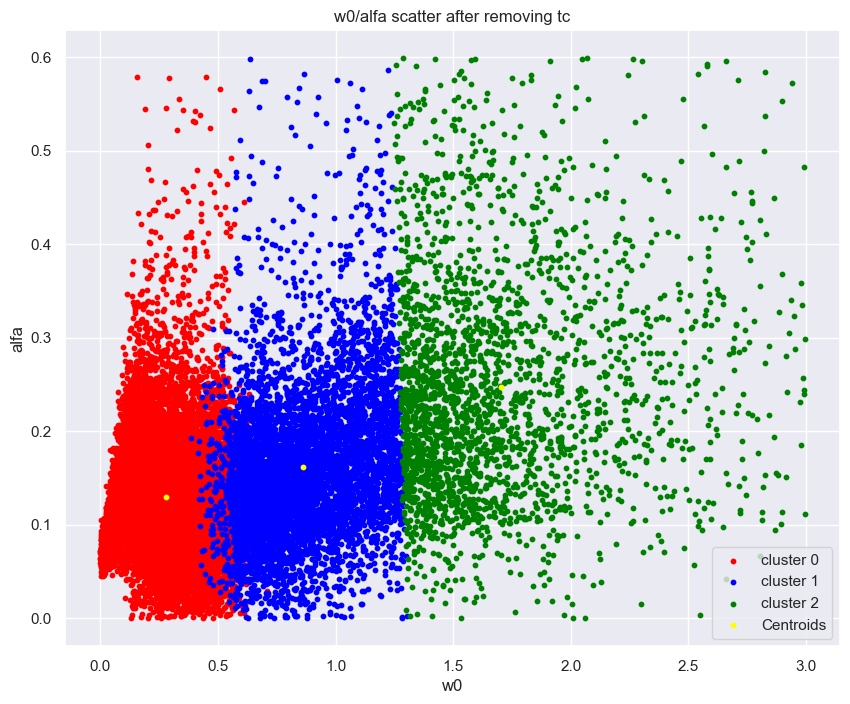

In [235]:
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(reduced_cluster_array[reduced_kmeans_predict == i, 1], reduced_cluster_array[reduced_kmeans_predict == i, 2], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(reduced_kmeans_model.cluster_centers_[:, 1], reduced_kmeans_model.cluster_centers_[:,2], s = 100, c = "yellow", label = "Centroids")

plt.xlabel("w0")
plt.ylabel("alfa")
plt.legend()
plt.title("w0/alfa scatter after removing tc")
print("Cluster Centers alfa:", str(kmeans_model.cluster_centers_[:, 2]))
print("Cluster Centers tc:", str(kmeans_model.cluster_centers_[:, 1]))
plt.savefig(save_path+"reduced_scatter12.png")

#### low to mid

In [50]:
low_to_mid_df = filtered_parameters_df.loc[filtered_parameters_df.velocity_class == "low_to_mid_speed_up"]

c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


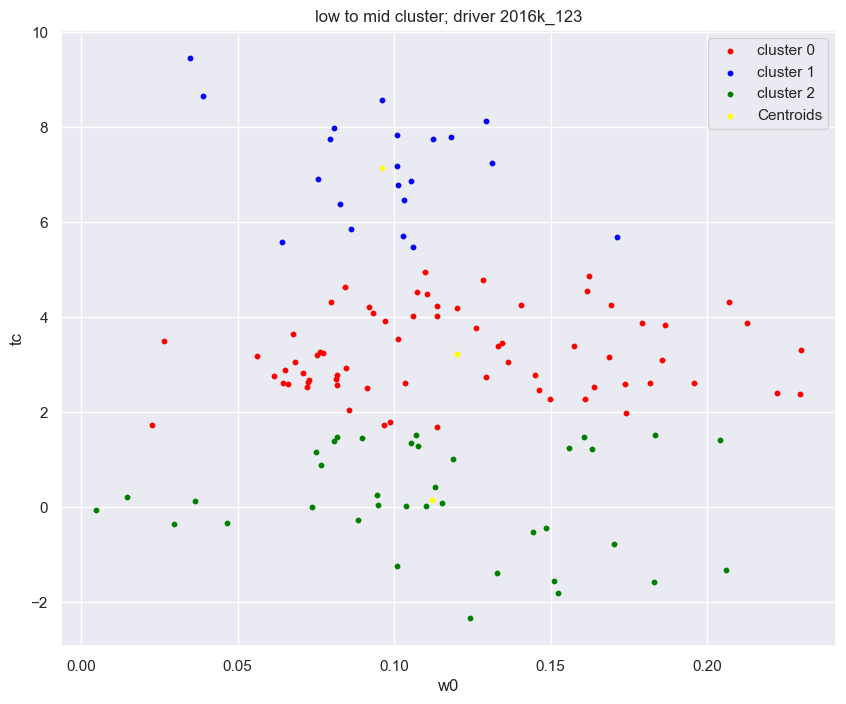

In [51]:
driver123 = low_to_mid_df.loc[low_to_mid_df.driver_id.values == "2016k_123"]

driver123_cluster_array = np.array([driver123.D.values, driver123.w0.values,
    driver123.tc.values, driver123.alfa.values, driver123.t_delay.values]).T

driver123_kmeans_model = KMeans(init="k-means++", n_clusters=3, random_state=6969669, n_init=10)
driver123_kmeans_predict = driver123_kmeans_model.fit_predict(driver123_cluster_array)

sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [10, 8]
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(driver123_cluster_array[driver123_kmeans_predict == i, 3], driver123_cluster_array[driver123_kmeans_predict == i, 2], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(driver123_kmeans_model.cluster_centers_[:, 3], driver123_kmeans_model.cluster_centers_[:,2], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("w0")
plt.ylabel("tc")
plt.legend()
plt.title("low to mid cluster; driver 2016k_123")
plt.savefig(save_path+"driver_2016k_123__low_to_mid_speedup__KMeans_tc_alfa.png")

c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


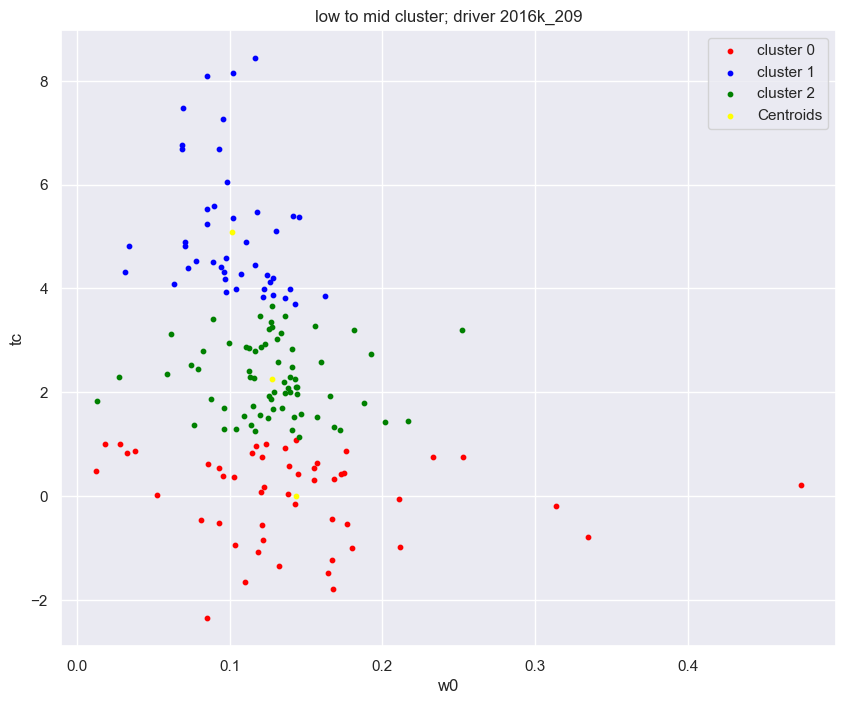

In [52]:
driver209 = low_to_mid_df.loc[low_to_mid_df.driver_id.values == "2016k_209"]

driver209_cluster_array = np.array([driver209.D.values, driver209.w0.values,
    driver209.tc.values, driver209.alfa.values, driver209.t_delay.values]).T

driver209_kmeans_model = KMeans(init="k-means++", n_clusters=3, random_state=6969669, n_init=10)
driver209_kmeans_predict = driver209_kmeans_model.fit_predict(driver209_cluster_array)

sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [10, 8]
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(driver209_cluster_array[driver209_kmeans_predict == i, 3], driver209_cluster_array[driver209_kmeans_predict == i, 2], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(driver209_kmeans_model.cluster_centers_[:, 3], driver209_kmeans_model.cluster_centers_[:,2], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("w0")
plt.ylabel("tc")
plt.legend()
plt.title("low to mid cluster; driver 2016k_209")
plt.savefig(save_path+"driver_2016k_209__low_to_mid_speedup__KMeans_tc_alfa.png")

c:\Users\scs3yh\.conda\envs\geoenv\lib\site-packages\sklearn\cluster\_kmeans.py:1382: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


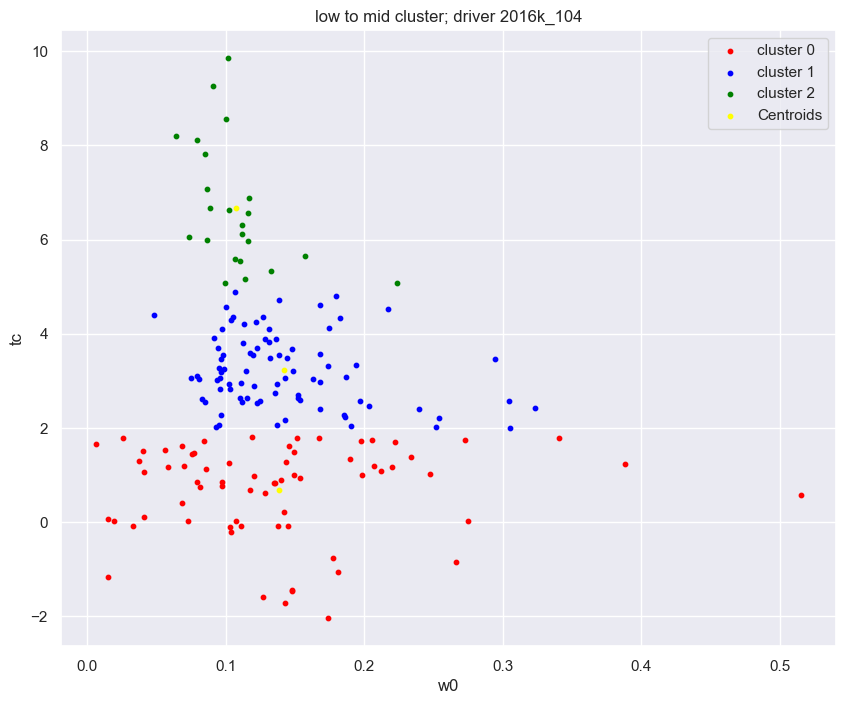

In [54]:
driver104 = low_to_mid_df.loc[low_to_mid_df.driver_id.values == "2016k_104"]

driver104_cluster_array = np.array([driver104.D.values, driver104.w0.values,
    driver104.tc.values, driver104.alfa.values, driver104.t_delay.values]).T

driver104_kmeans_model = KMeans(init="k-means++", n_clusters=3, random_state=6969669, n_init=10)
driver104_kmeans_predict = driver104_kmeans_model.fit_predict(driver104_cluster_array)

sns.set_theme(style="darkgrid")
plt.rcParams['figure.figsize'] = [10, 8]
color_list = ['red', 'blue', 'green', 'orange', 'purple'] 
for i in range(3):
    plt.scatter(driver104_cluster_array[driver104_kmeans_predict == i, 3], driver104_cluster_array[driver104_kmeans_predict == i, 2], s = 10, c=color_list[i], label = "cluster {index}".format(index = i))
# Plotting the centroids of the clusters
plt.scatter(driver104_kmeans_model.cluster_centers_[:, 3], driver104_kmeans_model.cluster_centers_[:,2], s = 10, c = "yellow", label = "Centroids")

plt.xlabel("w0")
plt.ylabel("tc")
plt.legend()
plt.title("low to mid cluster; driver 2016k_104")
plt.savefig(save_path+"driver_2016k_104__low_to_mid_speedup__KMeans_tc_alfa.png")